## Distracted Driver Detection Preprocessing

### Getting started

Import libraries and data

In [1]:
import numpy as np
import pandas as pd
from IPython.display import display, SVG
from keras.utils import np_utils
from keras import initializers as init
from keras.utils.vis_utils import model_to_dot, plot_model
import os
import matplotlib.pyplot as plt
import cv2
import random

# show result in notebook
%matplotlib inline

C:\Users\agassi001\Anaconda3\lib\site-packages\h5py\__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
#import driver ID of training dataset
driver_data = pd.read_csv('driver_imgs_list.csv')

#display first record
display(driver_data.head(n=1))

,subject,classname,img
0,p002,c0,img_44733.jpg


### Split train dataset and validation dataset

randomly select 5 drivers for validation

In [3]:
print('total images:',driver_data.subject.count())
diver_list = []
for data in driver_data.subject:
    if data not in diver_list:
        diver_list.append(data)

print('tatal drivers:',len(diver_list))

train_files = []
valid_files = []
#valid_lable = []
size224 = (224,224)
size299 = (299,299)
classes = ['c0','c1','c2','c3','c4','c5','c6','c7','c8','c9']   

def split_val_drivers(seed, val_num):
    train_files.clear()
    valid_files.clear()
    np.random.seed(seed)
    driver_valid = np.random.choice(diver_list,val_num)
    driver_train=diver_list
    for dv in driver_valid:
        driver_train.remove(dv)
    for i in range(driver_data.subject.count()):
        if driver_data.subject[i] in driver_valid:
            valid_files.append(driver_data.classname[i]+'/'+driver_data.img[i])
            #valid_files.append('valid2/'+driver_data.classname[i]+'/'+driver_data.img[i])
        else:
            train_files.append(driver_data.classname[i]+'/'+driver_data.img[i])
    print('drivers for validation:',driver_valid)
    print('drivers for training:',driver_train)
        
#random select 5 drivers
split_val_drivers(5,5)
print(train_files[105])
print(valid_files[105])
print(len(train_files),len(valid_files))
#for i in range(len(valid_files)):
    #valid_lable.append(np_utils.to_categorical(int(valid_files[i][8]), 10))
#valid_lable = np.array(valid_lable)
#print(valid_lable[105])

total images: 22424
tatal drivers: 26
drivers for validation: ['p015' 'p047' 'p049' 'p022' 'p066']
drivers for training: ['p002', 'p012', 'p014', 'p016', 'p021', 'p024', 'p026', 'p035', 'p039', 'p041', 'p042', 'p045', 'p050', 'p051', 'p052', 'p056', 'p061', 'p064', 'p072', 'p075', 'p081']
c1/img_80450.jpg
c1/img_66790.jpg
17436 4988


### create train set and valid set symbol link

In [4]:
import shutil

def rmrf_mkdir(dirname):
    if os.path.exists(dirname):
        shutil.rmtree(dirname)
    os.mkdir(dirname) 

def create_symbol_folders(tf, vf):
    rmrf_mkdir('train2')
    rmrf_mkdir('valid2')

    for c in classes:
        os.mkdir('train2/'+c)
        os.mkdir('valid2/'+c)
    
    pth = os.getcwd()

    for filename in tf:
        os.symlink(pth+'/train/'+filename, 'train2/'+filename)
    for filename in vf:
        os.symlink(pth+'/train/'+filename, 'valid2/'+filename)


### Test performance of pretrained models

In [4]:
from keras.preprocessing import image
from keras.applications import *
from keras.models import *
from keras.layers import *
import h5py

from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True 
from tqdm import tqdm
from keras.callbacks import ModelCheckpoint

Batch=16

def write_gap(MODEL, img_size, lambda_func=None):
    width = img_size[0]
    height = img_size[1]
    input_tensor = Input((width, height, 3))
    x = input_tensor
    if os.path.isfile("gap_%s.h5"%(MODEL.__name__)):
        os.remove("gap_%s.h5"%(MODEL.__name__))
    if lambda_func:
        x = Lambda(lambda_func)(x)
    base_model = MODEL(input_tensor=x, weights='imagenet', include_top=False)
    model = Model(base_model.input, GlobalAveragePooling2D()(base_model.output))
    
    gen = image.ImageDataGenerator()
    train_generator = gen.flow_from_directory("train2", img_size, shuffle=False, 
                                              batch_size=Batch)
    valid_generator = gen.flow_from_directory("valid2", img_size, shuffle=False, 
                                              batch_size=Batch)
    test_generator = gen.flow_from_directory("test", img_size, shuffle=False, 
                                             batch_size=Batch, class_mode=None)
    train = model.predict_generator(train_generator, np.ceil(len(train_generator.filenames)*1.0/Batch))
    valid = model.predict_generator(valid_generator, np.ceil(len(valid_generator.filenames)*1.0/Batch))
    test = model.predict_generator(test_generator, np.ceil(len(test_generator.filenames)*1.0/Batch))
    with h5py.File("gap_%s.h5"%(MODEL.__name__)) as h:
        h.create_dataset("train", data=train)
        h.create_dataset("valid", data=valid)
        h.create_dataset("test", data=test)
        h.create_dataset("tra_label", data=train_generator.classes)
        h.create_dataset("val_label", data=valid_generator.classes)    

'''
def path_to_tensor(img_path, i_size):
    img = image.load_img(img_path, target_size=i_size)
    # convert PIL.Image.Image type to 3D tensor with shape (width, height, 3)
    x = image.img_to_array(img)
    # return 4D tensor with shape (1, width, height, 3)
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths, i_size):
    list_of_tensors = [path_to_tensor(img_path, i_size) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors).astype('float32')
'''

"\ndef path_to_tensor(img_path, i_size):\n    img = image.load_img(img_path, target_size=i_size)\n    # convert PIL.Image.Image type to 3D tensor with shape (width, height, 3)\n    x = image.img_to_array(img)\n    # return 4D tensor with shape (1, width, height, 3)\n    return np.expand_dims(x, axis=0)\n\ndef paths_to_tensor(img_paths, i_size):\n    list_of_tensors = [path_to_tensor(img_path, i_size) for img_path in tqdm(img_paths)]\n    return np.vstack(list_of_tensors).astype('float32')\n"

In [5]:
def plot_loss_acc(h):
    # list all data in history
    print(h.history.keys())
    # summarize history for accuracy
    plt.plot(h.history['acc'])
    plt.plot(h.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    # summarize history for loss
    plt.plot(h.history['loss'])
    plt.plot(h.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()

### Test VGG16

In [29]:
write_gap(VGG16, (224, 224), vgg16.preprocess_input)

Found 17436 images belonging to 10 classes.
Found 4988 images belonging to 10 classes.
Found 0 images belonging to 0 classes.


In [10]:
import h5py

X_train = []
X_valid = []
X_test = []

with h5py.File('gap_VGG16.h5', 'r') as h:
    X_train.append(np.array(h['train']))
    X_valid.append(np.array(h['valid']))
    X_test.append(np.array(h['test']))
    y_train = np.array(h['tra_label'])
    y_valid = np.array(h['val_label'])
    
X_train = np.concatenate(X_train, axis=1)
X_valid = np.concatenate(X_valid, axis=1)
X_test = np.concatenate(X_test)
y_train = np_utils.to_categorical(y_train,  num_classes=10)
y_valid = np_utils.to_categorical(y_valid,  num_classes=10)

#print(X_train[2])
#print(len(X_train))
#print(len(X_train[2]))

In [11]:
from keras.models import *
from keras.layers import *
from keras import optimizers

'''
for layers in bench_model.layers:
    layers.trainable = False

#bench_model.predict(p_train, batch_size=32)
#model = Model(bench_model.input, GlobalAveragePooling2D()(bench_model.output))
x = GlobalAveragePooling2D()(bench_model.output)
x =Dropout(0.5)(x)
x = Dense(10, activation='softmax')(x)
model = Model(bench_model.input, x)
'''

input_tensor = Input(X_train.shape[1:])
#x = GlobalAveragePooling1D()(input_tensor)
x = Dense(4096, activation='relu')(input_tensor)
#x = normalization.BatchNormalization(axis=1)(x)
x = Dropout(0.85)(x)
x = Dense(4096, activation='relu')(x)
#x = normalization.BatchNormalization(axis=1)(x)
x = Dropout(0.85)(x)
x = Dense(10, activation='softmax')(x)
model = Model(input_tensor, x)

model.summary()

#optv = optimizers.Adam(lr=3e-5, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
optv = optimizers.SGD(lr = 1e-3)

model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 4096)              2101248   
_________________________________________________________________
dropout_2 (Dropout)          (None, 4096)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 4096)              16781312  
_________________________________________________________________
dropout_3 (Dropout)          (None, 4096)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 10)                40970     
Total params: 18,923,530
Trainable params: 18,923,530
Non-trainable params: 0
________________________________________________________________

Train on 17436 samples, validate on 4988 samples
Epoch 1/20
17436/17436 [==============================] - ETA: 4:46 - loss: 10.4744 - acc: 0.25 - ETA: 43s - loss: 12.8641 - acc: 0.1016 - ETA: 25s - loss: 12.9739 - acc: 0.082 - ETA: 20s - loss: 12.5674 - acc: 0.092 - ETA: 17s - loss: 12.5097 - acc: 0.093 - ETA: 15s - loss: 12.4352 - acc: 0.093 - ETA: 14s - loss: 12.4118 - acc: 0.093 - ETA: 13s - loss: 12.3868 - acc: 0.091 - ETA: 12s - loss: 12.3003 - acc: 0.092 - ETA: 12s - loss: 12.2743 - acc: 0.089 - ETA: 11s - loss: 12.3344 - acc: 0.090 - ETA: 11s - loss: 12.3086 - acc: 0.094 - ETA: 10s - loss: 12.3183 - acc: 0.095 - ETA: 10s - loss: 12.3063 - acc: 0.095 - ETA: 10s - loss: 12.3215 - acc: 0.095 - ETA: 10s - loss: 12.2865 - acc: 0.097 - ETA: 9s - loss: 12.3072 - acc: 0.097 - ETA: 9s - loss: 12.3296 - acc: 0.09 - ETA: 9s - loss: 12.2675 - acc: 0.09 - ETA: 9s - loss: 12.2353 - acc: 0.09 - ETA: 9s - loss: 12.2737 - acc: 0.09 - ETA: 8s - loss: 12.2543 - acc: 0.10 - ETA: 8s - loss: 12.2292

17436/17436 [==============================] - ETA: 9s - loss: 2.3328 - acc: 0.125 - ETA: 8s - loss: 2.1588 - acc: 0.218 - ETA: 8s - loss: 2.1335 - acc: 0.220 - ETA: 7s - loss: 2.1836 - acc: 0.220 - ETA: 7s - loss: 2.1553 - acc: 0.225 - ETA: 7s - loss: 2.1377 - acc: 0.231 - ETA: 7s - loss: 2.1390 - acc: 0.229 - ETA: 7s - loss: 2.1363 - acc: 0.240 - ETA: 7s - loss: 2.1434 - acc: 0.236 - ETA: 7s - loss: 2.1229 - acc: 0.241 - ETA: 7s - loss: 2.1200 - acc: 0.241 - ETA: 7s - loss: 2.1231 - acc: 0.244 - ETA: 7s - loss: 2.1217 - acc: 0.241 - ETA: 7s - loss: 2.1229 - acc: 0.243 - ETA: 7s - loss: 2.1183 - acc: 0.243 - ETA: 7s - loss: 2.1217 - acc: 0.244 - ETA: 7s - loss: 2.1174 - acc: 0.244 - ETA: 6s - loss: 2.0980 - acc: 0.251 - ETA: 6s - loss: 2.0967 - acc: 0.253 - ETA: 6s - loss: 2.0934 - acc: 0.253 - ETA: 6s - loss: 2.0923 - acc: 0.252 - ETA: 6s - loss: 2.0938 - acc: 0.253 - ETA: 6s - loss: 2.0895 - acc: 0.254 - ETA: 6s - loss: 2.0925 - acc: 0.252 - ETA: 6s - loss: 2.0933 - acc: 0.253 - ETA

17436/17436 [==============================] - ETA: 7s - loss: 1.6226 - acc: 0.437 - ETA: 8s - loss: 1.7440 - acc: 0.375 - ETA: 7s - loss: 1.6818 - acc: 0.386 - ETA: 7s - loss: 1.7232 - acc: 0.369 - ETA: 7s - loss: 1.7059 - acc: 0.379 - ETA: 8s - loss: 1.6964 - acc: 0.371 - ETA: 7s - loss: 1.6909 - acc: 0.377 - ETA: 7s - loss: 1.6604 - acc: 0.388 - ETA: 7s - loss: 1.6659 - acc: 0.391 - ETA: 7s - loss: 1.6503 - acc: 0.399 - ETA: 7s - loss: 1.6457 - acc: 0.402 - ETA: 7s - loss: 1.6351 - acc: 0.406 - ETA: 7s - loss: 1.6316 - acc: 0.406 - ETA: 7s - loss: 1.6292 - acc: 0.407 - ETA: 7s - loss: 1.6304 - acc: 0.408 - ETA: 7s - loss: 1.6260 - acc: 0.409 - ETA: 7s - loss: 1.6314 - acc: 0.410 - ETA: 7s - loss: 1.6403 - acc: 0.408 - ETA: 7s - loss: 1.6410 - acc: 0.405 - ETA: 7s - loss: 1.6452 - acc: 0.401 - ETA: 7s - loss: 1.6488 - acc: 0.400 - ETA: 7s - loss: 1.6454 - acc: 0.405 - ETA: 6s - loss: 1.6539 - acc: 0.402 - ETA: 6s - loss: 1.6597 - acc: 0.399 - ETA: 6s - loss: 1.6545 - acc: 0.402 - ETA

17436/17436 [==============================] - ETA: 10s - loss: 1.4461 - acc: 0.50 - ETA: 8s - loss: 1.2631 - acc: 0.5391 - ETA: 8s - loss: 1.2759 - acc: 0.537 - ETA: 8s - loss: 1.2705 - acc: 0.542 - ETA: 7s - loss: 1.3042 - acc: 0.519 - ETA: 7s - loss: 1.3025 - acc: 0.515 - ETA: 7s - loss: 1.3035 - acc: 0.516 - ETA: 7s - loss: 1.3316 - acc: 0.517 - ETA: 7s - loss: 1.3315 - acc: 0.522 - ETA: 7s - loss: 1.3158 - acc: 0.528 - ETA: 7s - loss: 1.3048 - acc: 0.532 - ETA: 7s - loss: 1.3129 - acc: 0.529 - ETA: 7s - loss: 1.3194 - acc: 0.527 - ETA: 7s - loss: 1.3197 - acc: 0.527 - ETA: 7s - loss: 1.3243 - acc: 0.528 - ETA: 7s - loss: 1.3301 - acc: 0.527 - ETA: 7s - loss: 1.3253 - acc: 0.527 - ETA: 7s - loss: 1.3127 - acc: 0.531 - ETA: 7s - loss: 1.3204 - acc: 0.530 - ETA: 7s - loss: 1.3216 - acc: 0.530 - ETA: 7s - loss: 1.3251 - acc: 0.528 - ETA: 6s - loss: 1.3215 - acc: 0.529 - ETA: 6s - loss: 1.3157 - acc: 0.531 - ETA: 6s - loss: 1.3210 - acc: 0.530 - ETA: 6s - loss: 1.3192 - acc: 0.530 - ET

17436/17436 [==============================] - ETA: 18s - loss: 1.1370 - acc: 0.68 - ETA: 8s - loss: 1.0534 - acc: 0.6188 - ETA: 8s - loss: 1.0525 - acc: 0.639 - ETA: 8s - loss: 1.0879 - acc: 0.627 - ETA: 8s - loss: 1.0946 - acc: 0.627 - ETA: 7s - loss: 1.0720 - acc: 0.625 - ETA: 7s - loss: 1.0923 - acc: 0.622 - ETA: 7s - loss: 1.0749 - acc: 0.628 - ETA: 7s - loss: 1.0831 - acc: 0.626 - ETA: 7s - loss: 1.0903 - acc: 0.627 - ETA: 7s - loss: 1.0811 - acc: 0.631 - ETA: 7s - loss: 1.0808 - acc: 0.632 - ETA: 7s - loss: 1.0853 - acc: 0.629 - ETA: 7s - loss: 1.0833 - acc: 0.630 - ETA: 7s - loss: 1.0684 - acc: 0.632 - ETA: 7s - loss: 1.0646 - acc: 0.631 - ETA: 7s - loss: 1.0719 - acc: 0.629 - ETA: 7s - loss: 1.0747 - acc: 0.628 - ETA: 7s - loss: 1.0713 - acc: 0.629 - ETA: 7s - loss: 1.0723 - acc: 0.628 - ETA: 6s - loss: 1.0743 - acc: 0.631 - ETA: 6s - loss: 1.0800 - acc: 0.631 - ETA: 6s - loss: 1.0799 - acc: 0.631 - ETA: 6s - loss: 1.0803 - acc: 0.632 - ETA: 6s - loss: 1.0763 - acc: 0.632 - ET

17436/17436 [==============================] - ETA: 21s - loss: 0.9056 - acc: 0.62 - ETA: 9s - loss: 0.8568 - acc: 0.6562 - ETA: 9s - loss: 0.8854 - acc: 0.665 - ETA: 8s - loss: 0.9211 - acc: 0.660 - ETA: 8s - loss: 0.8920 - acc: 0.673 - ETA: 8s - loss: 0.8814 - acc: 0.694 - ETA: 8s - loss: 0.8985 - acc: 0.697 - ETA: 8s - loss: 0.9027 - acc: 0.695 - ETA: 8s - loss: 0.9092 - acc: 0.697 - ETA: 8s - loss: 0.9273 - acc: 0.687 - ETA: 7s - loss: 0.9270 - acc: 0.691 - ETA: 7s - loss: 0.9308 - acc: 0.688 - ETA: 7s - loss: 0.9280 - acc: 0.690 - ETA: 7s - loss: 0.9325 - acc: 0.689 - ETA: 7s - loss: 0.9236 - acc: 0.688 - ETA: 7s - loss: 0.9247 - acc: 0.687 - ETA: 7s - loss: 0.9253 - acc: 0.690 - ETA: 7s - loss: 0.9213 - acc: 0.691 - ETA: 7s - loss: 0.9192 - acc: 0.692 - ETA: 7s - loss: 0.9171 - acc: 0.695 - ETA: 7s - loss: 0.9074 - acc: 0.696 - ETA: 7s - loss: 0.9088 - acc: 0.695 - ETA: 6s - loss: 0.9104 - acc: 0.693 - ETA: 6s - loss: 0.9077 - acc: 0.694 - ETA: 6s - loss: 0.9084 - acc: 0.692 - ET

17436/17436 [==============================] - ETA: 10s - loss: 0.8192 - acc: 0.75 - ETA: 8s - loss: 0.8150 - acc: 0.7578 - ETA: 8s - loss: 0.7691 - acc: 0.779 - ETA: 8s - loss: 0.7650 - acc: 0.761 - ETA: 8s - loss: 0.7892 - acc: 0.752 - ETA: 8s - loss: 0.8308 - acc: 0.733 - ETA: 8s - loss: 0.8389 - acc: 0.731 - ETA: 7s - loss: 0.8252 - acc: 0.731 - ETA: 7s - loss: 0.8273 - acc: 0.731 - ETA: 7s - loss: 0.8119 - acc: 0.732 - ETA: 7s - loss: 0.7954 - acc: 0.735 - ETA: 7s - loss: 0.7880 - acc: 0.738 - ETA: 7s - loss: 0.7745 - acc: 0.742 - ETA: 7s - loss: 0.7655 - acc: 0.748 - ETA: 7s - loss: 0.7650 - acc: 0.750 - ETA: 7s - loss: 0.7798 - acc: 0.744 - ETA: 7s - loss: 0.7778 - acc: 0.744 - ETA: 7s - loss: 0.7905 - acc: 0.737 - ETA: 7s - loss: 0.7902 - acc: 0.738 - ETA: 7s - loss: 0.7867 - acc: 0.740 - ETA: 6s - loss: 0.7838 - acc: 0.740 - ETA: 6s - loss: 0.7881 - acc: 0.737 - ETA: 6s - loss: 0.7787 - acc: 0.740 - ETA: 6s - loss: 0.7824 - acc: 0.739 - ETA: 6s - loss: 0.7829 - acc: 0.737 - ET

17436/17436 [==============================] - ETA: 8s - loss: 0.4237 - acc: 0.875 - ETA: 7s - loss: 0.5930 - acc: 0.773 - ETA: 7s - loss: 0.7216 - acc: 0.754 - ETA: 7s - loss: 0.7116 - acc: 0.758 - ETA: 7s - loss: 0.7232 - acc: 0.760 - ETA: 7s - loss: 0.7183 - acc: 0.758 - ETA: 7s - loss: 0.7015 - acc: 0.765 - ETA: 7s - loss: 0.6782 - acc: 0.774 - ETA: 7s - loss: 0.6943 - acc: 0.766 - ETA: 7s - loss: 0.7003 - acc: 0.765 - ETA: 7s - loss: 0.6963 - acc: 0.767 - ETA: 7s - loss: 0.6968 - acc: 0.765 - ETA: 7s - loss: 0.7003 - acc: 0.760 - ETA: 7s - loss: 0.7090 - acc: 0.757 - ETA: 7s - loss: 0.7085 - acc: 0.756 - ETA: 7s - loss: 0.7109 - acc: 0.756 - ETA: 7s - loss: 0.7124 - acc: 0.755 - ETA: 7s - loss: 0.7140 - acc: 0.754 - ETA: 6s - loss: 0.7116 - acc: 0.757 - ETA: 6s - loss: 0.7086 - acc: 0.759 - ETA: 6s - loss: 0.7031 - acc: 0.760 - ETA: 6s - loss: 0.7067 - acc: 0.759 - ETA: 6s - loss: 0.7117 - acc: 0.757 - ETA: 6s - loss: 0.7096 - acc: 0.756 - ETA: 6s - loss: 0.7118 - acc: 0.756 - ETA

17436/17436 [==============================] - ETA: 7s - loss: 0.9201 - acc: 0.687 - ETA: 10s - loss: 0.6582 - acc: 0.81 - ETA: 10s - loss: 0.6686 - acc: 0.80 - ETA: 9s - loss: 0.6890 - acc: 0.7908 - ETA: 9s - loss: 0.6874 - acc: 0.789 - ETA: 8s - loss: 0.6515 - acc: 0.797 - ETA: 8s - loss: 0.6692 - acc: 0.786 - ETA: 8s - loss: 0.6876 - acc: 0.784 - ETA: 8s - loss: 0.7037 - acc: 0.783 - ETA: 7s - loss: 0.6848 - acc: 0.787 - ETA: 7s - loss: 0.6905 - acc: 0.784 - ETA: 7s - loss: 0.6867 - acc: 0.785 - ETA: 7s - loss: 0.6980 - acc: 0.779 - ETA: 7s - loss: 0.6752 - acc: 0.788 - ETA: 7s - loss: 0.6627 - acc: 0.789 - ETA: 7s - loss: 0.6605 - acc: 0.791 - ETA: 7s - loss: 0.6548 - acc: 0.791 - ETA: 7s - loss: 0.6506 - acc: 0.792 - ETA: 7s - loss: 0.6513 - acc: 0.793 - ETA: 7s - loss: 0.6595 - acc: 0.788 - ETA: 7s - loss: 0.6580 - acc: 0.788 - ETA: 7s - loss: 0.6568 - acc: 0.789 - ETA: 7s - loss: 0.6522 - acc: 0.789 - ETA: 7s - loss: 0.6529 - acc: 0.789 - ETA: 6s - loss: 0.6524 - acc: 0.789 - ET

17436/17436 [==============================] - ETA: 7s - loss: 0.3906 - acc: 0.812 - ETA: 7s - loss: 0.5628 - acc: 0.796 - ETA: 7s - loss: 0.6444 - acc: 0.795 - ETA: 7s - loss: 0.6876 - acc: 0.781 - ETA: 7s - loss: 0.6689 - acc: 0.790 - ETA: 7s - loss: 0.6425 - acc: 0.796 - ETA: 7s - loss: 0.6192 - acc: 0.803 - ETA: 7s - loss: 0.5956 - acc: 0.806 - ETA: 7s - loss: 0.6021 - acc: 0.803 - ETA: 7s - loss: 0.6176 - acc: 0.793 - ETA: 7s - loss: 0.6085 - acc: 0.796 - ETA: 7s - loss: 0.6284 - acc: 0.787 - ETA: 7s - loss: 0.6152 - acc: 0.792 - ETA: 7s - loss: 0.6006 - acc: 0.795 - ETA: 7s - loss: 0.5955 - acc: 0.798 - ETA: 7s - loss: 0.6030 - acc: 0.796 - ETA: 7s - loss: 0.6010 - acc: 0.794 - ETA: 7s - loss: 0.6000 - acc: 0.795 - ETA: 7s - loss: 0.5937 - acc: 0.798 - ETA: 6s - loss: 0.5908 - acc: 0.800 - ETA: 6s - loss: 0.5890 - acc: 0.800 - ETA: 6s - loss: 0.5933 - acc: 0.800 - ETA: 6s - loss: 0.5913 - acc: 0.803 - ETA: 6s - loss: 0.5841 - acc: 0.806 - ETA: 6s - loss: 0.5872 - acc: 0.804 - ETA

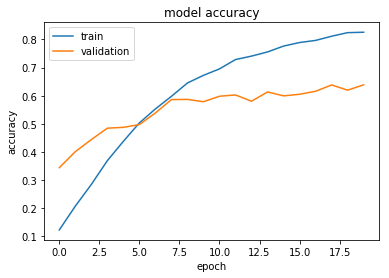

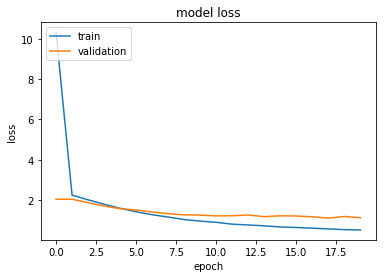

In [12]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5', 
                               verbose=1, save_best_only=True)

history = model.fit(X_train, y_train, batch_size=16, epochs=20, validation_data=(X_valid, y_valid),
                    shuffle=True, callbacks=[checkpointer], verbose=1)

plot_loss_acc(history)

### Test ResNet50

In [30]:
write_gap(ResNet50, (224, 224), resnet50.preprocess_input)

Found 17436 images belonging to 10 classes.
Found 4988 images belonging to 10 classes.
Found 0 images belonging to 0 classes.


In [87]:
X_train = []
X_valid = []
X_test = []

with h5py.File('gap_ResNet50.h5', 'r') as h:
    X_train.append(np.array(h['train']))
    X_valid.append(np.array(h['valid']))
    X_test.append(np.array(h['test']))
    y_train = np.array(h['tra_label'])
    y_valid = np.array(h['val_label'])
    
X_train = np.concatenate(X_train, axis=1)
X_valid = np.concatenate(X_valid, axis=1)
X_test = np.concatenate(X_test)
y_train = np_utils.to_categorical(y_train,  num_classes=10)
y_valid = np_utils.to_categorical(y_valid,  num_classes=10)


input_tensor = Input(X_train.shape[1:])
#x = GlobalAveragePooling1D()(input_tensor)
x = Dropout(0.5)(input_tensor)
x = Dense(10, activation='softmax')(x)
model = Model(input_tensor, x)

model.summary()

optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_42 (InputLayer)        (None, 2048)              0         
_________________________________________________________________
dropout_83 (Dropout)         (None, 2048)              0         
_________________________________________________________________
dense_118 (Dense)            (None, 10)                20490     
Total params: 20,490
Trainable params: 20,490
Non-trainable params: 0
_________________________________________________________________


Train on 17436 samples, validate on 4988 samples
Epoch 1/20
17436/17436 [==============================] - ETA: 18:35 - loss: 3.9248 - acc: 0.0000e+ - ETA: 1:12 - loss: 3.4491 - acc: 0.0898     - ETA: 39s - loss: 3.3296 - acc: 0.110 - ETA: 28s - loss: 3.2355 - acc: 0.11 - ETA: 22s - loss: 3.2017 - acc: 0.11 - ETA: 18s - loss: 3.1758 - acc: 0.11 - ETA: 15s - loss: 3.1734 - acc: 0.11 - ETA: 14s - loss: 3.1380 - acc: 0.11 - ETA: 12s - loss: 3.1214 - acc: 0.11 - ETA: 11s - loss: 3.1090 - acc: 0.11 - ETA: 10s - loss: 3.0963 - acc: 0.11 - ETA: 9s - loss: 3.0704 - acc: 0.1233 - ETA: 9s - loss: 3.0502 - acc: 0.126 - ETA: 8s - loss: 3.0437 - acc: 0.126 - ETA: 8s - loss: 3.0310 - acc: 0.128 - ETA: 8s - loss: 3.0254 - acc: 0.128 - ETA: 7s - loss: 3.0132 - acc: 0.129 - ETA: 7s - loss: 3.0079 - acc: 0.130 - ETA: 6s - loss: 2.9941 - acc: 0.131 - ETA: 6s - loss: 2.9871 - acc: 0.132 - ETA: 6s - loss: 2.9726 - acc: 0.134 - ETA: 6s - loss: 2.9529 - acc: 0.137 - ETA: 5s - loss: 2.9404 - acc: 0.139 - ETA:

17436/17436 [==============================] - ETA: 6s - loss: 0.8675 - acc: 0.687 - ETA: 4s - loss: 0.7385 - acc: 0.788 - ETA: 4s - loss: 0.6913 - acc: 0.790 - ETA: 4s - loss: 0.7005 - acc: 0.779 - ETA: 4s - loss: 0.7298 - acc: 0.773 - ETA: 4s - loss: 0.7333 - acc: 0.774 - ETA: 4s - loss: 0.7217 - acc: 0.783 - ETA: 4s - loss: 0.7047 - acc: 0.789 - ETA: 4s - loss: 0.6969 - acc: 0.788 - ETA: 4s - loss: 0.6964 - acc: 0.785 - ETA: 4s - loss: 0.6983 - acc: 0.783 - ETA: 3s - loss: 0.6885 - acc: 0.787 - ETA: 3s - loss: 0.6857 - acc: 0.790 - ETA: 3s - loss: 0.6826 - acc: 0.793 - ETA: 3s - loss: 0.6910 - acc: 0.788 - ETA: 3s - loss: 0.6900 - acc: 0.788 - ETA: 3s - loss: 0.6856 - acc: 0.792 - ETA: 3s - loss: 0.6905 - acc: 0.790 - ETA: 3s - loss: 0.6901 - acc: 0.786 - ETA: 3s - loss: 0.6969 - acc: 0.783 - ETA: 3s - loss: 0.6969 - acc: 0.783 - ETA: 3s - loss: 0.6953 - acc: 0.782 - ETA: 3s - loss: 0.6983 - acc: 0.782 - ETA: 3s - loss: 0.6988 - acc: 0.783 - ETA: 3s - loss: 0.7030 - acc: 0.781 - ETA

17436/17436 [==============================] - ETA: 4s - loss: 0.6136 - acc: 0.812 - ETA: 4s - loss: 0.5425 - acc: 0.848 - ETA: 4s - loss: 0.4610 - acc: 0.875 - ETA: 4s - loss: 0.4671 - acc: 0.871 - ETA: 4s - loss: 0.4562 - acc: 0.875 - ETA: 4s - loss: 0.4456 - acc: 0.878 - ETA: 4s - loss: 0.4409 - acc: 0.875 - ETA: 4s - loss: 0.4473 - acc: 0.870 - ETA: 4s - loss: 0.4438 - acc: 0.871 - ETA: 4s - loss: 0.4419 - acc: 0.870 - ETA: 4s - loss: 0.4409 - acc: 0.869 - ETA: 4s - loss: 0.4422 - acc: 0.869 - ETA: 3s - loss: 0.4445 - acc: 0.867 - ETA: 3s - loss: 0.4461 - acc: 0.865 - ETA: 3s - loss: 0.4462 - acc: 0.866 - ETA: 3s - loss: 0.4437 - acc: 0.866 - ETA: 3s - loss: 0.4434 - acc: 0.866 - ETA: 3s - loss: 0.4465 - acc: 0.866 - ETA: 3s - loss: 0.4468 - acc: 0.866 - ETA: 3s - loss: 0.4498 - acc: 0.864 - ETA: 3s - loss: 0.4535 - acc: 0.862 - ETA: 3s - loss: 0.4527 - acc: 0.863 - ETA: 3s - loss: 0.4518 - acc: 0.863 - ETA: 3s - loss: 0.4534 - acc: 0.862 - ETA: 3s - loss: 0.4526 - acc: 0.863 - ETA

17436/17436 [==============================] - ETA: 5s - loss: 0.4345 - acc: 0.875 - ETA: 4s - loss: 0.4136 - acc: 0.870 - ETA: 4s - loss: 0.3847 - acc: 0.889 - ETA: 4s - loss: 0.4096 - acc: 0.881 - ETA: 4s - loss: 0.3794 - acc: 0.895 - ETA: 4s - loss: 0.3672 - acc: 0.899 - ETA: 4s - loss: 0.3661 - acc: 0.899 - ETA: 4s - loss: 0.3599 - acc: 0.903 - ETA: 4s - loss: 0.3708 - acc: 0.894 - ETA: 4s - loss: 0.3597 - acc: 0.898 - ETA: 4s - loss: 0.3615 - acc: 0.896 - ETA: 4s - loss: 0.3587 - acc: 0.896 - ETA: 4s - loss: 0.3597 - acc: 0.897 - ETA: 3s - loss: 0.3570 - acc: 0.898 - ETA: 3s - loss: 0.3555 - acc: 0.898 - ETA: 3s - loss: 0.3517 - acc: 0.899 - ETA: 3s - loss: 0.3518 - acc: 0.899 - ETA: 3s - loss: 0.3544 - acc: 0.899 - ETA: 3s - loss: 0.3613 - acc: 0.896 - ETA: 3s - loss: 0.3584 - acc: 0.898 - ETA: 3s - loss: 0.3596 - acc: 0.898 - ETA: 3s - loss: 0.3612 - acc: 0.896 - ETA: 3s - loss: 0.3607 - acc: 0.896 - ETA: 3s - loss: 0.3612 - acc: 0.897 - ETA: 3s - loss: 0.3673 - acc: 0.895 - ETA

17436/17436 [==============================] - ETA: 7s - loss: 0.1496 - acc: 1.000 - ETA: 4s - loss: 0.2586 - acc: 0.923 - ETA: 5s - loss: 0.2850 - acc: 0.919 - ETA: 5s - loss: 0.2909 - acc: 0.919 - ETA: 5s - loss: 0.2754 - acc: 0.925 - ETA: 4s - loss: 0.2944 - acc: 0.914 - ETA: 4s - loss: 0.3017 - acc: 0.909 - ETA: 4s - loss: 0.3034 - acc: 0.909 - ETA: 4s - loss: 0.3016 - acc: 0.909 - ETA: 4s - loss: 0.3058 - acc: 0.908 - ETA: 4s - loss: 0.3055 - acc: 0.908 - ETA: 4s - loss: 0.3098 - acc: 0.906 - ETA: 4s - loss: 0.3113 - acc: 0.907 - ETA: 4s - loss: 0.3130 - acc: 0.908 - ETA: 3s - loss: 0.3125 - acc: 0.909 - ETA: 3s - loss: 0.3163 - acc: 0.908 - ETA: 3s - loss: 0.3171 - acc: 0.908 - ETA: 3s - loss: 0.3184 - acc: 0.909 - ETA: 3s - loss: 0.3257 - acc: 0.907 - ETA: 3s - loss: 0.3255 - acc: 0.908 - ETA: 3s - loss: 0.3279 - acc: 0.907 - ETA: 3s - loss: 0.3296 - acc: 0.907 - ETA: 3s - loss: 0.3289 - acc: 0.907 - ETA: 3s - loss: 0.3294 - acc: 0.905 - ETA: 3s - loss: 0.3275 - acc: 0.905 - ETA

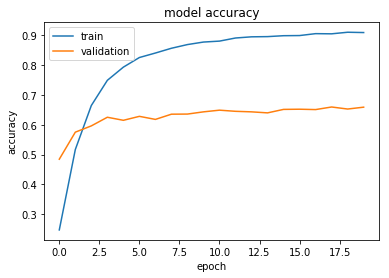

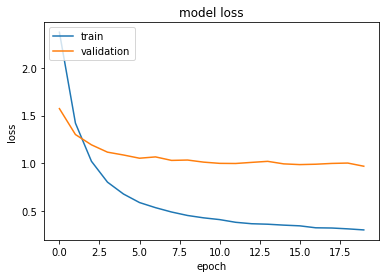

In [88]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.ResNet50.hdf5', 
                               verbose=1, save_best_only=True)

history = model.fit(X_train, y_train, batch_size=16, epochs=20, validation_data=(X_valid, y_valid),
                    shuffle=True, callbacks=[checkpointer], verbose=1)

plot_loss_acc(history)

### Test InceptionV3

In [ ]:
write_gap(InceptionV3, (299, 299), inception_v3.preprocess_input)

In [23]:
X_train = []
X_valid = []
X_test = []

with h5py.File('gap_InceptionV3.h5', 'r') as h:
    X_train.append(np.array(h['train']))
    X_valid.append(np.array(h['valid']))
    X_test.append(np.array(h['test']))
    y_train = np.array(h['tra_label'])
    y_valid = np.array(h['val_label'])
    
X_train = np.concatenate(X_train, axis=1)
X_valid = np.concatenate(X_valid, axis=1)
X_test = np.concatenate(X_test)
y_train = np_utils.to_categorical(y_train,  num_classes=10)
y_valid = np_utils.to_categorical(y_valid,  num_classes=10)


input_tensor = Input(X_train.shape[1:])
#x = GlobalAveragePooling1D()(input_tensor)
x = Dropout(0.5)(input_tensor)
x = Dense(10, activation='softmax')(x)
model = Model(input_tensor, x)

model.summary()

optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         (None, 2048)              0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 10)                20490     
Total params: 20,490
Trainable params: 20,490
Non-trainable params: 0
_________________________________________________________________


Train on 17436 samples, validate on 4988 samples
Epoch 1/20
17436/17436 [==============================] - 7s 403us/step - loss: 2.2076 - acc: 0.2269 - val_loss: 1.8529 - val_acc: 0.3799

Epoch 00001: val_loss improved from inf to 1.85288, saving model to saved_models/weights.best.InceptionV3.hdf5
Epoch 2/20
17436/17436 [==============================] - 6s 339us/step - loss: 1.6496 - acc: 0.4316 - val_loss: 1.6136 - val_acc: 0.5000

Epoch 00002: val_loss improved from 1.85288 to 1.61364, saving model to saved_models/weights.best.InceptionV3.hdf5
Epoch 3/20
17436/17436 [==============================] - 4s 249us/step - loss: 1.3565 - acc: 0.5571 - val_loss: 1.4901 - val_acc: 0.4986

Epoch 00003: val_loss improved from 1.61364 to 1.49006, saving model to saved_models/weights.best.InceptionV3.hdf5
Epoch 4/20
17436/17436 [==============================] - 5s 310us/step - loss: 1.1724 - acc: 0.6276 - val_loss: 1.3820 - val_acc: 0.5565

Epoch 00004: val_loss improved from 1.49006 to 1.38195

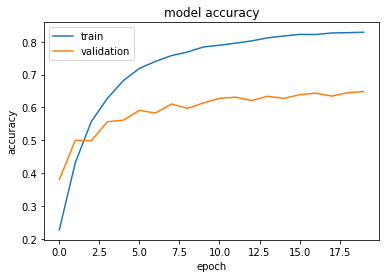

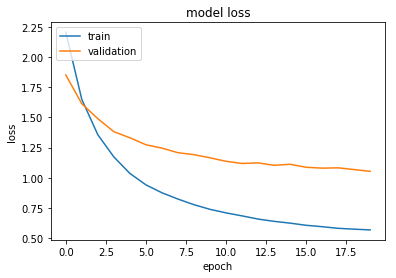

In [24]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.InceptionV3.hdf5', 
                               verbose=1, save_best_only=True)

history = model.fit(X_train, y_train, batch_size=16, epochs=20, validation_data=(X_valid, y_valid),
                    shuffle=True, callbacks=[checkpointer], verbose=1)

plot_loss_acc(history)

### Test Xception

In [6]:
write_gap(Xception, (299, 299), xception.preprocess_input)

83689472/83683744 [==============================] - ETA: 31:0 - ETA: 12:5 - ETA: 14:0 - ETA: 11:4 - ETA: 10:5 - ETA: 8:3 - ETA: 9: - ETA: 6: - ETA: 7: - ETA: 5: - ETA: 5: - ETA: 4: - ETA: 4: - ETA: 3: - ETA: 3: - ETA: 3: - ETA: 2: - ETA: 2: - ETA: 2: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 1: - ETA: 45s - ETA: 46 - ETA: 43 - ETA: 43 - ETA: 41 - ETA: 43 - ETA: 40 - ETA: 40 - ETA: 37 - ETA: 39 - ETA: 33 - ETA: 33 - ETA: 32 - ETA: 32 - ETA: 31 - ETA: 31 - ETA: 31 - ETA: 30 - ETA: 30 - ETA: 30 - ETA: 29 - ETA: 29 - ETA: 28 - ETA: 28 - ETA: 28 - ETA: 27 - ETA: 27 - ETA: 27 - ETA: 26 - ETA: 27 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 26 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 25 - ETA: 24 - ETA: 24 - ETA: 24 - ETA: 24 - ETA: 23 - ETA: 24 - ETA: 23 - ETA: 23 - ETA: 23 - ETA: 22 - ETA: 22 - ETA: 22 - ETA: 22 - ETA: 22 - ETA: 22 - ETA: 21 - ETA: 21 - ETA: 21 - ETA: 21 - ETA: 21 - ETA: 21 - ETA: 20 - ETA: 20 - ETA: 20 - ETA: 20 - ETA: 20 - ETA: 20 - ETA: 19 - ETA: 

In [52]:
X_train = []
X_valid = []
X_test = []

'''
for h5file in ["gap_Xception.h5", "gap_InceptionV3.h5"]:
    with h5py.File(h5file, 'r') as h:
        X_train.append(np.array(h['train']))
        X_valid.append(np.array(h['valid']))
        X_test.append(np.array(h['test']))
        y_train = np.array(h['tra_label'])
        y_valid = np.array(h['val_label'])
'''
with h5py.File('gap_Xception.h5', 'r') as h:
    X_train.append(np.array(h['train']))
    X_valid.append(np.array(h['valid']))
    X_test.append(np.array(h['test']))
    y_train = np.array(h['tra_label'])
    y_valid = np.array(h['val_label'])

    
X_train = np.concatenate(X_train, axis=1)
X_valid = np.concatenate(X_valid, axis=1)
X_test = np.concatenate(X_test)
y_train = np_utils.to_categorical(y_train,  num_classes=10)
y_valid = np_utils.to_categorical(y_valid,  num_classes=10)


input_tensor = Input(X_train.shape[1:])
#x = GlobalAveragePooling1D()(input_tensor)
x = Dropout(0.5)(input_tensor)
x = Dense(10, activation='softmax')(x)
model = Model(input_tensor, x)

model.summary()

optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)

model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_22 (InputLayer)        (None, 2048)              0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 2048)              0         
_________________________________________________________________
dense_20 (Dense)             (None, 10)                20490     
Total params: 20,490
Trainable params: 20,490
Non-trainable params: 0
_________________________________________________________________


Train on 17436 samples, validate on 4988 samples
Epoch 1/20
17436/17436 [==============================] - ETA: 14:12 - loss: 2.5440 - acc: 0.0000e+ - ETA: 1:04 - loss: 2.3736 - acc: 0.1295     - ETA: 34s - loss: 2.3629 - acc: 0.101 - ETA: 25s - loss: 2.3488 - acc: 0.10 - ETA: 19s - loss: 2.3377 - acc: 0.12 - ETA: 15s - loss: 2.3350 - acc: 0.12 - ETA: 13s - loss: 2.3338 - acc: 0.12 - ETA: 11s - loss: 2.3280 - acc: 0.13 - ETA: 10s - loss: 2.3265 - acc: 0.13 - ETA: 10s - loss: 2.3235 - acc: 0.13 - ETA: 9s - loss: 2.3208 - acc: 0.1364 - ETA: 8s - loss: 2.3162 - acc: 0.138 - ETA: 8s - loss: 2.3128 - acc: 0.141 - ETA: 7s - loss: 2.3091 - acc: 0.139 - ETA: 7s - loss: 2.3048 - acc: 0.141 - ETA: 7s - loss: 2.3007 - acc: 0.143 - ETA: 6s - loss: 2.2970 - acc: 0.145 - ETA: 6s - loss: 2.2941 - acc: 0.147 - ETA: 6s - loss: 2.2891 - acc: 0.150 - ETA: 6s - loss: 2.2846 - acc: 0.151 - ETA: 5s - loss: 2.2768 - acc: 0.155 - ETA: 5s - loss: 2.2707 - acc: 0.157 - ETA: 5s - loss: 2.2671 - acc: 0.160 - ETA:

17436/17436 [==============================] - ETA: 5s - loss: 0.9717 - acc: 0.812 - ETA: 4s - loss: 1.0911 - acc: 0.750 - ETA: 4s - loss: 1.1000 - acc: 0.731 - ETA: 4s - loss: 1.1042 - acc: 0.723 - ETA: 4s - loss: 1.1123 - acc: 0.731 - ETA: 4s - loss: 1.1071 - acc: 0.736 - ETA: 4s - loss: 1.1081 - acc: 0.737 - ETA: 3s - loss: 1.1152 - acc: 0.729 - ETA: 3s - loss: 1.1111 - acc: 0.734 - ETA: 3s - loss: 1.1162 - acc: 0.734 - ETA: 3s - loss: 1.1138 - acc: 0.734 - ETA: 3s - loss: 1.1200 - acc: 0.731 - ETA: 3s - loss: 1.1211 - acc: 0.729 - ETA: 3s - loss: 1.1276 - acc: 0.726 - ETA: 3s - loss: 1.1255 - acc: 0.725 - ETA: 3s - loss: 1.1289 - acc: 0.721 - ETA: 3s - loss: 1.1231 - acc: 0.722 - ETA: 3s - loss: 1.1225 - acc: 0.723 - ETA: 3s - loss: 1.1206 - acc: 0.725 - ETA: 3s - loss: 1.1184 - acc: 0.726 - ETA: 3s - loss: 1.1171 - acc: 0.726 - ETA: 3s - loss: 1.1146 - acc: 0.724 - ETA: 3s - loss: 1.1148 - acc: 0.725 - ETA: 3s - loss: 1.1158 - acc: 0.724 - ETA: 3s - loss: 1.1179 - acc: 0.723 - ETA

17436/17436 [==============================] - ETA: 5s - loss: 0.6686 - acc: 0.812 - ETA: 4s - loss: 0.7419 - acc: 0.812 - ETA: 4s - loss: 0.8012 - acc: 0.796 - ETA: 3s - loss: 0.7885 - acc: 0.817 - ETA: 4s - loss: 0.7971 - acc: 0.813 - ETA: 4s - loss: 0.7879 - acc: 0.817 - ETA: 4s - loss: 0.7983 - acc: 0.810 - ETA: 4s - loss: 0.8075 - acc: 0.802 - ETA: 3s - loss: 0.8103 - acc: 0.800 - ETA: 3s - loss: 0.8068 - acc: 0.800 - ETA: 3s - loss: 0.8137 - acc: 0.798 - ETA: 3s - loss: 0.8117 - acc: 0.799 - ETA: 3s - loss: 0.8030 - acc: 0.803 - ETA: 3s - loss: 0.8044 - acc: 0.803 - ETA: 3s - loss: 0.8007 - acc: 0.804 - ETA: 3s - loss: 0.7996 - acc: 0.805 - ETA: 3s - loss: 0.7980 - acc: 0.805 - ETA: 3s - loss: 0.7966 - acc: 0.806 - ETA: 3s - loss: 0.7931 - acc: 0.808 - ETA: 3s - loss: 0.7970 - acc: 0.804 - ETA: 3s - loss: 0.7993 - acc: 0.803 - ETA: 3s - loss: 0.8014 - acc: 0.802 - ETA: 3s - loss: 0.7950 - acc: 0.804 - ETA: 3s - loss: 0.7965 - acc: 0.804 - ETA: 3s - loss: 0.7972 - acc: 0.803 - ETA

17436/17436 [==============================] - ETA: 6s - loss: 0.6608 - acc: 0.812 - ETA: 4s - loss: 0.6540 - acc: 0.830 - ETA: 4s - loss: 0.6562 - acc: 0.840 - ETA: 4s - loss: 0.6654 - acc: 0.836 - ETA: 4s - loss: 0.6521 - acc: 0.842 - ETA: 3s - loss: 0.6431 - acc: 0.845 - ETA: 3s - loss: 0.6472 - acc: 0.844 - ETA: 3s - loss: 0.6344 - acc: 0.852 - ETA: 3s - loss: 0.6419 - acc: 0.849 - ETA: 3s - loss: 0.6419 - acc: 0.847 - ETA: 3s - loss: 0.6390 - acc: 0.849 - ETA: 3s - loss: 0.6324 - acc: 0.850 - ETA: 3s - loss: 0.6349 - acc: 0.851 - ETA: 3s - loss: 0.6359 - acc: 0.851 - ETA: 3s - loss: 0.6374 - acc: 0.849 - ETA: 3s - loss: 0.6386 - acc: 0.847 - ETA: 3s - loss: 0.6376 - acc: 0.848 - ETA: 3s - loss: 0.6374 - acc: 0.848 - ETA: 3s - loss: 0.6355 - acc: 0.849 - ETA: 3s - loss: 0.6325 - acc: 0.850 - ETA: 3s - loss: 0.6330 - acc: 0.850 - ETA: 3s - loss: 0.6320 - acc: 0.851 - ETA: 3s - loss: 0.6343 - acc: 0.850 - ETA: 2s - loss: 0.6311 - acc: 0.851 - ETA: 2s - loss: 0.6317 - acc: 0.850 - ETA

17436/17436 [==============================] - ETA: 6s - loss: 0.3480 - acc: 0.937 - ETA: 4s - loss: 0.6186 - acc: 0.821 - ETA: 4s - loss: 0.5928 - acc: 0.840 - ETA: 4s - loss: 0.5893 - acc: 0.843 - ETA: 4s - loss: 0.5772 - acc: 0.852 - ETA: 4s - loss: 0.5671 - acc: 0.856 - ETA: 4s - loss: 0.5684 - acc: 0.856 - ETA: 3s - loss: 0.5775 - acc: 0.853 - ETA: 3s - loss: 0.5728 - acc: 0.854 - ETA: 3s - loss: 0.5838 - acc: 0.849 - ETA: 3s - loss: 0.5868 - acc: 0.845 - ETA: 3s - loss: 0.5799 - acc: 0.847 - ETA: 3s - loss: 0.5797 - acc: 0.850 - ETA: 3s - loss: 0.5784 - acc: 0.852 - ETA: 3s - loss: 0.5797 - acc: 0.851 - ETA: 3s - loss: 0.5777 - acc: 0.852 - ETA: 3s - loss: 0.5747 - acc: 0.852 - ETA: 3s - loss: 0.5768 - acc: 0.852 - ETA: 3s - loss: 0.5757 - acc: 0.854 - ETA: 3s - loss: 0.5737 - acc: 0.855 - ETA: 3s - loss: 0.5747 - acc: 0.855 - ETA: 3s - loss: 0.5764 - acc: 0.855 - ETA: 3s - loss: 0.5755 - acc: 0.855 - ETA: 3s - loss: 0.5782 - acc: 0.854 - ETA: 3s - loss: 0.5773 - acc: 0.854 - ETA

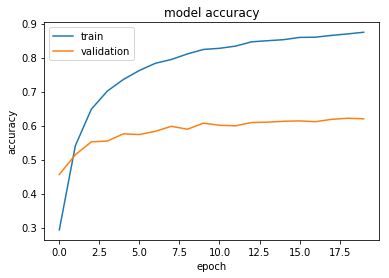

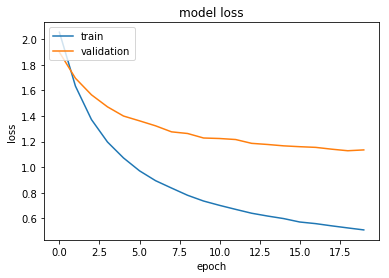

"\n# list all data in history\nprint(history.history.keys())\n# summarize history for accuracy\nplt.plot(history.history['acc'])\nplt.plot(history.history['val_acc'])\nplt.title('model accuracy')\nplt.ylabel('accuracy')\nplt.xlabel('epoch')\nplt.legend(['train', 'validation'], loc='upper left')\nplt.show()\n# summarize history for loss\nplt.plot(history.history['loss'])\nplt.plot(history.history['val_loss'])\nplt.title('model loss')\nplt.ylabel('loss')\nplt.xlabel('epoch')\nplt.legend(['train', 'validation'], loc='upper left')\nplt.show()\n"

In [53]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.Xception.hdf5', 
                               verbose=1, save_best_only=True)

history = model.fit(X_train, y_train, batch_size=16, epochs=20, validation_data=(X_valid, y_valid),
                    shuffle=True, callbacks=[checkpointer], verbose=1)

plot_loss_acc(history)

### Train Models

Because our dataset is very different from images on ImageNet, pretrained models has log loss about 0.9 at best, so we have to unlock layers and train these models

#### Image data for VGG16 and ResNet50

In [6]:
img_size = size224
gen = image.ImageDataGenerator()
#gen = image.ImageDataGenerator(rotation_range=15, width_shift_range=0.1)
train_generator = gen.flow_from_directory("train2", img_size, shuffle=True, batch_size=Batch)
valid_generator = gen.flow_from_directory("valid2", img_size, shuffle=True, batch_size=Batch)
#valid_tensors = paths_to_tensor(valid_files, img_size)

Found 17436 images belonging to 10 classes.
Found 4988 images belonging to 10 classes.


#### Train VGG16

In [17]:
#build and train VGG16
input_tensor = Input((224, 224, 3))
base_model = VGG16(input_tensor=input_tensor, weights='imagenet', include_top=False)
#x = input_tensor 
#for layer in base_model.layers[1:10]:
#    layer.trainable = False
x = Lambda(vgg16.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.7)(x)
#x = Dense(10, activation='softmax')(x)
x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=1990))(x)
model = Model(input_tensor, x)
#optv = optimizers.Adam(lr=1e-3, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=True)
optv = optimizers.SGD(lr=5e-4, decay=5e-5)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
lambda_6 (Lambda)            (None, 224, 224, 3)       0         
_________________________________________________________________
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_6 ( (None, 512)               0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 10)                5130      
Total params: 14,719,818
Trainable params: 14,719,818
Non-trainable params: 0
________________________________________________________________

Epoch 1/10
 204/1090 [====>.........................] - ETA: 15:45 - loss: 4.8695 - acc: 0.0000e+ - ETA: 9:21 - loss: 4.0513 - acc: 0.0625     - ETA: 7:12 - loss: 3.5060 - acc: 0.083 - ETA: 6:06 - loss: 3.3248 - acc: 0.109 - ETA: 5:26 - loss: 3.1700 - acc: 0.137 - ETA: 4:59 - loss: 3.1690 - acc: 0.125 - ETA: 4:40 - loss: 3.0293 - acc: 0.142 - ETA: 4:26 - loss: 2.9721 - acc: 0.148 - ETA: 4:15 - loss: 2.8944 - acc: 0.159 - ETA: 4:06 - loss: 2.8697 - acc: 0.150 - ETA: 3:58 - loss: 2.8463 - acc: 0.147 - ETA: 3:52 - loss: 2.8198 - acc: 0.135 - ETA: 3:47 - loss: 2.7834 - acc: 0.144 - ETA: 3:42 - loss: 2.7490 - acc: 0.147 - ETA: 3:38 - loss: 2.7296 - acc: 0.150 - ETA: 3:35 - loss: 2.7026 - acc: 0.148 - ETA: 3:32 - loss: 2.6801 - acc: 0.147 - ETA: 3:29 - loss: 2.6653 - acc: 0.142 - ETA: 3:27 - loss: 2.6539 - acc: 0.134 - ETA: 3:25 - loss: 2.6494 - acc: 0.131 - ETA: 3:23 - loss: 2.6333 - acc: 0.131 - ETA: 3:21 - loss: 2.6210 - acc: 0.133 - ETA: 3:19 - loss: 2.6113 - acc: 0.133 - ETA: 3:18 - los

 204/1090 [====>.........................] - ETA: 2:52 - loss: 0.2615 - acc: 1.000 - ETA: 2:54 - loss: 0.2056 - acc: 0.968 - ETA: 2:52 - loss: 0.2341 - acc: 0.958 - ETA: 2:51 - loss: 0.3208 - acc: 0.921 - ETA: 2:51 - loss: 0.3155 - acc: 0.925 - ETA: 2:52 - loss: 0.3274 - acc: 0.906 - ETA: 2:51 - loss: 0.3315 - acc: 0.901 - ETA: 2:51 - loss: 0.3318 - acc: 0.898 - ETA: 2:51 - loss: 0.3208 - acc: 0.902 - ETA: 2:50 - loss: 0.3157 - acc: 0.900 - ETA: 2:50 - loss: 0.3489 - acc: 0.880 - ETA: 2:50 - loss: 0.3555 - acc: 0.880 - ETA: 2:49 - loss: 0.3728 - acc: 0.870 - ETA: 2:49 - loss: 0.3848 - acc: 0.870 - ETA: 2:49 - loss: 0.3760 - acc: 0.875 - ETA: 2:49 - loss: 0.3656 - acc: 0.878 - ETA: 2:49 - loss: 0.3589 - acc: 0.882 - ETA: 2:49 - loss: 0.3486 - acc: 0.885 - ETA: 2:48 - loss: 0.3547 - acc: 0.881 - ETA: 2:48 - loss: 0.3523 - acc: 0.881 - ETA: 2:48 - loss: 0.3441 - acc: 0.883 - ETA: 2:47 - loss: 0.3449 - acc: 0.886 - ETA: 2:47 - loss: 0.3430 - acc: 0.885 - ETA: 2:47 - loss: 0.3420 - acc: 0.8

1090/1090 [==============================] - ETA: 8s - loss: 0.2705 - acc: 0.916 - ETA: 8s - loss: 0.2704 - acc: 0.916 - ETA: 8s - loss: 0.2711 - acc: 0.916 - ETA: 8s - loss: 0.2709 - acc: 0.916 - ETA: 7s - loss: 0.2711 - acc: 0.916 - ETA: 7s - loss: 0.2710 - acc: 0.916 - ETA: 7s - loss: 0.2708 - acc: 0.916 - ETA: 7s - loss: 0.2707 - acc: 0.916 - ETA: 7s - loss: 0.2706 - acc: 0.916 - ETA: 7s - loss: 0.2703 - acc: 0.916 - ETA: 6s - loss: 0.2703 - acc: 0.916 - ETA: 6s - loss: 0.2701 - acc: 0.916 - ETA: 6s - loss: 0.2698 - acc: 0.917 - ETA: 6s - loss: 0.2701 - acc: 0.916 - ETA: 6s - loss: 0.2703 - acc: 0.916 - ETA: 6s - loss: 0.2702 - acc: 0.916 - ETA: 5s - loss: 0.2703 - acc: 0.916 - ETA: 5s - loss: 0.2702 - acc: 0.916 - ETA: 5s - loss: 0.2702 - acc: 0.916 - ETA: 5s - loss: 0.2700 - acc: 0.916 - ETA: 5s - loss: 0.2699 - acc: 0.916 - ETA: 5s - loss: 0.2698 - acc: 0.917 - ETA: 4s - loss: 0.2697 - acc: 0.917 - ETA: 4s - loss: 0.2695 - acc: 0.917 - ETA: 4s - loss: 0.2694 - acc: 0.917 - ETA: 

 204/1090 [====>.........................] - ETA: 2:55 - loss: 0.0584 - acc: 1.000 - ETA: 2:56 - loss: 0.0987 - acc: 0.968 - ETA: 2:56 - loss: 0.2225 - acc: 0.958 - ETA: 2:56 - loss: 0.2302 - acc: 0.953 - ETA: 2:56 - loss: 0.1958 - acc: 0.962 - ETA: 2:56 - loss: 0.2522 - acc: 0.958 - ETA: 2:56 - loss: 0.2316 - acc: 0.964 - ETA: 2:55 - loss: 0.2041 - acc: 0.968 - ETA: 2:55 - loss: 0.1866 - acc: 0.972 - ETA: 2:55 - loss: 0.1736 - acc: 0.975 - ETA: 2:55 - loss: 0.1595 - acc: 0.977 - ETA: 2:55 - loss: 0.1476 - acc: 0.979 - ETA: 2:54 - loss: 0.1424 - acc: 0.980 - ETA: 2:54 - loss: 0.1365 - acc: 0.982 - ETA: 2:54 - loss: 0.1368 - acc: 0.979 - ETA: 2:54 - loss: 0.1284 - acc: 0.980 - ETA: 2:53 - loss: 0.1230 - acc: 0.981 - ETA: 2:53 - loss: 0.1259 - acc: 0.979 - ETA: 2:53 - loss: 0.1444 - acc: 0.973 - ETA: 2:53 - loss: 0.1412 - acc: 0.971 - ETA: 2:53 - loss: 0.1354 - acc: 0.973 - ETA: 2:52 - loss: 0.1320 - acc: 0.974 - ETA: 2:52 - loss: 0.1278 - acc: 0.975 - ETA: 2:52 - loss: 0.1238 - acc: 0.9

1090/1090 [==============================] - ETA: 8s - loss: 0.1026 - acc: 0.969 - ETA: 8s - loss: 0.1031 - acc: 0.969 - ETA: 8s - loss: 0.1030 - acc: 0.969 - ETA: 8s - loss: 0.1030 - acc: 0.969 - ETA: 7s - loss: 0.1029 - acc: 0.969 - ETA: 7s - loss: 0.1029 - acc: 0.969 - ETA: 7s - loss: 0.1028 - acc: 0.969 - ETA: 7s - loss: 0.1028 - acc: 0.969 - ETA: 7s - loss: 0.1028 - acc: 0.969 - ETA: 7s - loss: 0.1027 - acc: 0.969 - ETA: 6s - loss: 0.1027 - acc: 0.969 - ETA: 6s - loss: 0.1026 - acc: 0.969 - ETA: 6s - loss: 0.1025 - acc: 0.969 - ETA: 6s - loss: 0.1024 - acc: 0.969 - ETA: 6s - loss: 0.1024 - acc: 0.969 - ETA: 6s - loss: 0.1024 - acc: 0.969 - ETA: 5s - loss: 0.1026 - acc: 0.969 - ETA: 5s - loss: 0.1025 - acc: 0.969 - ETA: 5s - loss: 0.1024 - acc: 0.969 - ETA: 5s - loss: 0.1024 - acc: 0.969 - ETA: 5s - loss: 0.1023 - acc: 0.969 - ETA: 5s - loss: 0.1022 - acc: 0.969 - ETA: 4s - loss: 0.1023 - acc: 0.969 - ETA: 4s - loss: 0.1023 - acc: 0.969 - ETA: 4s - loss: 0.1024 - acc: 0.969 - ETA: 

 204/1090 [====>.........................] - ETA: 2:57 - loss: 0.0201 - acc: 1.000 - ETA: 2:57 - loss: 0.0274 - acc: 1.000 - ETA: 2:56 - loss: 0.0231 - acc: 1.000 - ETA: 2:56 - loss: 0.0184 - acc: 1.000 - ETA: 2:57 - loss: 0.0235 - acc: 1.000 - ETA: 2:57 - loss: 0.0205 - acc: 1.000 - ETA: 2:56 - loss: 0.0182 - acc: 1.000 - ETA: 2:56 - loss: 0.0337 - acc: 0.992 - ETA: 2:55 - loss: 0.0439 - acc: 0.986 - ETA: 2:55 - loss: 0.0399 - acc: 0.987 - ETA: 2:54 - loss: 0.0556 - acc: 0.983 - ETA: 2:54 - loss: 0.0649 - acc: 0.979 - ETA: 2:54 - loss: 0.0635 - acc: 0.976 - ETA: 2:54 - loss: 0.0674 - acc: 0.973 - ETA: 2:53 - loss: 0.0634 - acc: 0.975 - ETA: 2:53 - loss: 0.0642 - acc: 0.976 - ETA: 2:53 - loss: 0.0630 - acc: 0.977 - ETA: 2:53 - loss: 0.0634 - acc: 0.979 - ETA: 2:53 - loss: 0.0602 - acc: 0.980 - ETA: 2:53 - loss: 0.0614 - acc: 0.978 - ETA: 2:52 - loss: 0.0605 - acc: 0.979 - ETA: 2:52 - loss: 0.0579 - acc: 0.980 - ETA: 2:52 - loss: 0.0555 - acc: 0.981 - ETA: 2:52 - loss: 0.0536 - acc: 0.9

1090/1090 [==============================] - ETA: 8s - loss: 0.0603 - acc: 0.982 - ETA: 8s - loss: 0.0602 - acc: 0.982 - ETA: 8s - loss: 0.0602 - acc: 0.982 - ETA: 8s - loss: 0.0602 - acc: 0.982 - ETA: 7s - loss: 0.0602 - acc: 0.982 - ETA: 7s - loss: 0.0603 - acc: 0.982 - ETA: 7s - loss: 0.0602 - acc: 0.982 - ETA: 7s - loss: 0.0602 - acc: 0.982 - ETA: 7s - loss: 0.0601 - acc: 0.982 - ETA: 7s - loss: 0.0601 - acc: 0.982 - ETA: 6s - loss: 0.0601 - acc: 0.982 - ETA: 6s - loss: 0.0601 - acc: 0.982 - ETA: 6s - loss: 0.0600 - acc: 0.982 - ETA: 6s - loss: 0.0600 - acc: 0.982 - ETA: 6s - loss: 0.0599 - acc: 0.982 - ETA: 6s - loss: 0.0599 - acc: 0.982 - ETA: 5s - loss: 0.0599 - acc: 0.982 - ETA: 5s - loss: 0.0598 - acc: 0.982 - ETA: 5s - loss: 0.0602 - acc: 0.982 - ETA: 5s - loss: 0.0603 - acc: 0.982 - ETA: 5s - loss: 0.0602 - acc: 0.982 - ETA: 5s - loss: 0.0603 - acc: 0.982 - ETA: 5s - loss: 0.0602 - acc: 0.982 - ETA: 4s - loss: 0.0602 - acc: 0.982 - ETA: 4s - loss: 0.0602 - acc: 0.982 - ETA: 

 204/1090 [====>.........................] - ETA: 2:55 - loss: 0.0122 - acc: 1.000 - ETA: 2:55 - loss: 0.0070 - acc: 1.000 - ETA: 2:55 - loss: 0.0072 - acc: 1.000 - ETA: 2:55 - loss: 0.0294 - acc: 0.984 - ETA: 2:56 - loss: 0.0242 - acc: 0.987 - ETA: 2:55 - loss: 0.0288 - acc: 0.989 - ETA: 2:55 - loss: 0.0395 - acc: 0.982 - ETA: 2:54 - loss: 0.0371 - acc: 0.984 - ETA: 2:54 - loss: 0.0348 - acc: 0.986 - ETA: 2:54 - loss: 0.0337 - acc: 0.987 - ETA: 2:54 - loss: 0.0326 - acc: 0.988 - ETA: 2:54 - loss: 0.0373 - acc: 0.984 - ETA: 2:54 - loss: 0.0365 - acc: 0.985 - ETA: 2:53 - loss: 0.0339 - acc: 0.986 - ETA: 2:53 - loss: 0.0318 - acc: 0.987 - ETA: 2:53 - loss: 0.0473 - acc: 0.980 - ETA: 2:53 - loss: 0.0451 - acc: 0.981 - ETA: 2:53 - loss: 0.0436 - acc: 0.982 - ETA: 2:53 - loss: 0.0417 - acc: 0.983 - ETA: 2:53 - loss: 0.0398 - acc: 0.984 - ETA: 2:53 - loss: 0.0381 - acc: 0.985 - ETA: 2:52 - loss: 0.0370 - acc: 0.985 - ETA: 2:52 - loss: 0.0354 - acc: 0.986 - ETA: 2:52 - loss: 0.0340 - acc: 0.9

1090/1090 [==============================] - ETA: 8s - loss: 0.0420 - acc: 0.986 - ETA: 8s - loss: 0.0420 - acc: 0.986 - ETA: 8s - loss: 0.0420 - acc: 0.986 - ETA: 8s - loss: 0.0420 - acc: 0.986 - ETA: 7s - loss: 0.0420 - acc: 0.986 - ETA: 7s - loss: 0.0419 - acc: 0.986 - ETA: 7s - loss: 0.0419 - acc: 0.986 - ETA: 7s - loss: 0.0419 - acc: 0.986 - ETA: 7s - loss: 0.0418 - acc: 0.987 - ETA: 7s - loss: 0.0418 - acc: 0.987 - ETA: 6s - loss: 0.0418 - acc: 0.987 - ETA: 6s - loss: 0.0417 - acc: 0.987 - ETA: 6s - loss: 0.0417 - acc: 0.987 - ETA: 6s - loss: 0.0417 - acc: 0.987 - ETA: 6s - loss: 0.0416 - acc: 0.987 - ETA: 6s - loss: 0.0416 - acc: 0.987 - ETA: 5s - loss: 0.0416 - acc: 0.987 - ETA: 5s - loss: 0.0416 - acc: 0.987 - ETA: 5s - loss: 0.0416 - acc: 0.987 - ETA: 5s - loss: 0.0416 - acc: 0.987 - ETA: 5s - loss: 0.0415 - acc: 0.987 - ETA: 5s - loss: 0.0415 - acc: 0.987 - ETA: 5s - loss: 0.0415 - acc: 0.987 - ETA: 4s - loss: 0.0415 - acc: 0.987 - ETA: 4s - loss: 0.0415 - acc: 0.987 - ETA: 

 204/1090 [====>.........................] - ETA: 2:54 - loss: 0.0155 - acc: 1.000 - ETA: 2:54 - loss: 0.0082 - acc: 1.000 - ETA: 2:55 - loss: 0.0065 - acc: 1.000 - ETA: 2:56 - loss: 0.0081 - acc: 1.000 - ETA: 2:56 - loss: 0.0367 - acc: 0.987 - ETA: 2:55 - loss: 0.0369 - acc: 0.989 - ETA: 2:54 - loss: 0.0337 - acc: 0.991 - ETA: 2:54 - loss: 0.0298 - acc: 0.992 - ETA: 2:54 - loss: 0.0267 - acc: 0.993 - ETA: 2:54 - loss: 0.0572 - acc: 0.987 - ETA: 2:54 - loss: 0.0521 - acc: 0.988 - ETA: 2:53 - loss: 0.0478 - acc: 0.989 - ETA: 2:53 - loss: 0.0486 - acc: 0.990 - ETA: 2:53 - loss: 0.0480 - acc: 0.991 - ETA: 2:53 - loss: 0.0450 - acc: 0.991 - ETA: 2:52 - loss: 0.0425 - acc: 0.992 - ETA: 2:52 - loss: 0.0402 - acc: 0.992 - ETA: 2:52 - loss: 0.0381 - acc: 0.993 - ETA: 2:52 - loss: 0.0361 - acc: 0.993 - ETA: 2:52 - loss: 0.0351 - acc: 0.993 - ETA: 2:52 - loss: 0.0338 - acc: 0.994 - ETA: 2:51 - loss: 0.0325 - acc: 0.994 - ETA: 2:51 - loss: 0.0312 - acc: 0.994 - ETA: 2:51 - loss: 0.0301 - acc: 0.9

1090/1090 [==============================] - ETA: 8s - loss: 0.0278 - acc: 0.991 - ETA: 8s - loss: 0.0278 - acc: 0.991 - ETA: 8s - loss: 0.0279 - acc: 0.991 - ETA: 8s - loss: 0.0279 - acc: 0.991 - ETA: 7s - loss: 0.0280 - acc: 0.991 - ETA: 7s - loss: 0.0280 - acc: 0.991 - ETA: 7s - loss: 0.0281 - acc: 0.991 - ETA: 7s - loss: 0.0281 - acc: 0.991 - ETA: 7s - loss: 0.0281 - acc: 0.991 - ETA: 7s - loss: 0.0281 - acc: 0.991 - ETA: 6s - loss: 0.0281 - acc: 0.991 - ETA: 6s - loss: 0.0281 - acc: 0.991 - ETA: 6s - loss: 0.0280 - acc: 0.991 - ETA: 6s - loss: 0.0280 - acc: 0.991 - ETA: 6s - loss: 0.0280 - acc: 0.991 - ETA: 6s - loss: 0.0280 - acc: 0.991 - ETA: 5s - loss: 0.0280 - acc: 0.991 - ETA: 5s - loss: 0.0280 - acc: 0.991 - ETA: 5s - loss: 0.0280 - acc: 0.991 - ETA: 5s - loss: 0.0279 - acc: 0.991 - ETA: 5s - loss: 0.0279 - acc: 0.991 - ETA: 5s - loss: 0.0279 - acc: 0.991 - ETA: 5s - loss: 0.0279 - acc: 0.991 - ETA: 4s - loss: 0.0278 - acc: 0.991 - ETA: 4s - loss: 0.0278 - acc: 0.991 - ETA: 

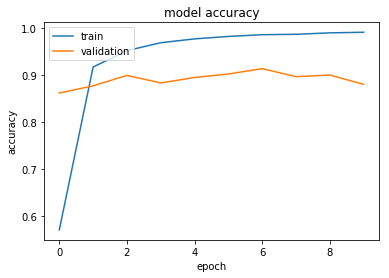

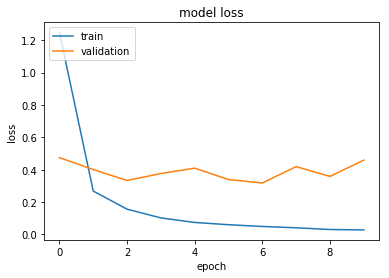

In [18]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.VGG16_3.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=10, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

#### Train VGG19

In [44]:
#build and train VGG19
input_tensor = Input((224, 224, 3))
base_model = VGG19(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(vgg19.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.8)(x)
x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=None))(x)
#x = Dense(10, activation='softmax')(x)
model = Model(input_tensor, x)
#optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
optv = optimizers.SGD(lr = 5e-4 ,decay=5e-5)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        (None, 224, 224, 3)       0         
_________________________________________________________________
lambda_17 (Lambda)           (None, 224, 224, 3)       0         
_________________________________________________________________
vgg19 (Model)                (None, 7, 7, 512)         20024384  
_________________________________________________________________
global_average_pooling2d_17  (None, 512)               0         
_________________________________________________________________
dropout_17 (Dropout)         (None, 512)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 10)                5130      
Total params: 20,029,514
Trainable params: 20,029,514
Non-trainable params: 0
________________________________________________________________

Epoch 1/20
204/545 [==========>...................] - ETA: 13:37 - loss: 4.3733 - acc: 0.03 - ETA: 8:15 - loss: 4.0267 - acc: 0.0625 - ETA: 6:30 - loss: 3.6812 - acc: 0.093 - ETA: 5:41 - loss: 3.4670 - acc: 0.101 - ETA: 5:09 - loss: 3.3539 - acc: 0.087 - ETA: 4:48 - loss: 3.2421 - acc: 0.083 - ETA: 4:32 - loss: 3.1811 - acc: 0.075 - ETA: 4:20 - loss: 3.0844 - acc: 0.085 - ETA: 4:11 - loss: 3.0118 - acc: 0.086 - ETA: 4:04 - loss: 2.9575 - acc: 0.090 - ETA: 3:58 - loss: 2.9263 - acc: 0.088 - ETA: 3:52 - loss: 2.8699 - acc: 0.096 - ETA: 3:49 - loss: 2.8305 - acc: 0.096 - ETA: 3:45 - loss: 2.8167 - acc: 0.093 - ETA: 3:41 - loss: 2.7900 - acc: 0.100 - ETA: 3:38 - loss: 2.7646 - acc: 0.099 - ETA: 3:35 - loss: 2.7367 - acc: 0.104 - ETA: 3:33 - loss: 2.7171 - acc: 0.099 - ETA: 3:30 - loss: 2.6985 - acc: 0.098 - ETA: 3:28 - loss: 2.6827 - acc: 0.096 - ETA: 3:27 - loss: 2.6721 - acc: 0.093 - ETA: 3:25 - loss: 2.6592 - acc: 0.095 - ETA: 3:23 - loss: 2.6479 - acc: 0.092 - ETA: 3:22 - loss: 2.6339 

204/545 [==========>...................] - ETA: 3:11 - loss: 1.3675 - acc: 0.531 - ETA: 3:06 - loss: 1.3443 - acc: 0.562 - ETA: 3:06 - loss: 1.4239 - acc: 0.500 - ETA: 3:04 - loss: 1.4972 - acc: 0.492 - ETA: 3:02 - loss: 1.5471 - acc: 0.481 - ETA: 3:02 - loss: 1.5231 - acc: 0.479 - ETA: 3:02 - loss: 1.5182 - acc: 0.491 - ETA: 3:02 - loss: 1.5094 - acc: 0.480 - ETA: 3:02 - loss: 1.5117 - acc: 0.496 - ETA: 3:01 - loss: 1.5161 - acc: 0.490 - ETA: 3:01 - loss: 1.5384 - acc: 0.474 - ETA: 3:00 - loss: 1.5488 - acc: 0.468 - ETA: 3:01 - loss: 1.5348 - acc: 0.480 - ETA: 3:01 - loss: 1.5275 - acc: 0.486 - ETA: 3:00 - loss: 1.5391 - acc: 0.479 - ETA: 3:00 - loss: 1.5234 - acc: 0.484 - ETA: 2:59 - loss: 1.5205 - acc: 0.483 - ETA: 3:00 - loss: 1.5261 - acc: 0.482 - ETA: 2:59 - loss: 1.5186 - acc: 0.481 - ETA: 2:59 - loss: 1.5125 - acc: 0.484 - ETA: 2:58 - loss: 1.5101 - acc: 0.485 - ETA: 2:58 - loss: 1.5126 - acc: 0.487 - ETA: 2:57 - loss: 1.5163 - acc: 0.489 - ETA: 2:57 - loss: 1.5174 - acc: 0.487

545/545 [==============================] - ETA: 45s - loss: 1.0954 - acc: 0.63 - ETA: 45s - loss: 1.0943 - acc: 0.63 - ETA: 44s - loss: 1.0932 - acc: 0.63 - ETA: 44s - loss: 1.0918 - acc: 0.63 - ETA: 44s - loss: 1.0906 - acc: 0.63 - ETA: 43s - loss: 1.0905 - acc: 0.63 - ETA: 43s - loss: 1.0892 - acc: 0.63 - ETA: 43s - loss: 1.0879 - acc: 0.63 - ETA: 42s - loss: 1.0866 - acc: 0.63 - ETA: 42s - loss: 1.0853 - acc: 0.63 - ETA: 42s - loss: 1.0840 - acc: 0.63 - ETA: 41s - loss: 1.0826 - acc: 0.63 - ETA: 41s - loss: 1.0818 - acc: 0.63 - ETA: 41s - loss: 1.0808 - acc: 0.63 - ETA: 40s - loss: 1.0795 - acc: 0.63 - ETA: 40s - loss: 1.0792 - acc: 0.63 - ETA: 40s - loss: 1.0778 - acc: 0.63 - ETA: 39s - loss: 1.0774 - acc: 0.63 - ETA: 39s - loss: 1.0767 - acc: 0.63 - ETA: 39s - loss: 1.0764 - acc: 0.63 - ETA: 38s - loss: 1.0757 - acc: 0.63 - ETA: 38s - loss: 1.0752 - acc: 0.63 - ETA: 38s - loss: 1.0746 - acc: 0.63 - ETA: 37s - loss: 1.0741 - acc: 0.64 - ETA: 37s - loss: 1.0735 - acc: 0.64 - ETA: 37

204/545 [==========>...................] - ETA: 3:02 - loss: 0.3265 - acc: 0.906 - ETA: 3:04 - loss: 0.3238 - acc: 0.890 - ETA: 3:01 - loss: 0.3272 - acc: 0.885 - ETA: 3:04 - loss: 0.3869 - acc: 0.851 - ETA: 3:03 - loss: 0.3951 - acc: 0.843 - ETA: 3:02 - loss: 0.3981 - acc: 0.838 - ETA: 3:02 - loss: 0.3840 - acc: 0.852 - ETA: 3:01 - loss: 0.3828 - acc: 0.855 - ETA: 3:01 - loss: 0.3819 - acc: 0.857 - ETA: 3:01 - loss: 0.3723 - acc: 0.865 - ETA: 3:01 - loss: 0.3771 - acc: 0.866 - ETA: 3:01 - loss: 0.3520 - acc: 0.877 - ETA: 3:00 - loss: 0.3577 - acc: 0.877 - ETA: 3:00 - loss: 0.3533 - acc: 0.881 - ETA: 2:59 - loss: 0.3479 - acc: 0.885 - ETA: 2:59 - loss: 0.3479 - acc: 0.884 - ETA: 2:59 - loss: 0.3389 - acc: 0.887 - ETA: 2:59 - loss: 0.3314 - acc: 0.892 - ETA: 2:59 - loss: 0.3225 - acc: 0.894 - ETA: 2:58 - loss: 0.3231 - acc: 0.895 - ETA: 2:58 - loss: 0.3221 - acc: 0.897 - ETA: 2:57 - loss: 0.3302 - acc: 0.896 - ETA: 2:57 - loss: 0.3338 - acc: 0.896 - ETA: 2:57 - loss: 0.3334 - acc: 0.895

545/545 [==============================] - ETA: 45s - loss: 0.2908 - acc: 0.90 - ETA: 45s - loss: 0.2912 - acc: 0.90 - ETA: 45s - loss: 0.2908 - acc: 0.90 - ETA: 44s - loss: 0.2906 - acc: 0.90 - ETA: 44s - loss: 0.2903 - acc: 0.90 - ETA: 44s - loss: 0.2902 - acc: 0.90 - ETA: 43s - loss: 0.2902 - acc: 0.90 - ETA: 43s - loss: 0.2899 - acc: 0.90 - ETA: 43s - loss: 0.2900 - acc: 0.90 - ETA: 42s - loss: 0.2896 - acc: 0.90 - ETA: 42s - loss: 0.2893 - acc: 0.91 - ETA: 42s - loss: 0.2891 - acc: 0.91 - ETA: 41s - loss: 0.2889 - acc: 0.91 - ETA: 41s - loss: 0.2887 - acc: 0.91 - ETA: 41s - loss: 0.2882 - acc: 0.91 - ETA: 40s - loss: 0.2878 - acc: 0.91 - ETA: 40s - loss: 0.2880 - acc: 0.91 - ETA: 40s - loss: 0.2877 - acc: 0.91 - ETA: 39s - loss: 0.2876 - acc: 0.91 - ETA: 39s - loss: 0.2874 - acc: 0.91 - ETA: 39s - loss: 0.2869 - acc: 0.91 - ETA: 38s - loss: 0.2865 - acc: 0.91 - ETA: 38s - loss: 0.2861 - acc: 0.91 - ETA: 37s - loss: 0.2857 - acc: 0.91 - ETA: 37s - loss: 0.2862 - acc: 0.91 - ETA: 37

204/545 [==========>...................] - ETA: 3:25 - loss: 0.1865 - acc: 0.937 - ETA: 3:18 - loss: 0.1542 - acc: 0.937 - ETA: 3:11 - loss: 0.1275 - acc: 0.958 - ETA: 3:11 - loss: 0.1042 - acc: 0.968 - ETA: 3:08 - loss: 0.0959 - acc: 0.975 - ETA: 3:08 - loss: 0.1347 - acc: 0.968 - ETA: 3:06 - loss: 0.1519 - acc: 0.968 - ETA: 3:05 - loss: 0.1416 - acc: 0.972 - ETA: 3:04 - loss: 0.1454 - acc: 0.968 - ETA: 3:04 - loss: 0.1459 - acc: 0.965 - ETA: 3:04 - loss: 0.1625 - acc: 0.957 - ETA: 3:03 - loss: 0.1612 - acc: 0.958 - ETA: 3:02 - loss: 0.1656 - acc: 0.956 - ETA: 3:02 - loss: 0.1660 - acc: 0.955 - ETA: 3:01 - loss: 0.1693 - acc: 0.954 - ETA: 3:00 - loss: 0.1661 - acc: 0.955 - ETA: 3:00 - loss: 0.1594 - acc: 0.955 - ETA: 2:59 - loss: 0.1580 - acc: 0.956 - ETA: 2:59 - loss: 0.1536 - acc: 0.957 - ETA: 2:58 - loss: 0.1537 - acc: 0.957 - ETA: 2:58 - loss: 0.1575 - acc: 0.955 - ETA: 2:57 - loss: 0.1601 - acc: 0.953 - ETA: 2:58 - loss: 0.1610 - acc: 0.953 - ETA: 2:57 - loss: 0.1593 - acc: 0.954

545/545 [==============================] - ETA: 45s - loss: 0.1584 - acc: 0.95 - ETA: 45s - loss: 0.1582 - acc: 0.95 - ETA: 44s - loss: 0.1581 - acc: 0.95 - ETA: 44s - loss: 0.1579 - acc: 0.95 - ETA: 44s - loss: 0.1576 - acc: 0.95 - ETA: 43s - loss: 0.1577 - acc: 0.95 - ETA: 43s - loss: 0.1574 - acc: 0.95 - ETA: 43s - loss: 0.1574 - acc: 0.95 - ETA: 42s - loss: 0.1576 - acc: 0.95 - ETA: 42s - loss: 0.1576 - acc: 0.95 - ETA: 42s - loss: 0.1577 - acc: 0.95 - ETA: 41s - loss: 0.1583 - acc: 0.95 - ETA: 41s - loss: 0.1583 - acc: 0.95 - ETA: 41s - loss: 0.1590 - acc: 0.95 - ETA: 40s - loss: 0.1587 - acc: 0.95 - ETA: 40s - loss: 0.1583 - acc: 0.95 - ETA: 40s - loss: 0.1580 - acc: 0.95 - ETA: 39s - loss: 0.1582 - acc: 0.95 - ETA: 39s - loss: 0.1580 - acc: 0.95 - ETA: 39s - loss: 0.1579 - acc: 0.95 - ETA: 38s - loss: 0.1581 - acc: 0.95 - ETA: 38s - loss: 0.1583 - acc: 0.95 - ETA: 38s - loss: 0.1581 - acc: 0.95 - ETA: 37s - loss: 0.1579 - acc: 0.95 - ETA: 37s - loss: 0.1577 - acc: 0.95 - ETA: 37

204/545 [==========>...................] - ETA: 3:08 - loss: 0.0192 - acc: 1.000 - ETA: 3:04 - loss: 0.0915 - acc: 0.984 - ETA: 3:04 - loss: 0.0898 - acc: 0.979 - ETA: 3:07 - loss: 0.0862 - acc: 0.976 - ETA: 3:05 - loss: 0.1534 - acc: 0.962 - ETA: 3:04 - loss: 0.1518 - acc: 0.963 - ETA: 3:03 - loss: 0.1525 - acc: 0.959 - ETA: 3:02 - loss: 0.1608 - acc: 0.957 - ETA: 3:02 - loss: 0.1436 - acc: 0.961 - ETA: 3:02 - loss: 0.1302 - acc: 0.965 - ETA: 3:02 - loss: 0.1229 - acc: 0.965 - ETA: 3:01 - loss: 0.1255 - acc: 0.960 - ETA: 3:01 - loss: 0.1176 - acc: 0.963 - ETA: 3:00 - loss: 0.1164 - acc: 0.964 - ETA: 3:00 - loss: 0.1138 - acc: 0.966 - ETA: 3:00 - loss: 0.1100 - acc: 0.968 - ETA: 3:00 - loss: 0.1074 - acc: 0.968 - ETA: 2:59 - loss: 0.1049 - acc: 0.968 - ETA: 2:59 - loss: 0.1022 - acc: 0.970 - ETA: 2:59 - loss: 0.1049 - acc: 0.968 - ETA: 2:59 - loss: 0.1163 - acc: 0.965 - ETA: 2:58 - loss: 0.1156 - acc: 0.964 - ETA: 2:58 - loss: 0.1128 - acc: 0.964 - ETA: 2:57 - loss: 0.1269 - acc: 0.962

545/545 [==============================] - ETA: 45s - loss: 0.1074 - acc: 0.96 - ETA: 45s - loss: 0.1072 - acc: 0.96 - ETA: 44s - loss: 0.1071 - acc: 0.96 - ETA: 44s - loss: 0.1069 - acc: 0.96 - ETA: 44s - loss: 0.1071 - acc: 0.96 - ETA: 43s - loss: 0.1070 - acc: 0.96 - ETA: 43s - loss: 0.1071 - acc: 0.96 - ETA: 43s - loss: 0.1070 - acc: 0.96 - ETA: 42s - loss: 0.1073 - acc: 0.96 - ETA: 42s - loss: 0.1071 - acc: 0.96 - ETA: 42s - loss: 0.1069 - acc: 0.96 - ETA: 41s - loss: 0.1067 - acc: 0.96 - ETA: 41s - loss: 0.1065 - acc: 0.96 - ETA: 41s - loss: 0.1064 - acc: 0.96 - ETA: 40s - loss: 0.1062 - acc: 0.96 - ETA: 40s - loss: 0.1061 - acc: 0.96 - ETA: 40s - loss: 0.1060 - acc: 0.96 - ETA: 39s - loss: 0.1060 - acc: 0.96 - ETA: 39s - loss: 0.1060 - acc: 0.96 - ETA: 39s - loss: 0.1059 - acc: 0.96 - ETA: 38s - loss: 0.1060 - acc: 0.96 - ETA: 38s - loss: 0.1060 - acc: 0.96 - ETA: 38s - loss: 0.1058 - acc: 0.96 - ETA: 37s - loss: 0.1056 - acc: 0.96 - ETA: 37s - loss: 0.1055 - acc: 0.96 - ETA: 37

204/545 [==========>...................] - ETA: 2:54 - loss: 0.0655 - acc: 1.000 - ETA: 2:58 - loss: 0.0434 - acc: 1.000 - ETA: 3:01 - loss: 0.0419 - acc: 1.000 - ETA: 3:01 - loss: 0.0544 - acc: 1.000 - ETA: 2:59 - loss: 0.1075 - acc: 0.987 - ETA: 2:59 - loss: 0.0929 - acc: 0.989 - ETA: 3:00 - loss: 0.0880 - acc: 0.986 - ETA: 3:00 - loss: 0.0834 - acc: 0.984 - ETA: 2:58 - loss: 0.1019 - acc: 0.974 - ETA: 2:58 - loss: 0.0967 - acc: 0.976 - ETA: 2:58 - loss: 0.0902 - acc: 0.978 - ETA: 2:58 - loss: 0.0836 - acc: 0.980 - ETA: 2:57 - loss: 0.0777 - acc: 0.982 - ETA: 2:57 - loss: 0.0725 - acc: 0.983 - ETA: 2:57 - loss: 0.0727 - acc: 0.982 - ETA: 2:57 - loss: 0.0700 - acc: 0.981 - ETA: 2:57 - loss: 0.0695 - acc: 0.980 - ETA: 2:56 - loss: 0.0688 - acc: 0.980 - ETA: 2:56 - loss: 0.0655 - acc: 0.981 - ETA: 2:56 - loss: 0.0630 - acc: 0.982 - ETA: 2:55 - loss: 0.0608 - acc: 0.983 - ETA: 2:56 - loss: 0.0589 - acc: 0.983 - ETA: 2:55 - loss: 0.0574 - acc: 0.984 - ETA: 2:55 - loss: 0.0566 - acc: 0.985

545/545 [==============================] - ETA: 45s - loss: 0.0768 - acc: 0.97 - ETA: 45s - loss: 0.0766 - acc: 0.97 - ETA: 44s - loss: 0.0768 - acc: 0.97 - ETA: 44s - loss: 0.0767 - acc: 0.97 - ETA: 44s - loss: 0.0766 - acc: 0.97 - ETA: 43s - loss: 0.0765 - acc: 0.97 - ETA: 43s - loss: 0.0764 - acc: 0.97 - ETA: 43s - loss: 0.0764 - acc: 0.97 - ETA: 42s - loss: 0.0763 - acc: 0.97 - ETA: 42s - loss: 0.0761 - acc: 0.97 - ETA: 42s - loss: 0.0765 - acc: 0.97 - ETA: 41s - loss: 0.0766 - acc: 0.97 - ETA: 41s - loss: 0.0765 - acc: 0.97 - ETA: 41s - loss: 0.0764 - acc: 0.97 - ETA: 40s - loss: 0.0764 - acc: 0.97 - ETA: 40s - loss: 0.0769 - acc: 0.97 - ETA: 40s - loss: 0.0770 - acc: 0.97 - ETA: 39s - loss: 0.0770 - acc: 0.97 - ETA: 39s - loss: 0.0768 - acc: 0.97 - ETA: 39s - loss: 0.0768 - acc: 0.97 - ETA: 38s - loss: 0.0767 - acc: 0.97 - ETA: 38s - loss: 0.0766 - acc: 0.97 - ETA: 38s - loss: 0.0764 - acc: 0.97 - ETA: 37s - loss: 0.0763 - acc: 0.97 - ETA: 37s - loss: 0.0762 - acc: 0.97 - ETA: 37

204/545 [==========>...................] - ETA: 3:02 - loss: 0.0317 - acc: 1.000 - ETA: 3:05 - loss: 0.0413 - acc: 0.984 - ETA: 3:03 - loss: 0.0297 - acc: 0.989 - ETA: 3:02 - loss: 0.0447 - acc: 0.984 - ETA: 3:05 - loss: 0.0510 - acc: 0.981 - ETA: 3:03 - loss: 0.0442 - acc: 0.984 - ETA: 3:02 - loss: 0.0454 - acc: 0.982 - ETA: 3:02 - loss: 0.0425 - acc: 0.984 - ETA: 3:01 - loss: 0.0402 - acc: 0.986 - ETA: 3:00 - loss: 0.0387 - acc: 0.987 - ETA: 3:00 - loss: 0.0388 - acc: 0.988 - ETA: 3:00 - loss: 0.0361 - acc: 0.989 - ETA: 2:59 - loss: 0.0342 - acc: 0.990 - ETA: 2:59 - loss: 0.0356 - acc: 0.988 - ETA: 2:58 - loss: 0.0344 - acc: 0.989 - ETA: 2:58 - loss: 0.0364 - acc: 0.988 - ETA: 2:58 - loss: 0.0346 - acc: 0.989 - ETA: 2:58 - loss: 0.0400 - acc: 0.987 - ETA: 2:57 - loss: 0.0417 - acc: 0.986 - ETA: 2:57 - loss: 0.0408 - acc: 0.987 - ETA: 2:57 - loss: 0.0405 - acc: 0.988 - ETA: 2:57 - loss: 0.0423 - acc: 0.985 - ETA: 2:56 - loss: 0.0415 - acc: 0.986 - ETA: 2:56 - loss: 0.0409 - acc: 0.987

545/545 [==============================] - ETA: 45s - loss: 0.0551 - acc: 0.98 - ETA: 45s - loss: 0.0550 - acc: 0.98 - ETA: 44s - loss: 0.0552 - acc: 0.98 - ETA: 44s - loss: 0.0550 - acc: 0.98 - ETA: 44s - loss: 0.0552 - acc: 0.98 - ETA: 43s - loss: 0.0553 - acc: 0.98 - ETA: 43s - loss: 0.0552 - acc: 0.98 - ETA: 43s - loss: 0.0558 - acc: 0.98 - ETA: 42s - loss: 0.0558 - acc: 0.98 - ETA: 42s - loss: 0.0559 - acc: 0.98 - ETA: 42s - loss: 0.0558 - acc: 0.98 - ETA: 41s - loss: 0.0559 - acc: 0.98 - ETA: 41s - loss: 0.0557 - acc: 0.98 - ETA: 40s - loss: 0.0557 - acc: 0.98 - ETA: 40s - loss: 0.0557 - acc: 0.98 - ETA: 40s - loss: 0.0558 - acc: 0.98 - ETA: 39s - loss: 0.0558 - acc: 0.98 - ETA: 39s - loss: 0.0558 - acc: 0.98 - ETA: 39s - loss: 0.0557 - acc: 0.98 - ETA: 38s - loss: 0.0558 - acc: 0.98 - ETA: 38s - loss: 0.0558 - acc: 0.98 - ETA: 38s - loss: 0.0557 - acc: 0.98 - ETA: 37s - loss: 0.0556 - acc: 0.98 - ETA: 37s - loss: 0.0555 - acc: 0.98 - ETA: 37s - loss: 0.0557 - acc: 0.98 - ETA: 36

204/545 [==========>...................] - ETA: 2:56 - loss: 0.0367 - acc: 0.968 - ETA: 3:02 - loss: 0.0358 - acc: 0.968 - ETA: 3:00 - loss: 0.0374 - acc: 0.979 - ETA: 3:05 - loss: 0.0294 - acc: 0.984 - ETA: 3:04 - loss: 0.0242 - acc: 0.987 - ETA: 3:03 - loss: 0.0320 - acc: 0.984 - ETA: 3:01 - loss: 0.0372 - acc: 0.982 - ETA: 3:01 - loss: 0.0455 - acc: 0.980 - ETA: 3:00 - loss: 0.0415 - acc: 0.982 - ETA: 3:00 - loss: 0.0427 - acc: 0.981 - ETA: 3:00 - loss: 0.0447 - acc: 0.983 - ETA: 2:59 - loss: 0.0460 - acc: 0.981 - ETA: 2:59 - loss: 0.0480 - acc: 0.980 - ETA: 2:59 - loss: 0.0476 - acc: 0.982 - ETA: 2:58 - loss: 0.0488 - acc: 0.981 - ETA: 2:58 - loss: 0.0469 - acc: 0.982 - ETA: 2:58 - loss: 0.0472 - acc: 0.981 - ETA: 2:58 - loss: 0.0446 - acc: 0.982 - ETA: 2:58 - loss: 0.0467 - acc: 0.981 - ETA: 2:57 - loss: 0.0466 - acc: 0.981 - ETA: 2:57 - loss: 0.0449 - acc: 0.982 - ETA: 2:56 - loss: 0.0440 - acc: 0.983 - ETA: 2:56 - loss: 0.0436 - acc: 0.983 - ETA: 2:56 - loss: 0.0494 - acc: 0.981

545/545 [==============================] - ETA: 45s - loss: 0.0514 - acc: 0.98 - ETA: 45s - loss: 0.0513 - acc: 0.98 - ETA: 44s - loss: 0.0515 - acc: 0.98 - ETA: 44s - loss: 0.0514 - acc: 0.98 - ETA: 44s - loss: 0.0513 - acc: 0.98 - ETA: 43s - loss: 0.0513 - acc: 0.98 - ETA: 43s - loss: 0.0512 - acc: 0.98 - ETA: 42s - loss: 0.0512 - acc: 0.98 - ETA: 42s - loss: 0.0512 - acc: 0.98 - ETA: 42s - loss: 0.0511 - acc: 0.98 - ETA: 41s - loss: 0.0511 - acc: 0.98 - ETA: 41s - loss: 0.0511 - acc: 0.98 - ETA: 41s - loss: 0.0511 - acc: 0.98 - ETA: 40s - loss: 0.0510 - acc: 0.98 - ETA: 40s - loss: 0.0511 - acc: 0.98 - ETA: 40s - loss: 0.0513 - acc: 0.98 - ETA: 39s - loss: 0.0512 - acc: 0.98 - ETA: 39s - loss: 0.0511 - acc: 0.98 - ETA: 39s - loss: 0.0511 - acc: 0.98 - ETA: 38s - loss: 0.0511 - acc: 0.98 - ETA: 38s - loss: 0.0511 - acc: 0.98 - ETA: 38s - loss: 0.0511 - acc: 0.98 - ETA: 37s - loss: 0.0510 - acc: 0.98 - ETA: 37s - loss: 0.0511 - acc: 0.98 - ETA: 37s - loss: 0.0510 - acc: 0.98 - ETA: 36

204/545 [==========>...................] - ETA: 2:56 - loss: 0.0895 - acc: 0.968 - ETA: 3:00 - loss: 0.0942 - acc: 0.937 - ETA: 3:02 - loss: 0.0716 - acc: 0.958 - ETA: 3:03 - loss: 0.0599 - acc: 0.968 - ETA: 3:01 - loss: 0.0496 - acc: 0.975 - ETA: 3:03 - loss: 0.0427 - acc: 0.979 - ETA: 3:03 - loss: 0.0370 - acc: 0.982 - ETA: 3:02 - loss: 0.0325 - acc: 0.984 - ETA: 3:03 - loss: 0.0322 - acc: 0.986 - ETA: 3:02 - loss: 0.0308 - acc: 0.987 - ETA: 3:01 - loss: 0.0292 - acc: 0.988 - ETA: 3:00 - loss: 0.0300 - acc: 0.987 - ETA: 3:00 - loss: 0.0285 - acc: 0.988 - ETA: 3:00 - loss: 0.0280 - acc: 0.988 - ETA: 2:59 - loss: 0.0266 - acc: 0.989 - ETA: 2:59 - loss: 0.0278 - acc: 0.990 - ETA: 2:58 - loss: 0.0264 - acc: 0.990 - ETA: 2:58 - loss: 0.0275 - acc: 0.989 - ETA: 2:57 - loss: 0.0322 - acc: 0.988 - ETA: 2:57 - loss: 0.0325 - acc: 0.989 - ETA: 2:57 - loss: 0.0317 - acc: 0.989 - ETA: 2:56 - loss: 0.0382 - acc: 0.988 - ETA: 2:56 - loss: 0.0371 - acc: 0.989 - ETA: 2:55 - loss: 0.0376 - acc: 0.988

545/545 [==============================] - ETA: 45s - loss: 0.0408 - acc: 0.98 - ETA: 45s - loss: 0.0409 - acc: 0.98 - ETA: 44s - loss: 0.0413 - acc: 0.98 - ETA: 44s - loss: 0.0413 - acc: 0.98 - ETA: 44s - loss: 0.0412 - acc: 0.98 - ETA: 43s - loss: 0.0411 - acc: 0.98 - ETA: 43s - loss: 0.0411 - acc: 0.98 - ETA: 42s - loss: 0.0410 - acc: 0.98 - ETA: 42s - loss: 0.0409 - acc: 0.98 - ETA: 42s - loss: 0.0411 - acc: 0.98 - ETA: 41s - loss: 0.0414 - acc: 0.98 - ETA: 41s - loss: 0.0416 - acc: 0.98 - ETA: 41s - loss: 0.0416 - acc: 0.98 - ETA: 40s - loss: 0.0417 - acc: 0.98 - ETA: 40s - loss: 0.0420 - acc: 0.98 - ETA: 40s - loss: 0.0420 - acc: 0.98 - ETA: 39s - loss: 0.0423 - acc: 0.98 - ETA: 39s - loss: 0.0423 - acc: 0.98 - ETA: 39s - loss: 0.0423 - acc: 0.98 - ETA: 38s - loss: 0.0422 - acc: 0.98 - ETA: 38s - loss: 0.0422 - acc: 0.98 - ETA: 38s - loss: 0.0422 - acc: 0.98 - ETA: 37s - loss: 0.0422 - acc: 0.98 - ETA: 37s - loss: 0.0425 - acc: 0.98 - ETA: 37s - loss: 0.0424 - acc: 0.98 - ETA: 36

204/545 [==========>...................] - ETA: 3:05 - loss: 0.0051 - acc: 1.000 - ETA: 3:06 - loss: 0.0212 - acc: 1.000 - ETA: 3:06 - loss: 0.0159 - acc: 1.000 - ETA: 3:06 - loss: 0.0276 - acc: 0.992 - ETA: 3:06 - loss: 0.0276 - acc: 0.993 - ETA: 3:06 - loss: 0.0245 - acc: 0.994 - ETA: 3:05 - loss: 0.0217 - acc: 0.995 - ETA: 3:05 - loss: 0.0207 - acc: 0.996 - ETA: 3:04 - loss: 0.0231 - acc: 0.996 - ETA: 3:04 - loss: 0.0256 - acc: 0.993 - ETA: 3:04 - loss: 0.0254 - acc: 0.994 - ETA: 3:03 - loss: 0.0242 - acc: 0.994 - ETA: 3:03 - loss: 0.0313 - acc: 0.992 - ETA: 3:02 - loss: 0.0310 - acc: 0.993 - ETA: 3:02 - loss: 0.0301 - acc: 0.993 - ETA: 3:01 - loss: 0.0316 - acc: 0.992 - ETA: 3:01 - loss: 0.0310 - acc: 0.992 - ETA: 3:00 - loss: 0.0306 - acc: 0.993 - ETA: 3:00 - loss: 0.0303 - acc: 0.991 - ETA: 2:59 - loss: 0.0292 - acc: 0.992 - ETA: 2:59 - loss: 0.0279 - acc: 0.992 - ETA: 2:59 - loss: 0.0289 - acc: 0.991 - ETA: 2:58 - loss: 0.0281 - acc: 0.991 - ETA: 2:58 - loss: 0.0276 - acc: 0.992

545/545 [==============================] - ETA: 45s - loss: 0.0337 - acc: 0.98 - ETA: 45s - loss: 0.0336 - acc: 0.98 - ETA: 44s - loss: 0.0336 - acc: 0.98 - ETA: 44s - loss: 0.0336 - acc: 0.98 - ETA: 44s - loss: 0.0337 - acc: 0.98 - ETA: 43s - loss: 0.0337 - acc: 0.98 - ETA: 43s - loss: 0.0338 - acc: 0.98 - ETA: 43s - loss: 0.0338 - acc: 0.98 - ETA: 42s - loss: 0.0341 - acc: 0.98 - ETA: 42s - loss: 0.0341 - acc: 0.98 - ETA: 42s - loss: 0.0341 - acc: 0.98 - ETA: 41s - loss: 0.0340 - acc: 0.98 - ETA: 41s - loss: 0.0339 - acc: 0.98 - ETA: 41s - loss: 0.0339 - acc: 0.98 - ETA: 40s - loss: 0.0339 - acc: 0.98 - ETA: 40s - loss: 0.0339 - acc: 0.98 - ETA: 40s - loss: 0.0339 - acc: 0.98 - ETA: 39s - loss: 0.0339 - acc: 0.98 - ETA: 39s - loss: 0.0338 - acc: 0.98 - ETA: 38s - loss: 0.0339 - acc: 0.98 - ETA: 38s - loss: 0.0338 - acc: 0.98 - ETA: 38s - loss: 0.0337 - acc: 0.98 - ETA: 37s - loss: 0.0337 - acc: 0.98 - ETA: 37s - loss: 0.0339 - acc: 0.98 - ETA: 37s - loss: 0.0338 - acc: 0.98 - ETA: 36

204/545 [==========>...................] - ETA: 3:02 - loss: 0.0121 - acc: 1.000 - ETA: 3:06 - loss: 0.0213 - acc: 1.000 - ETA: 3:04 - loss: 0.0143 - acc: 1.000 - ETA: 3:03 - loss: 0.0109 - acc: 1.000 - ETA: 3:03 - loss: 0.0210 - acc: 0.993 - ETA: 3:03 - loss: 0.0189 - acc: 0.994 - ETA: 3:01 - loss: 0.0163 - acc: 0.995 - ETA: 3:01 - loss: 0.0170 - acc: 0.996 - ETA: 3:00 - loss: 0.0255 - acc: 0.993 - ETA: 3:00 - loss: 0.0292 - acc: 0.987 - ETA: 3:01 - loss: 0.0280 - acc: 0.988 - ETA: 3:01 - loss: 0.0259 - acc: 0.989 - ETA: 3:00 - loss: 0.0314 - acc: 0.985 - ETA: 2:59 - loss: 0.0319 - acc: 0.986 - ETA: 3:00 - loss: 0.0388 - acc: 0.985 - ETA: 2:59 - loss: 0.0430 - acc: 0.984 - ETA: 2:59 - loss: 0.0406 - acc: 0.985 - ETA: 2:59 - loss: 0.0464 - acc: 0.982 - ETA: 2:59 - loss: 0.0447 - acc: 0.983 - ETA: 2:58 - loss: 0.0481 - acc: 0.982 - ETA: 2:58 - loss: 0.0477 - acc: 0.983 - ETA: 2:58 - loss: 0.0461 - acc: 0.984 - ETA: 2:57 - loss: 0.0443 - acc: 0.985 - ETA: 2:57 - loss: 0.0460 - acc: 0.984

545/545 [==============================] - ETA: 45s - loss: 0.0288 - acc: 0.99 - ETA: 45s - loss: 0.0288 - acc: 0.99 - ETA: 44s - loss: 0.0287 - acc: 0.99 - ETA: 44s - loss: 0.0287 - acc: 0.99 - ETA: 44s - loss: 0.0289 - acc: 0.99 - ETA: 43s - loss: 0.0290 - acc: 0.99 - ETA: 43s - loss: 0.0290 - acc: 0.99 - ETA: 43s - loss: 0.0290 - acc: 0.99 - ETA: 42s - loss: 0.0290 - acc: 0.99 - ETA: 42s - loss: 0.0290 - acc: 0.99 - ETA: 42s - loss: 0.0289 - acc: 0.99 - ETA: 41s - loss: 0.0289 - acc: 0.99 - ETA: 41s - loss: 0.0288 - acc: 0.99 - ETA: 41s - loss: 0.0287 - acc: 0.99 - ETA: 40s - loss: 0.0288 - acc: 0.99 - ETA: 40s - loss: 0.0287 - acc: 0.99 - ETA: 40s - loss: 0.0288 - acc: 0.99 - ETA: 39s - loss: 0.0287 - acc: 0.99 - ETA: 39s - loss: 0.0286 - acc: 0.99 - ETA: 39s - loss: 0.0286 - acc: 0.99 - ETA: 38s - loss: 0.0285 - acc: 0.99 - ETA: 38s - loss: 0.0284 - acc: 0.99 - ETA: 38s - loss: 0.0284 - acc: 0.99 - ETA: 37s - loss: 0.0284 - acc: 0.99 - ETA: 37s - loss: 0.0283 - acc: 0.99 - ETA: 37

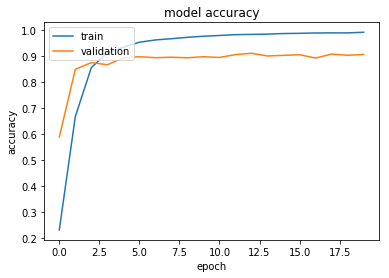

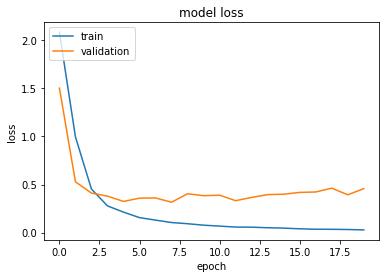

In [39]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.VGG19_2.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=20, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

#### Train ResNet50

In [5]:
#build and train ResNet50
input_tensor = Input((224, 224, 3))
base_model = ResNet50(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(resnet50.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.8)(x)
x = Dense(10, activation='softmax')(x)
model = Model(input_tensor, x)
optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#optv = optimizers.SGD(lr = 1e-3)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Model)             (None, 1, 1, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                20490     
Total params: 23,608,202
Trainable params: 23,555,082
Non-trainable params: 53,120
___________________________________________________________

In [18]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.sgd.ResNet50.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=10, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

Epoch 1/10
204/545 [==========>...................] - ETA: 1:19:36 - loss: 3.5482 - acc: 0.06 - ETA: 40:56 - loss: 3.3129 - acc: 0.0938 - ETA: 28:00 - loss: 3.4306 - acc: 0.07 - ETA: 21:32 - loss: 3.3117 - acc: 0.11 - ETA: 17:38 - loss: 3.3778 - acc: 0.11 - ETA: 15:05 - loss: 3.3704 - acc: 0.09 - ETA: 13:16 - loss: 3.3665 - acc: 0.08 - ETA: 11:53 - loss: 3.3779 - acc: 0.08 - ETA: 10:49 - loss: 3.3555 - acc: 0.09 - ETA: 9:57 - loss: 3.3336 - acc: 0.1000 - ETA: 9:15 - loss: 3.3350 - acc: 0.093 - ETA: 8:39 - loss: 3.2870 - acc: 0.099 - ETA: 8:09 - loss: 3.3239 - acc: 0.098 - ETA: 7:44 - loss: 3.2955 - acc: 0.102 - ETA: 7:21 - loss: 3.2555 - acc: 0.102 - ETA: 7:02 - loss: 3.2422 - acc: 0.105 - ETA: 6:44 - loss: 3.2313 - acc: 0.110 - ETA: 6:29 - loss: 3.2248 - acc: 0.109 - ETA: 6:15 - loss: 3.2203 - acc: 0.111 - ETA: 6:03 - loss: 3.2155 - acc: 0.112 - ETA: 5:51 - loss: 3.2200 - acc: 0.111 - ETA: 5:41 - loss: 3.2001 - acc: 0.113 - ETA: 5:31 - loss: 3.2101 - acc: 0.112 - ETA: 5:23 - loss: 3.1

204/545 [==========>...................] - ETA: 2:23 - loss: 1.1042 - acc: 0.625 - ETA: 2:18 - loss: 0.9881 - acc: 0.671 - ETA: 2:18 - loss: 0.8804 - acc: 0.729 - ETA: 2:21 - loss: 0.8590 - acc: 0.750 - ETA: 2:19 - loss: 0.8463 - acc: 0.743 - ETA: 2:19 - loss: 0.8156 - acc: 0.755 - ETA: 2:19 - loss: 0.8212 - acc: 0.745 - ETA: 2:19 - loss: 0.8194 - acc: 0.746 - ETA: 2:19 - loss: 0.8360 - acc: 0.739 - ETA: 2:20 - loss: 0.8634 - acc: 0.731 - ETA: 2:20 - loss: 0.8763 - acc: 0.718 - ETA: 2:20 - loss: 0.8906 - acc: 0.718 - ETA: 2:18 - loss: 0.8808 - acc: 0.721 - ETA: 2:18 - loss: 0.8793 - acc: 0.716 - ETA: 2:17 - loss: 0.8822 - acc: 0.714 - ETA: 2:17 - loss: 0.8766 - acc: 0.716 - ETA: 2:17 - loss: 0.8788 - acc: 0.716 - ETA: 2:16 - loss: 0.8824 - acc: 0.715 - ETA: 2:16 - loss: 0.8919 - acc: 0.713 - ETA: 2:16 - loss: 0.8905 - acc: 0.714 - ETA: 2:16 - loss: 0.8890 - acc: 0.714 - ETA: 2:15 - loss: 0.8859 - acc: 0.710 - ETA: 2:15 - loss: 0.8787 - acc: 0.714 - ETA: 2:15 - loss: 0.8725 - acc: 0.716

545/545 [==============================] - ETA: 34s - loss: 0.6072 - acc: 0.81 - ETA: 33s - loss: 0.6064 - acc: 0.81 - ETA: 33s - loss: 0.6057 - acc: 0.81 - ETA: 33s - loss: 0.6055 - acc: 0.81 - ETA: 33s - loss: 0.6048 - acc: 0.81 - ETA: 32s - loss: 0.6043 - acc: 0.81 - ETA: 32s - loss: 0.6041 - acc: 0.81 - ETA: 32s - loss: 0.6034 - acc: 0.81 - ETA: 32s - loss: 0.6028 - acc: 0.81 - ETA: 31s - loss: 0.6023 - acc: 0.81 - ETA: 31s - loss: 0.6020 - acc: 0.81 - ETA: 31s - loss: 0.6016 - acc: 0.81 - ETA: 31s - loss: 0.6012 - acc: 0.81 - ETA: 30s - loss: 0.6006 - acc: 0.81 - ETA: 30s - loss: 0.6005 - acc: 0.81 - ETA: 30s - loss: 0.6003 - acc: 0.81 - ETA: 30s - loss: 0.6000 - acc: 0.81 - ETA: 29s - loss: 0.5995 - acc: 0.81 - ETA: 29s - loss: 0.5995 - acc: 0.81 - ETA: 29s - loss: 0.5991 - acc: 0.81 - ETA: 28s - loss: 0.5987 - acc: 0.81 - ETA: 28s - loss: 0.5983 - acc: 0.81 - ETA: 28s - loss: 0.5981 - acc: 0.81 - ETA: 28s - loss: 0.5975 - acc: 0.81 - ETA: 27s - loss: 0.5973 - acc: 0.81 - ETA: 27

204/545 [==========>...................] - ETA: 2:22 - loss: 0.1823 - acc: 0.937 - ETA: 2:20 - loss: 0.1642 - acc: 0.953 - ETA: 2:20 - loss: 0.2010 - acc: 0.947 - ETA: 2:19 - loss: 0.1894 - acc: 0.953 - ETA: 2:21 - loss: 0.1667 - acc: 0.962 - ETA: 2:19 - loss: 0.1637 - acc: 0.963 - ETA: 2:19 - loss: 0.1771 - acc: 0.950 - ETA: 2:19 - loss: 0.1656 - acc: 0.957 - ETA: 2:19 - loss: 0.1704 - acc: 0.954 - ETA: 2:18 - loss: 0.1694 - acc: 0.956 - ETA: 2:18 - loss: 0.1721 - acc: 0.954 - ETA: 2:17 - loss: 0.1642 - acc: 0.958 - ETA: 2:17 - loss: 0.1769 - acc: 0.954 - ETA: 2:16 - loss: 0.1691 - acc: 0.957 - ETA: 2:16 - loss: 0.1630 - acc: 0.960 - ETA: 2:16 - loss: 0.1651 - acc: 0.957 - ETA: 2:15 - loss: 0.1631 - acc: 0.957 - ETA: 2:15 - loss: 0.1565 - acc: 0.960 - ETA: 2:14 - loss: 0.1600 - acc: 0.957 - ETA: 2:14 - loss: 0.1617 - acc: 0.957 - ETA: 2:14 - loss: 0.1703 - acc: 0.956 - ETA: 2:14 - loss: 0.1678 - acc: 0.958 - ETA: 2:14 - loss: 0.1663 - acc: 0.959 - ETA: 2:14 - loss: 0.1672 - acc: 0.958

545/545 [==============================] - ETA: 33s - loss: 0.1383 - acc: 0.96 - ETA: 33s - loss: 0.1381 - acc: 0.96 - ETA: 33s - loss: 0.1380 - acc: 0.96 - ETA: 33s - loss: 0.1377 - acc: 0.96 - ETA: 32s - loss: 0.1376 - acc: 0.96 - ETA: 32s - loss: 0.1374 - acc: 0.96 - ETA: 32s - loss: 0.1374 - acc: 0.96 - ETA: 32s - loss: 0.1371 - acc: 0.96 - ETA: 31s - loss: 0.1371 - acc: 0.96 - ETA: 31s - loss: 0.1370 - acc: 0.96 - ETA: 31s - loss: 0.1369 - acc: 0.96 - ETA: 31s - loss: 0.1369 - acc: 0.96 - ETA: 30s - loss: 0.1367 - acc: 0.96 - ETA: 30s - loss: 0.1366 - acc: 0.96 - ETA: 30s - loss: 0.1369 - acc: 0.96 - ETA: 30s - loss: 0.1368 - acc: 0.96 - ETA: 29s - loss: 0.1366 - acc: 0.96 - ETA: 29s - loss: 0.1364 - acc: 0.96 - ETA: 29s - loss: 0.1368 - acc: 0.96 - ETA: 29s - loss: 0.1369 - acc: 0.96 - ETA: 28s - loss: 0.1372 - acc: 0.96 - ETA: 28s - loss: 0.1370 - acc: 0.96 - ETA: 28s - loss: 0.1368 - acc: 0.96 - ETA: 27s - loss: 0.1368 - acc: 0.96 - ETA: 27s - loss: 0.1367 - acc: 0.96 - ETA: 27

204/545 [==========>...................] - ETA: 2:19 - loss: 0.0307 - acc: 1.000 - ETA: 2:20 - loss: 0.0260 - acc: 1.000 - ETA: 2:19 - loss: 0.0981 - acc: 0.979 - ETA: 2:19 - loss: 0.0813 - acc: 0.984 - ETA: 2:19 - loss: 0.0695 - acc: 0.987 - ETA: 2:20 - loss: 0.0680 - acc: 0.989 - ETA: 2:20 - loss: 0.0661 - acc: 0.986 - ETA: 2:19 - loss: 0.0621 - acc: 0.988 - ETA: 2:20 - loss: 0.0635 - acc: 0.989 - ETA: 2:19 - loss: 0.0618 - acc: 0.990 - ETA: 2:18 - loss: 0.0626 - acc: 0.988 - ETA: 2:18 - loss: 0.0705 - acc: 0.987 - ETA: 2:17 - loss: 0.0677 - acc: 0.988 - ETA: 2:17 - loss: 0.0639 - acc: 0.988 - ETA: 2:17 - loss: 0.0642 - acc: 0.989 - ETA: 2:17 - loss: 0.0663 - acc: 0.988 - ETA: 2:16 - loss: 0.0697 - acc: 0.987 - ETA: 2:16 - loss: 0.0668 - acc: 0.987 - ETA: 2:16 - loss: 0.0670 - acc: 0.986 - ETA: 2:16 - loss: 0.0657 - acc: 0.987 - ETA: 2:16 - loss: 0.0648 - acc: 0.986 - ETA: 2:15 - loss: 0.0637 - acc: 0.987 - ETA: 2:15 - loss: 0.0638 - acc: 0.987 - ETA: 2:15 - loss: 0.0617 - acc: 0.988

545/545 [==============================] - ETA: 33s - loss: 0.0695 - acc: 0.98 - ETA: 33s - loss: 0.0694 - acc: 0.98 - ETA: 33s - loss: 0.0693 - acc: 0.98 - ETA: 33s - loss: 0.0691 - acc: 0.98 - ETA: 32s - loss: 0.0690 - acc: 0.98 - ETA: 32s - loss: 0.0690 - acc: 0.98 - ETA: 32s - loss: 0.0689 - acc: 0.98 - ETA: 32s - loss: 0.0689 - acc: 0.98 - ETA: 31s - loss: 0.0689 - acc: 0.98 - ETA: 31s - loss: 0.0689 - acc: 0.98 - ETA: 31s - loss: 0.0689 - acc: 0.98 - ETA: 31s - loss: 0.0687 - acc: 0.98 - ETA: 30s - loss: 0.0689 - acc: 0.98 - ETA: 30s - loss: 0.0689 - acc: 0.98 - ETA: 30s - loss: 0.0688 - acc: 0.98 - ETA: 30s - loss: 0.0687 - acc: 0.98 - ETA: 29s - loss: 0.0688 - acc: 0.98 - ETA: 29s - loss: 0.0688 - acc: 0.98 - ETA: 29s - loss: 0.0687 - acc: 0.98 - ETA: 29s - loss: 0.0686 - acc: 0.98 - ETA: 28s - loss: 0.0688 - acc: 0.98 - ETA: 28s - loss: 0.0687 - acc: 0.98 - ETA: 28s - loss: 0.0687 - acc: 0.98 - ETA: 27s - loss: 0.0690 - acc: 0.98 - ETA: 27s - loss: 0.0689 - acc: 0.98 - ETA: 27

KeyboardInterrupt: 

#### Train DenseNet
DenseNet121

In [6]:
#build and train DenseNet
input_tensor = Input((224, 224, 3))
#base_model = DenseNet201(input_tensor=input_tensor, weights='imagenet', include_top=False)
base_model = DenseNet121(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(densenet.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.7)(x)
#x = Dense(10, activation='softmax')(x)
x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=None))(x)
model = Model(input_tensor, x)
optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#optv = optimizers.SGD(lr = 1e-3)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 224, 224, 3)       0         
_________________________________________________________________
densenet121 (Model)          (None, 7, 7, 1024)        7037504   
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1024)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                10250     
Total params: 7,047,754
Trainable params: 6,964,106
Non-trainable params: 83,648
_____________________________________________________________

In [ ]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.DenseNet121.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=10, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

Epoch 1/10
 204/1090 [====>.........................] - ETA: 3:47:00 - loss: 2.3511 - acc: 0.06 - ETA: 1:55:19 - loss: 2.3793 - acc: 0.06 - ETA: 1:18:07 - loss: 2.3643 - acc: 0.06 - ETA: 59:31 - loss: 2.3592 - acc: 0.0781 - ETA: 48:20 - loss: 2.3667 - acc: 0.07 - ETA: 40:53 - loss: 2.3578 - acc: 0.08 - ETA: 35:33 - loss: 2.3441 - acc: 0.09 - ETA: 31:33 - loss: 2.3304 - acc: 0.10 - ETA: 28:27 - loss: 2.3223 - acc: 0.11 - ETA: 25:57 - loss: 2.3132 - acc: 0.12 - ETA: 23:54 - loss: 2.3145 - acc: 0.13 - ETA: 22:11 - loss: 2.3353 - acc: 0.12 - ETA: 20:46 - loss: 2.3192 - acc: 0.13 - ETA: 19:34 - loss: 2.3187 - acc: 0.13 - ETA: 18:30 - loss: 2.3170 - acc: 0.13 - ETA: 17:34 - loss: 2.3157 - acc: 0.12 - ETA: 16:44 - loss: 2.3030 - acc: 0.13 - ETA: 16:00 - loss: 2.2957 - acc: 0.14 - ETA: 15:20 - loss: 2.2948 - acc: 0.13 - ETA: 14:44 - loss: 2.2920 - acc: 0.13 - ETA: 14:11 - loss: 2.2882 - acc: 0.13 - ETA: 13:42 - loss: 2.2778 - acc: 0.13 - ETA: 13:15 - loss: 2.2729 - acc: 0.13 - ETA: 12:50 - los

 204/1090 [====>.........................] - ETA: 3:54 - loss: 0.0195 - acc: 1.000 - ETA: 3:46 - loss: 0.0607 - acc: 0.968 - ETA: 3:48 - loss: 0.0645 - acc: 0.979 - ETA: 3:50 - loss: 0.0593 - acc: 0.984 - ETA: 3:48 - loss: 0.0532 - acc: 0.987 - ETA: 3:45 - loss: 0.0677 - acc: 0.979 - ETA: 3:48 - loss: 0.0607 - acc: 0.982 - ETA: 3:53 - loss: 0.0569 - acc: 0.984 - ETA: 3:51 - loss: 0.0533 - acc: 0.986 - ETA: 3:49 - loss: 0.0492 - acc: 0.987 - ETA: 3:50 - loss: 0.0479 - acc: 0.988 - ETA: 3:48 - loss: 0.0455 - acc: 0.989 - ETA: 3:47 - loss: 0.0431 - acc: 0.990 - ETA: 3:46 - loss: 0.0412 - acc: 0.991 - ETA: 3:45 - loss: 0.0398 - acc: 0.991 - ETA: 3:46 - loss: 0.0385 - acc: 0.992 - ETA: 3:45 - loss: 0.0371 - acc: 0.992 - ETA: 3:44 - loss: 0.0385 - acc: 0.993 - ETA: 3:43 - loss: 0.0372 - acc: 0.993 - ETA: 3:43 - loss: 0.0361 - acc: 0.993 - ETA: 3:42 - loss: 0.0355 - acc: 0.994 - ETA: 3:42 - loss: 0.0382 - acc: 0.991 - ETA: 3:41 - loss: 0.0375 - acc: 0.991 - ETA: 3:41 - loss: 0.0366 - acc: 0.9

1090/1090 [==============================] - ETA: 11s - loss: 0.0322 - acc: 0.99 - ETA: 11s - loss: 0.0321 - acc: 0.99 - ETA: 11s - loss: 0.0321 - acc: 0.99 - ETA: 11s - loss: 0.0321 - acc: 0.99 - ETA: 10s - loss: 0.0321 - acc: 0.99 - ETA: 10s - loss: 0.0321 - acc: 0.99 - ETA: 10s - loss: 0.0321 - acc: 0.99 - ETA: 10s - loss: 0.0321 - acc: 0.99 - ETA: 10s - loss: 0.0320 - acc: 0.99 - ETA: 9s - loss: 0.0320 - acc: 0.9930 - ETA: 9s - loss: 0.0320 - acc: 0.993 - ETA: 9s - loss: 0.0320 - acc: 0.993 - ETA: 9s - loss: 0.0320 - acc: 0.993 - ETA: 9s - loss: 0.0320 - acc: 0.993 - ETA: 8s - loss: 0.0320 - acc: 0.993 - ETA: 8s - loss: 0.0319 - acc: 0.993 - ETA: 8s - loss: 0.0320 - acc: 0.993 - ETA: 8s - loss: 0.0320 - acc: 0.993 - ETA: 8s - loss: 0.0320 - acc: 0.993 - ETA: 7s - loss: 0.0320 - acc: 0.993 - ETA: 7s - loss: 0.0319 - acc: 0.993 - ETA: 7s - loss: 0.0319 - acc: 0.993 - ETA: 7s - loss: 0.0319 - acc: 0.993 - ETA: 7s - loss: 0.0319 - acc: 0.993 - ETA: 6s - loss: 0.0320 - acc: 0.993 - ETA:

 204/1090 [====>.........................] - ETA: 4:00 - loss: 0.0020 - acc: 1.000 - ETA: 3:55 - loss: 0.0029 - acc: 1.000 - ETA: 3:45 - loss: 0.0025 - acc: 1.000 - ETA: 3:51 - loss: 0.0022 - acc: 1.000 - ETA: 3:49 - loss: 0.0022 - acc: 1.000 - ETA: 3:48 - loss: 0.0019 - acc: 1.000 - ETA: 3:46 - loss: 0.0017 - acc: 1.000 - ETA: 3:47 - loss: 0.0029 - acc: 1.000 - ETA: 3:45 - loss: 0.0029 - acc: 1.000 - ETA: 3:44 - loss: 0.0027 - acc: 1.000 - ETA: 3:43 - loss: 0.0108 - acc: 0.994 - ETA: 3:42 - loss: 0.0100 - acc: 0.994 - ETA: 3:42 - loss: 0.0093 - acc: 0.995 - ETA: 3:42 - loss: 0.0089 - acc: 0.995 - ETA: 3:40 - loss: 0.0085 - acc: 0.995 - ETA: 3:40 - loss: 0.0081 - acc: 0.996 - ETA: 3:39 - loss: 0.0084 - acc: 0.996 - ETA: 3:40 - loss: 0.0081 - acc: 0.996 - ETA: 3:39 - loss: 0.0077 - acc: 0.996 - ETA: 3:39 - loss: 0.0074 - acc: 0.996 - ETA: 3:38 - loss: 0.0070 - acc: 0.997 - ETA: 3:38 - loss: 0.0070 - acc: 0.997 - ETA: 3:37 - loss: 0.0070 - acc: 0.997 - ETA: 3:38 - loss: 0.0068 - acc: 0.9

1090/1090 [==============================] - ETA: 11s - loss: 0.0168 - acc: 0.99 - ETA: 11s - loss: 0.0168 - acc: 0.99 - ETA: 11s - loss: 0.0168 - acc: 0.99 - ETA: 11s - loss: 0.0168 - acc: 0.99 - ETA: 10s - loss: 0.0167 - acc: 0.99 - ETA: 10s - loss: 0.0167 - acc: 0.99 - ETA: 10s - loss: 0.0167 - acc: 0.99 - ETA: 10s - loss: 0.0167 - acc: 0.99 - ETA: 10s - loss: 0.0167 - acc: 0.99 - ETA: 9s - loss: 0.0167 - acc: 0.9959 - ETA: 9s - loss: 0.0166 - acc: 0.995 - ETA: 9s - loss: 0.0166 - acc: 0.995 - ETA: 9s - loss: 0.0166 - acc: 0.995 - ETA: 9s - loss: 0.0166 - acc: 0.995 - ETA: 8s - loss: 0.0166 - acc: 0.995 - ETA: 8s - loss: 0.0166 - acc: 0.995 - ETA: 8s - loss: 0.0166 - acc: 0.995 - ETA: 8s - loss: 0.0166 - acc: 0.996 - ETA: 8s - loss: 0.0165 - acc: 0.996 - ETA: 7s - loss: 0.0165 - acc: 0.996 - ETA: 7s - loss: 0.0165 - acc: 0.996 - ETA: 7s - loss: 0.0165 - acc: 0.996 - ETA: 7s - loss: 0.0165 - acc: 0.996 - ETA: 6s - loss: 0.0165 - acc: 0.996 - ETA: 6s - loss: 0.0165 - acc: 0.996 - ETA:

 204/1090 [====>.........................] - ETA: 3:51 - loss: 3.5282e-04 - acc: 1.000 - ETA: 3:40 - loss: 0.0071 - acc: 1.0000    - ETA: 3:45 - loss: 0.0093 - acc: 1.000 - ETA: 3:43 - loss: 0.0075 - acc: 1.000 - ETA: 3:47 - loss: 0.0073 - acc: 1.000 - ETA: 3:43 - loss: 0.0088 - acc: 1.000 - ETA: 3:45 - loss: 0.0076 - acc: 1.000 - ETA: 3:48 - loss: 0.0069 - acc: 1.000 - ETA: 3:47 - loss: 0.0062 - acc: 1.000 - ETA: 3:47 - loss: 0.0058 - acc: 1.000 - ETA: 3:47 - loss: 0.0053 - acc: 1.000 - ETA: 3:46 - loss: 0.0050 - acc: 1.000 - ETA: 3:48 - loss: 0.0046 - acc: 1.000 - ETA: 3:48 - loss: 0.0043 - acc: 1.000 - ETA: 3:47 - loss: 0.0041 - acc: 1.000 - ETA: 3:47 - loss: 0.0048 - acc: 1.000 - ETA: 3:47 - loss: 0.0116 - acc: 0.996 - ETA: 3:47 - loss: 0.0110 - acc: 0.996 - ETA: 3:45 - loss: 0.0105 - acc: 0.996 - ETA: 3:45 - loss: 0.0102 - acc: 0.996 - ETA: 3:45 - loss: 0.0097 - acc: 0.997 - ETA: 3:45 - loss: 0.0093 - acc: 0.997 - ETA: 3:45 - loss: 0.0093 - acc: 0.997 - ETA: 3:45 - loss: 0.0090 - 

1090/1090 [==============================] - ETA: 11s - loss: 0.0147 - acc: 0.99 - ETA: 11s - loss: 0.0147 - acc: 0.99 - ETA: 11s - loss: 0.0147 - acc: 0.99 - ETA: 11s - loss: 0.0147 - acc: 0.99 - ETA: 10s - loss: 0.0147 - acc: 0.99 - ETA: 10s - loss: 0.0147 - acc: 0.99 - ETA: 10s - loss: 0.0150 - acc: 0.99 - ETA: 10s - loss: 0.0150 - acc: 0.99 - ETA: 10s - loss: 0.0150 - acc: 0.99 - ETA: 9s - loss: 0.0150 - acc: 0.9966 - ETA: 9s - loss: 0.0150 - acc: 0.996 - ETA: 9s - loss: 0.0150 - acc: 0.996 - ETA: 9s - loss: 0.0150 - acc: 0.996 - ETA: 9s - loss: 0.0150 - acc: 0.996 - ETA: 8s - loss: 0.0150 - acc: 0.996 - ETA: 8s - loss: 0.0150 - acc: 0.996 - ETA: 8s - loss: 0.0149 - acc: 0.996 - ETA: 8s - loss: 0.0149 - acc: 0.996 - ETA: 8s - loss: 0.0149 - acc: 0.996 - ETA: 7s - loss: 0.0149 - acc: 0.996 - ETA: 7s - loss: 0.0149 - acc: 0.996 - ETA: 7s - loss: 0.0149 - acc: 0.996 - ETA: 7s - loss: 0.0149 - acc: 0.996 - ETA: 7s - loss: 0.0149 - acc: 0.996 - ETA: 6s - loss: 0.0149 - acc: 0.996 - ETA:

DenseNet169

In [9]:
#build and train DenseNet
input_tensor = Input((224, 224, 3))
base_model = DenseNet169(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(densenet.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.7)(x)
#x = Dense(10, activation='softmax')(x)
x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=None))(x)
model = Model(input_tensor, x)
optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#optv = optimizers.SGD(lr = 1e-3)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
lambda_2 (Lambda)            (None, 224, 224, 3)       0         
_________________________________________________________________
densenet169 (Model)          (None, 7, 7, 1664)        12642880  
_________________________________________________________________
global_average_pooling2d_2 ( (None, 1664)              0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 1664)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 10)                16650     
Total params: 12,659,530
Trainable params: 12,501,130
Non-trainable params: 158,400
__________________________________________________________

Epoch 1/20
204/545 [==========>...................] - ETA: 2:57:25 - loss: 2.3322 - acc: 0.15 - ETA: 1:30:21 - loss: 2.3413 - acc: 0.14 - ETA: 1:01:21 - loss: 2.3508 - acc: 0.13 - ETA: 46:50 - loss: 2.3750 - acc: 0.1328 - ETA: 38:08 - loss: 2.3589 - acc: 0.15 - ETA: 32:19 - loss: 2.3236 - acc: 0.18 - ETA: 28:11 - loss: 2.3135 - acc: 0.18 - ETA: 25:03 - loss: 2.3175 - acc: 0.17 - ETA: 22:38 - loss: 2.3245 - acc: 0.17 - ETA: 20:41 - loss: 2.3267 - acc: 0.17 - ETA: 19:06 - loss: 2.3207 - acc: 0.17 - ETA: 17:47 - loss: 2.3045 - acc: 0.17 - ETA: 16:40 - loss: 2.2953 - acc: 0.17 - ETA: 15:43 - loss: 2.2885 - acc: 0.17 - ETA: 14:52 - loss: 2.2902 - acc: 0.17 - ETA: 14:08 - loss: 2.2823 - acc: 0.17 - ETA: 13:30 - loss: 2.2792 - acc: 0.17 - ETA: 12:56 - loss: 2.2745 - acc: 0.18 - ETA: 12:25 - loss: 2.2674 - acc: 0.18 - ETA: 11:56 - loss: 2.2583 - acc: 0.18 - ETA: 11:31 - loss: 2.2503 - acc: 0.19 - ETA: 11:09 - loss: 2.2462 - acc: 0.19 - ETA: 10:48 - loss: 2.2437 - acc: 0.19 - ETA: 10:28 - loss:

204/545 [==========>...................] - ETA: 3:50 - loss: 0.0156 - acc: 1.000 - ETA: 3:48 - loss: 0.0247 - acc: 1.000 - ETA: 3:44 - loss: 0.0239 - acc: 1.000 - ETA: 3:44 - loss: 0.0224 - acc: 1.000 - ETA: 3:43 - loss: 0.0270 - acc: 0.993 - ETA: 3:41 - loss: 0.0280 - acc: 0.994 - ETA: 3:40 - loss: 0.0288 - acc: 0.995 - ETA: 3:40 - loss: 0.0280 - acc: 0.996 - ETA: 3:39 - loss: 0.0294 - acc: 0.996 - ETA: 3:39 - loss: 0.0300 - acc: 0.996 - ETA: 3:38 - loss: 0.0291 - acc: 0.997 - ETA: 3:38 - loss: 0.0288 - acc: 0.997 - ETA: 3:37 - loss: 0.0293 - acc: 0.997 - ETA: 3:37 - loss: 0.0302 - acc: 0.997 - ETA: 3:36 - loss: 0.0296 - acc: 0.997 - ETA: 3:36 - loss: 0.0296 - acc: 0.998 - ETA: 3:36 - loss: 0.0299 - acc: 0.998 - ETA: 3:35 - loss: 0.0291 - acc: 0.998 - ETA: 3:35 - loss: 0.0284 - acc: 0.998 - ETA: 3:34 - loss: 0.0313 - acc: 0.996 - ETA: 3:34 - loss: 0.0309 - acc: 0.997 - ETA: 3:33 - loss: 0.0304 - acc: 0.997 - ETA: 3:33 - loss: 0.0298 - acc: 0.997 - ETA: 3:32 - loss: 0.0293 - acc: 0.997

545/545 [==============================] - ETA: 55s - loss: 0.0265 - acc: 0.99 - ETA: 54s - loss: 0.0264 - acc: 0.99 - ETA: 54s - loss: 0.0264 - acc: 0.99 - ETA: 54s - loss: 0.0264 - acc: 0.99 - ETA: 53s - loss: 0.0263 - acc: 0.99 - ETA: 53s - loss: 0.0263 - acc: 0.99 - ETA: 52s - loss: 0.0265 - acc: 0.99 - ETA: 52s - loss: 0.0267 - acc: 0.99 - ETA: 52s - loss: 0.0267 - acc: 0.99 - ETA: 51s - loss: 0.0267 - acc: 0.99 - ETA: 51s - loss: 0.0267 - acc: 0.99 - ETA: 50s - loss: 0.0266 - acc: 0.99 - ETA: 50s - loss: 0.0266 - acc: 0.99 - ETA: 50s - loss: 0.0267 - acc: 0.99 - ETA: 49s - loss: 0.0267 - acc: 0.99 - ETA: 49s - loss: 0.0266 - acc: 0.99 - ETA: 48s - loss: 0.0266 - acc: 0.99 - ETA: 48s - loss: 0.0269 - acc: 0.99 - ETA: 47s - loss: 0.0269 - acc: 0.99 - ETA: 47s - loss: 0.0268 - acc: 0.99 - ETA: 47s - loss: 0.0268 - acc: 0.99 - ETA: 46s - loss: 0.0267 - acc: 0.99 - ETA: 46s - loss: 0.0268 - acc: 0.99 - ETA: 45s - loss: 0.0268 - acc: 0.99 - ETA: 45s - loss: 0.0267 - acc: 0.99 - ETA: 45

204/545 [==========>...................] - ETA: 3:36 - loss: 0.0087 - acc: 1.000 - ETA: 3:41 - loss: 0.0071 - acc: 1.000 - ETA: 3:44 - loss: 0.0062 - acc: 1.000 - ETA: 3:43 - loss: 0.0106 - acc: 1.000 - ETA: 3:41 - loss: 0.0090 - acc: 1.000 - ETA: 3:40 - loss: 0.0081 - acc: 1.000 - ETA: 3:40 - loss: 0.0076 - acc: 1.000 - ETA: 3:39 - loss: 0.0073 - acc: 1.000 - ETA: 3:38 - loss: 0.0068 - acc: 1.000 - ETA: 3:38 - loss: 0.0064 - acc: 1.000 - ETA: 3:38 - loss: 0.0062 - acc: 1.000 - ETA: 3:38 - loss: 0.0077 - acc: 1.000 - ETA: 3:37 - loss: 0.0074 - acc: 1.000 - ETA: 3:36 - loss: 0.0081 - acc: 1.000 - ETA: 3:36 - loss: 0.0095 - acc: 1.000 - ETA: 3:35 - loss: 0.0093 - acc: 1.000 - ETA: 3:35 - loss: 0.0090 - acc: 1.000 - ETA: 3:35 - loss: 0.0087 - acc: 1.000 - ETA: 3:35 - loss: 0.0084 - acc: 1.000 - ETA: 3:34 - loss: 0.0086 - acc: 1.000 - ETA: 3:33 - loss: 0.0083 - acc: 1.000 - ETA: 3:33 - loss: 0.0081 - acc: 1.000 - ETA: 3:32 - loss: 0.0079 - acc: 1.000 - ETA: 3:32 - loss: 0.0078 - acc: 1.000

545/545 [==============================] - ETA: 55s - loss: 0.0145 - acc: 0.99 - ETA: 54s - loss: 0.0145 - acc: 0.99 - ETA: 54s - loss: 0.0145 - acc: 0.99 - ETA: 54s - loss: 0.0145 - acc: 0.99 - ETA: 53s - loss: 0.0144 - acc: 0.99 - ETA: 53s - loss: 0.0147 - acc: 0.99 - ETA: 52s - loss: 0.0148 - acc: 0.99 - ETA: 52s - loss: 0.0148 - acc: 0.99 - ETA: 51s - loss: 0.0148 - acc: 0.99 - ETA: 51s - loss: 0.0148 - acc: 0.99 - ETA: 51s - loss: 0.0148 - acc: 0.99 - ETA: 50s - loss: 0.0151 - acc: 0.99 - ETA: 50s - loss: 0.0151 - acc: 0.99 - ETA: 49s - loss: 0.0151 - acc: 0.99 - ETA: 49s - loss: 0.0150 - acc: 0.99 - ETA: 49s - loss: 0.0150 - acc: 0.99 - ETA: 48s - loss: 0.0151 - acc: 0.99 - ETA: 48s - loss: 0.0151 - acc: 0.99 - ETA: 47s - loss: 0.0151 - acc: 0.99 - ETA: 47s - loss: 0.0150 - acc: 0.99 - ETA: 47s - loss: 0.0150 - acc: 0.99 - ETA: 46s - loss: 0.0150 - acc: 0.99 - ETA: 46s - loss: 0.0150 - acc: 0.99 - ETA: 45s - loss: 0.0149 - acc: 0.99 - ETA: 45s - loss: 0.0149 - acc: 0.99 - ETA: 45

204/545 [==========>...................] - ETA: 3:46 - loss: 0.0030 - acc: 1.000 - ETA: 3:43 - loss: 0.0025 - acc: 1.000 - ETA: 3:41 - loss: 0.0024 - acc: 1.000 - ETA: 3:40 - loss: 0.0020 - acc: 1.000 - ETA: 3:41 - loss: 0.0020 - acc: 1.000 - ETA: 3:40 - loss: 0.0020 - acc: 1.000 - ETA: 3:39 - loss: 0.0021 - acc: 1.000 - ETA: 3:39 - loss: 0.0021 - acc: 1.000 - ETA: 3:39 - loss: 0.0027 - acc: 1.000 - ETA: 3:38 - loss: 0.0025 - acc: 1.000 - ETA: 3:38 - loss: 0.0025 - acc: 1.000 - ETA: 3:37 - loss: 0.0030 - acc: 1.000 - ETA: 3:37 - loss: 0.0033 - acc: 1.000 - ETA: 3:37 - loss: 0.0032 - acc: 1.000 - ETA: 3:37 - loss: 0.0039 - acc: 1.000 - ETA: 3:37 - loss: 0.0038 - acc: 1.000 - ETA: 3:36 - loss: 0.0038 - acc: 1.000 - ETA: 3:36 - loss: 0.0037 - acc: 1.000 - ETA: 3:35 - loss: 0.0036 - acc: 1.000 - ETA: 3:35 - loss: 0.0034 - acc: 1.000 - ETA: 3:35 - loss: 0.0033 - acc: 1.000 - ETA: 3:34 - loss: 0.0034 - acc: 1.000 - ETA: 3:33 - loss: 0.0033 - acc: 1.000 - ETA: 3:33 - loss: 0.0032 - acc: 1.000

545/545 [==============================] - ETA: 55s - loss: 0.0019 - acc: 0.99 - ETA: 54s - loss: 0.0019 - acc: 0.99 - ETA: 54s - loss: 0.0019 - acc: 0.99 - ETA: 54s - loss: 0.0019 - acc: 0.99 - ETA: 53s - loss: 0.0019 - acc: 0.99 - ETA: 53s - loss: 0.0019 - acc: 0.99 - ETA: 52s - loss: 0.0019 - acc: 0.99 - ETA: 52s - loss: 0.0019 - acc: 0.99 - ETA: 51s - loss: 0.0019 - acc: 0.99 - ETA: 51s - loss: 0.0019 - acc: 0.99 - ETA: 51s - loss: 0.0019 - acc: 0.99 - ETA: 50s - loss: 0.0021 - acc: 0.99 - ETA: 50s - loss: 0.0021 - acc: 0.99 - ETA: 49s - loss: 0.0021 - acc: 0.99 - ETA: 49s - loss: 0.0022 - acc: 0.99 - ETA: 49s - loss: 0.0022 - acc: 0.99 - ETA: 48s - loss: 0.0022 - acc: 0.99 - ETA: 48s - loss: 0.0021 - acc: 0.99 - ETA: 47s - loss: 0.0022 - acc: 0.99 - ETA: 47s - loss: 0.0022 - acc: 0.99 - ETA: 47s - loss: 0.0022 - acc: 0.99 - ETA: 46s - loss: 0.0022 - acc: 0.99 - ETA: 46s - loss: 0.0022 - acc: 0.99 - ETA: 45s - loss: 0.0022 - acc: 0.99 - ETA: 45s - loss: 0.0022 - acc: 0.99 - ETA: 45

204/545 [==========>...................] - ETA: 3:38 - loss: 9.7782e-04 - acc: 1.000 - ETA: 3:40 - loss: 0.0012 - acc: 1.0000    - ETA: 3:40 - loss: 0.0018 - acc: 1.000 - ETA: 3:39 - loss: 0.0015 - acc: 1.000 - ETA: 3:38 - loss: 0.0014 - acc: 1.000 - ETA: 3:38 - loss: 0.0013 - acc: 1.000 - ETA: 3:38 - loss: 0.0013 - acc: 1.000 - ETA: 3:39 - loss: 0.0014 - acc: 1.000 - ETA: 3:37 - loss: 0.0012 - acc: 1.000 - ETA: 3:37 - loss: 0.0014 - acc: 1.000 - ETA: 3:37 - loss: 0.0014 - acc: 1.000 - ETA: 3:37 - loss: 0.0014 - acc: 1.000 - ETA: 3:37 - loss: 0.0013 - acc: 1.000 - ETA: 3:36 - loss: 0.0013 - acc: 1.000 - ETA: 3:35 - loss: 0.0013 - acc: 1.000 - ETA: 3:35 - loss: 0.0013 - acc: 1.000 - ETA: 3:35 - loss: 0.0013 - acc: 1.000 - ETA: 3:34 - loss: 0.0013 - acc: 1.000 - ETA: 3:34 - loss: 0.0013 - acc: 1.000 - ETA: 3:33 - loss: 0.0014 - acc: 1.000 - ETA: 3:33 - loss: 0.0014 - acc: 1.000 - ETA: 3:33 - loss: 0.0015 - acc: 1.000 - ETA: 3:32 - loss: 0.0015 - acc: 1.000 - ETA: 3:32 - loss: 0.0015 - ac

545/545 [==============================] - ETA: 55s - loss: 0.0048 - acc: 0.99 - ETA: 54s - loss: 0.0049 - acc: 0.99 - ETA: 54s - loss: 0.0049 - acc: 0.99 - ETA: 54s - loss: 0.0049 - acc: 0.99 - ETA: 53s - loss: 0.0050 - acc: 0.99 - ETA: 53s - loss: 0.0050 - acc: 0.99 - ETA: 52s - loss: 0.0050 - acc: 0.99 - ETA: 52s - loss: 0.0050 - acc: 0.99 - ETA: 51s - loss: 0.0050 - acc: 0.99 - ETA: 51s - loss: 0.0049 - acc: 0.99 - ETA: 51s - loss: 0.0049 - acc: 0.99 - ETA: 50s - loss: 0.0049 - acc: 0.99 - ETA: 50s - loss: 0.0049 - acc: 0.99 - ETA: 49s - loss: 0.0049 - acc: 0.99 - ETA: 49s - loss: 0.0049 - acc: 0.99 - ETA: 49s - loss: 0.0049 - acc: 0.99 - ETA: 48s - loss: 0.0049 - acc: 0.99 - ETA: 48s - loss: 0.0049 - acc: 0.99 - ETA: 47s - loss: 0.0049 - acc: 0.99 - ETA: 47s - loss: 0.0049 - acc: 0.99 - ETA: 47s - loss: 0.0050 - acc: 0.99 - ETA: 46s - loss: 0.0050 - acc: 0.99 - ETA: 46s - loss: 0.0050 - acc: 0.99 - ETA: 45s - loss: 0.0049 - acc: 0.99 - ETA: 45s - loss: 0.0050 - acc: 0.99 - ETA: 45

204/545 [==========>...................] - ETA: 3:47 - loss: 0.0021 - acc: 1.000 - ETA: 3:46 - loss: 0.0013 - acc: 1.000 - ETA: 3:43 - loss: 0.0018 - acc: 1.000 - ETA: 3:41 - loss: 0.0017 - acc: 1.000 - ETA: 3:39 - loss: 0.0014 - acc: 1.000 - ETA: 3:41 - loss: 0.0014 - acc: 1.000 - ETA: 3:41 - loss: 0.0066 - acc: 1.000 - ETA: 3:41 - loss: 0.0058 - acc: 1.000 - ETA: 3:38 - loss: 0.0052 - acc: 1.000 - ETA: 3:37 - loss: 0.0047 - acc: 1.000 - ETA: 3:37 - loss: 0.0044 - acc: 1.000 - ETA: 3:36 - loss: 0.0041 - acc: 1.000 - ETA: 3:37 - loss: 0.0039 - acc: 1.000 - ETA: 3:36 - loss: 0.0037 - acc: 1.000 - ETA: 3:36 - loss: 0.0035 - acc: 1.000 - ETA: 3:37 - loss: 0.0033 - acc: 1.000 - ETA: 3:36 - loss: 0.0032 - acc: 1.000 - ETA: 3:36 - loss: 0.0030 - acc: 1.000 - ETA: 3:36 - loss: 0.0030 - acc: 1.000 - ETA: 3:35 - loss: 0.0029 - acc: 1.000 - ETA: 3:35 - loss: 0.0028 - acc: 1.000 - ETA: 3:34 - loss: 0.0027 - acc: 1.000 - ETA: 3:34 - loss: 0.0026 - acc: 1.000 - ETA: 3:34 - loss: 0.0025 - acc: 1.000

545/545 [==============================] - ETA: 55s - loss: 0.0072 - acc: 0.99 - ETA: 54s - loss: 0.0072 - acc: 0.99 - ETA: 54s - loss: 0.0072 - acc: 0.99 - ETA: 54s - loss: 0.0071 - acc: 0.99 - ETA: 53s - loss: 0.0071 - acc: 0.99 - ETA: 53s - loss: 0.0071 - acc: 0.99 - ETA: 52s - loss: 0.0071 - acc: 0.99 - ETA: 52s - loss: 0.0071 - acc: 0.99 - ETA: 52s - loss: 0.0071 - acc: 0.99 - ETA: 51s - loss: 0.0071 - acc: 0.99 - ETA: 51s - loss: 0.0071 - acc: 0.99 - ETA: 50s - loss: 0.0070 - acc: 0.99 - ETA: 50s - loss: 0.0070 - acc: 0.99 - ETA: 49s - loss: 0.0070 - acc: 0.99 - ETA: 49s - loss: 0.0070 - acc: 0.99 - ETA: 49s - loss: 0.0070 - acc: 0.99 - ETA: 48s - loss: 0.0070 - acc: 0.99 - ETA: 48s - loss: 0.0070 - acc: 0.99 - ETA: 47s - loss: 0.0070 - acc: 0.99 - ETA: 47s - loss: 0.0070 - acc: 0.99 - ETA: 47s - loss: 0.0069 - acc: 0.99 - ETA: 46s - loss: 0.0069 - acc: 0.99 - ETA: 46s - loss: 0.0069 - acc: 0.99 - ETA: 45s - loss: 0.0069 - acc: 0.99 - ETA: 45s - loss: 0.0069 - acc: 0.99 - ETA: 45

204/545 [==========>...................] - ETA: 3:41 - loss: 3.6564e-04 - acc: 1.000 - ETA: 3:39 - loss: 0.0019 - acc: 1.0000    - ETA: 3:40 - loss: 0.0017 - acc: 1.000 - ETA: 3:39 - loss: 0.0031 - acc: 1.000 - ETA: 3:39 - loss: 0.0472 - acc: 0.993 - ETA: 3:39 - loss: 0.0393 - acc: 0.994 - ETA: 3:38 - loss: 0.0343 - acc: 0.995 - ETA: 3:38 - loss: 0.0301 - acc: 0.996 - ETA: 3:38 - loss: 0.0394 - acc: 0.993 - ETA: 3:37 - loss: 0.0356 - acc: 0.993 - ETA: 3:36 - loss: 0.0332 - acc: 0.994 - ETA: 3:36 - loss: 0.0309 - acc: 0.994 - ETA: 3:35 - loss: 0.0286 - acc: 0.995 - ETA: 3:35 - loss: 0.0270 - acc: 0.995 - ETA: 3:35 - loss: 0.0259 - acc: 0.995 - ETA: 3:34 - loss: 0.0245 - acc: 0.996 - ETA: 3:34 - loss: 0.0231 - acc: 0.996 - ETA: 3:34 - loss: 0.0218 - acc: 0.996 - ETA: 3:34 - loss: 0.0207 - acc: 0.996 - ETA: 3:33 - loss: 0.0198 - acc: 0.996 - ETA: 3:33 - loss: 0.0188 - acc: 0.997 - ETA: 3:32 - loss: 0.0180 - acc: 0.997 - ETA: 3:32 - loss: 0.0173 - acc: 0.997 - ETA: 3:31 - loss: 0.0166 - ac

545/545 [==============================] - ETA: 55s - loss: 0.0036 - acc: 0.99 - ETA: 54s - loss: 0.0036 - acc: 0.99 - ETA: 54s - loss: 0.0036 - acc: 0.99 - ETA: 54s - loss: 0.0036 - acc: 0.99 - ETA: 53s - loss: 0.0036 - acc: 0.99 - ETA: 53s - loss: 0.0036 - acc: 0.99 - ETA: 52s - loss: 0.0036 - acc: 0.99 - ETA: 52s - loss: 0.0035 - acc: 0.99 - ETA: 51s - loss: 0.0035 - acc: 0.99 - ETA: 51s - loss: 0.0035 - acc: 0.99 - ETA: 51s - loss: 0.0035 - acc: 0.99 - ETA: 50s - loss: 0.0035 - acc: 0.99 - ETA: 50s - loss: 0.0035 - acc: 0.99 - ETA: 49s - loss: 0.0035 - acc: 0.99 - ETA: 49s - loss: 0.0039 - acc: 0.99 - ETA: 49s - loss: 0.0039 - acc: 0.99 - ETA: 48s - loss: 0.0046 - acc: 0.99 - ETA: 48s - loss: 0.0046 - acc: 0.99 - ETA: 47s - loss: 0.0046 - acc: 0.99 - ETA: 47s - loss: 0.0046 - acc: 0.99 - ETA: 47s - loss: 0.0046 - acc: 0.99 - ETA: 46s - loss: 0.0046 - acc: 0.99 - ETA: 46s - loss: 0.0046 - acc: 0.99 - ETA: 45s - loss: 0.0046 - acc: 0.99 - ETA: 45s - loss: 0.0046 - acc: 0.99 - ETA: 45

204/545 [==========>...................] - ETA: 3:49 - loss: 4.6932e-04 - acc: 1.000 - ETA: 3:43 - loss: 9.6300e-04 - acc: 1.000 - ETA: 3:42 - loss: 7.2904e-04 - acc: 1.000 - ETA: 3:42 - loss: 0.0033 - acc: 1.0000    - ETA: 3:41 - loss: 0.0027 - acc: 1.000 - ETA: 3:41 - loss: 0.0027 - acc: 1.000 - ETA: 3:40 - loss: 0.0025 - acc: 1.000 - ETA: 3:39 - loss: 0.0023 - acc: 1.000 - ETA: 3:39 - loss: 0.0021 - acc: 1.000 - ETA: 3:38 - loss: 0.0020 - acc: 1.000 - ETA: 3:37 - loss: 0.0018 - acc: 1.000 - ETA: 3:36 - loss: 0.0017 - acc: 1.000 - ETA: 3:36 - loss: 0.0016 - acc: 1.000 - ETA: 3:35 - loss: 0.0016 - acc: 1.000 - ETA: 3:35 - loss: 0.0016 - acc: 1.000 - ETA: 3:34 - loss: 0.0015 - acc: 1.000 - ETA: 3:34 - loss: 0.0015 - acc: 1.000 - ETA: 3:34 - loss: 0.0014 - acc: 1.000 - ETA: 3:33 - loss: 0.0014 - acc: 1.000 - ETA: 3:33 - loss: 0.0013 - acc: 1.000 - ETA: 3:33 - loss: 0.0013 - acc: 1.000 - ETA: 3:32 - loss: 0.0016 - acc: 1.000 - ETA: 3:32 - loss: 0.0015 - acc: 1.000 - ETA: 3:32 - loss: 0.0

545/545 [==============================] - ETA: 55s - loss: 0.0033 - acc: 0.99 - ETA: 54s - loss: 0.0032 - acc: 0.99 - ETA: 54s - loss: 0.0032 - acc: 0.99 - ETA: 54s - loss: 0.0032 - acc: 0.99 - ETA: 53s - loss: 0.0032 - acc: 0.99 - ETA: 53s - loss: 0.0032 - acc: 0.99 - ETA: 52s - loss: 0.0032 - acc: 0.99 - ETA: 52s - loss: 0.0032 - acc: 0.99 - ETA: 51s - loss: 0.0032 - acc: 0.99 - ETA: 51s - loss: 0.0032 - acc: 0.99 - ETA: 51s - loss: 0.0032 - acc: 0.99 - ETA: 50s - loss: 0.0032 - acc: 0.99 - ETA: 50s - loss: 0.0032 - acc: 0.99 - ETA: 49s - loss: 0.0032 - acc: 0.99 - ETA: 49s - loss: 0.0032 - acc: 0.99 - ETA: 49s - loss: 0.0032 - acc: 0.99 - ETA: 48s - loss: 0.0032 - acc: 0.99 - ETA: 48s - loss: 0.0032 - acc: 0.99 - ETA: 47s - loss: 0.0032 - acc: 0.99 - ETA: 47s - loss: 0.0032 - acc: 0.99 - ETA: 47s - loss: 0.0032 - acc: 0.99 - ETA: 46s - loss: 0.0032 - acc: 0.99 - ETA: 46s - loss: 0.0032 - acc: 0.99 - ETA: 45s - loss: 0.0032 - acc: 0.99 - ETA: 45s - loss: 0.0032 - acc: 0.99 - ETA: 45

186/545 [=========>....................] - ETA: 3:33 - loss: 8.1198e-05 - acc: 1.000 - ETA: 3:36 - loss: 2.1921e-04 - acc: 1.000 - ETA: 3:38 - loss: 3.0931e-04 - acc: 1.000 - ETA: 3:36 - loss: 2.4482e-04 - acc: 1.000 - ETA: 3:38 - loss: 2.1736e-04 - acc: 1.000 - ETA: 3:37 - loss: 2.0745e-04 - acc: 1.000 - ETA: 3:36 - loss: 1.9364e-04 - acc: 1.000 - ETA: 3:36 - loss: 1.8487e-04 - acc: 1.000 - ETA: 3:37 - loss: 1.7594e-04 - acc: 1.000 - ETA: 3:38 - loss: 1.8158e-04 - acc: 1.000 - ETA: 3:37 - loss: 1.7402e-04 - acc: 1.000 - ETA: 3:36 - loss: 1.6838e-04 - acc: 1.000 - ETA: 3:36 - loss: 2.9759e-04 - acc: 1.000 - ETA: 3:36 - loss: 3.0043e-04 - acc: 1.000 - ETA: 3:36 - loss: 3.5247e-04 - acc: 1.000 - ETA: 3:35 - loss: 3.3461e-04 - acc: 1.000 - ETA: 3:35 - loss: 3.1862e-04 - acc: 1.000 - ETA: 3:34 - loss: 3.3449e-04 - acc: 1.000 - ETA: 3:34 - loss: 3.2473e-04 - acc: 1.000 - ETA: 3:34 - loss: 3.1448e-04 - acc: 1.000 - ETA: 3:33 - loss: 3.0327e-04 - acc: 1.000 - ETA: 3:33 - loss: 2.9726e-04 - ac

545/545 [==============================] - ETA: 1:10 - loss: 1.9294e-04 - acc: 1.000 - ETA: 1:09 - loss: 1.9276e-04 - acc: 1.000 - ETA: 1:09 - loss: 1.9238e-04 - acc: 1.000 - ETA: 1:08 - loss: 1.9199e-04 - acc: 1.000 - ETA: 1:08 - loss: 1.9170e-04 - acc: 1.000 - ETA: 1:08 - loss: 1.9145e-04 - acc: 1.000 - ETA: 1:07 - loss: 1.9103e-04 - acc: 1.000 - ETA: 1:07 - loss: 1.9092e-04 - acc: 1.000 - ETA: 1:06 - loss: 1.9073e-04 - acc: 1.000 - ETA: 1:06 - loss: 1.9042e-04 - acc: 1.000 - ETA: 1:06 - loss: 1.9008e-04 - acc: 1.000 - ETA: 1:05 - loss: 1.8979e-04 - acc: 1.000 - ETA: 1:05 - loss: 1.8944e-04 - acc: 1.000 - ETA: 1:04 - loss: 1.9004e-04 - acc: 1.000 - ETA: 1:04 - loss: 1.8968e-04 - acc: 1.000 - ETA: 1:04 - loss: 1.8982e-04 - acc: 1.000 - ETA: 1:03 - loss: 1.8954e-04 - acc: 1.000 - ETA: 1:03 - loss: 1.8986e-04 - acc: 1.000 - ETA: 1:02 - loss: 1.8999e-04 - acc: 1.000 - ETA: 1:02 - loss: 1.8975e-04 - acc: 1.000 - ETA: 1:02 - loss: 1.8993e-04 - acc: 1.000 - ETA: 1:01 - loss: 1.8956e-04 - ac

204/545 [==========>...................] - ETA: 3:43 - loss: 0.0179 - acc: 1.000 - ETA: 3:38 - loss: 0.0129 - acc: 1.000 - ETA: 3:39 - loss: 0.0113 - acc: 1.000 - ETA: 3:39 - loss: 0.0118 - acc: 1.000 - ETA: 3:38 - loss: 0.0131 - acc: 1.000 - ETA: 3:37 - loss: 0.0110 - acc: 1.000 - ETA: 3:38 - loss: 0.0098 - acc: 1.000 - ETA: 3:39 - loss: 0.0139 - acc: 0.996 - ETA: 3:38 - loss: 0.0264 - acc: 0.993 - ETA: 3:37 - loss: 0.0238 - acc: 0.993 - ETA: 3:37 - loss: 0.0230 - acc: 0.994 - ETA: 3:37 - loss: 0.0287 - acc: 0.992 - ETA: 3:37 - loss: 0.0268 - acc: 0.992 - ETA: 3:36 - loss: 0.0250 - acc: 0.993 - ETA: 3:36 - loss: 0.0236 - acc: 0.993 - ETA: 3:36 - loss: 0.0222 - acc: 0.994 - ETA: 3:35 - loss: 0.0212 - acc: 0.994 - ETA: 3:35 - loss: 0.0204 - acc: 0.994 - ETA: 3:34 - loss: 0.0260 - acc: 0.993 - ETA: 3:34 - loss: 0.0253 - acc: 0.993 - ETA: 3:33 - loss: 0.0245 - acc: 0.994 - ETA: 3:32 - loss: 0.0235 - acc: 0.994 - ETA: 3:32 - loss: 0.0243 - acc: 0.994 - ETA: 3:32 - loss: 0.0242 - acc: 0.994

545/545 [==============================] - ETA: 55s - loss: 0.0080 - acc: 0.99 - ETA: 54s - loss: 0.0080 - acc: 0.99 - ETA: 54s - loss: 0.0079 - acc: 0.99 - ETA: 54s - loss: 0.0079 - acc: 0.99 - ETA: 53s - loss: 0.0079 - acc: 0.99 - ETA: 53s - loss: 0.0079 - acc: 0.99 - ETA: 52s - loss: 0.0079 - acc: 0.99 - ETA: 52s - loss: 0.0078 - acc: 0.99 - ETA: 52s - loss: 0.0078 - acc: 0.99 - ETA: 51s - loss: 0.0078 - acc: 0.99 - ETA: 51s - loss: 0.0078 - acc: 0.99 - ETA: 50s - loss: 0.0078 - acc: 0.99 - ETA: 50s - loss: 0.0078 - acc: 0.99 - ETA: 49s - loss: 0.0077 - acc: 0.99 - ETA: 49s - loss: 0.0077 - acc: 0.99 - ETA: 49s - loss: 0.0077 - acc: 0.99 - ETA: 48s - loss: 0.0077 - acc: 0.99 - ETA: 48s - loss: 0.0077 - acc: 0.99 - ETA: 47s - loss: 0.0077 - acc: 0.99 - ETA: 47s - loss: 0.0076 - acc: 0.99 - ETA: 47s - loss: 0.0076 - acc: 0.99 - ETA: 46s - loss: 0.0076 - acc: 0.99 - ETA: 46s - loss: 0.0076 - acc: 0.99 - ETA: 45s - loss: 0.0076 - acc: 0.99 - ETA: 45s - loss: 0.0076 - acc: 0.99 - ETA: 45

186/545 [=========>....................] - ETA: 3:40 - loss: 0.0014 - acc: 1.000 - ETA: 3:47 - loss: 7.6801e-04 - acc: 1.000 - ETA: 3:45 - loss: 0.0011 - acc: 1.0000    - ETA: 3:43 - loss: 8.3831e-04 - acc: 1.000 - ETA: 3:42 - loss: 6.9480e-04 - acc: 1.000 - ETA: 3:43 - loss: 6.9340e-04 - acc: 1.000 - ETA: 3:41 - loss: 6.0950e-04 - acc: 1.000 - ETA: 3:40 - loss: 5.9364e-04 - acc: 1.000 - ETA: 3:40 - loss: 6.3076e-04 - acc: 1.000 - ETA: 3:39 - loss: 6.1588e-04 - acc: 1.000 - ETA: 3:38 - loss: 6.0557e-04 - acc: 1.000 - ETA: 3:38 - loss: 5.7418e-04 - acc: 1.000 - ETA: 3:37 - loss: 5.6737e-04 - acc: 1.000 - ETA: 3:37 - loss: 5.3782e-04 - acc: 1.000 - ETA: 3:37 - loss: 5.1651e-04 - acc: 1.000 - ETA: 3:36 - loss: 4.9885e-04 - acc: 1.000 - ETA: 3:36 - loss: 5.0807e-04 - acc: 1.000 - ETA: 3:35 - loss: 4.9523e-04 - acc: 1.000 - ETA: 3:34 - loss: 4.8668e-04 - acc: 1.000 - ETA: 3:34 - loss: 5.1775e-04 - acc: 1.000 - ETA: 3:34 - loss: 5.3884e-04 - acc: 1.000 - ETA: 3:33 - loss: 5.3214e-04 - acc: 1

545/545 [==============================] - ETA: 1:10 - loss: 4.4247e-04 - acc: 1.000 - ETA: 1:09 - loss: 4.4171e-04 - acc: 1.000 - ETA: 1:09 - loss: 4.4070e-04 - acc: 1.000 - ETA: 1:09 - loss: 4.3980e-04 - acc: 1.000 - ETA: 1:08 - loss: 4.3881e-04 - acc: 1.000 - ETA: 1:08 - loss: 4.3806e-04 - acc: 1.000 - ETA: 1:07 - loss: 4.3746e-04 - acc: 1.000 - ETA: 1:07 - loss: 4.3658e-04 - acc: 1.000 - ETA: 1:07 - loss: 4.4039e-04 - acc: 1.000 - ETA: 1:06 - loss: 4.4069e-04 - acc: 1.000 - ETA: 1:06 - loss: 4.3974e-04 - acc: 1.000 - ETA: 1:05 - loss: 4.3881e-04 - acc: 1.000 - ETA: 1:05 - loss: 4.3785e-04 - acc: 1.000 - ETA: 1:05 - loss: 4.3695e-04 - acc: 1.000 - ETA: 1:04 - loss: 4.3611e-04 - acc: 1.000 - ETA: 1:04 - loss: 4.3511e-04 - acc: 1.000 - ETA: 1:03 - loss: 4.3498e-04 - acc: 1.000 - ETA: 1:03 - loss: 4.3417e-04 - acc: 1.000 - ETA: 1:02 - loss: 4.3314e-04 - acc: 1.000 - ETA: 1:02 - loss: 4.3239e-04 - acc: 1.000 - ETA: 1:02 - loss: 4.3240e-04 - acc: 1.000 - ETA: 1:01 - loss: 4.3174e-04 - ac

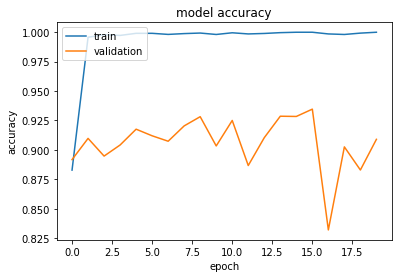

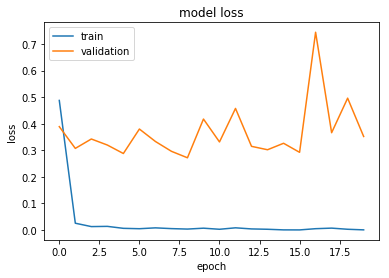

In [10]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.DenseNet169.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=20, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

In [7]:
model.load_weights('saved_models/weights.train.DenseNet121.hdf5')

In [11]:
weights = model.layers[5].get_weights()[0]
model2 = Model(model.input, [model.layers[3].input, model.output])

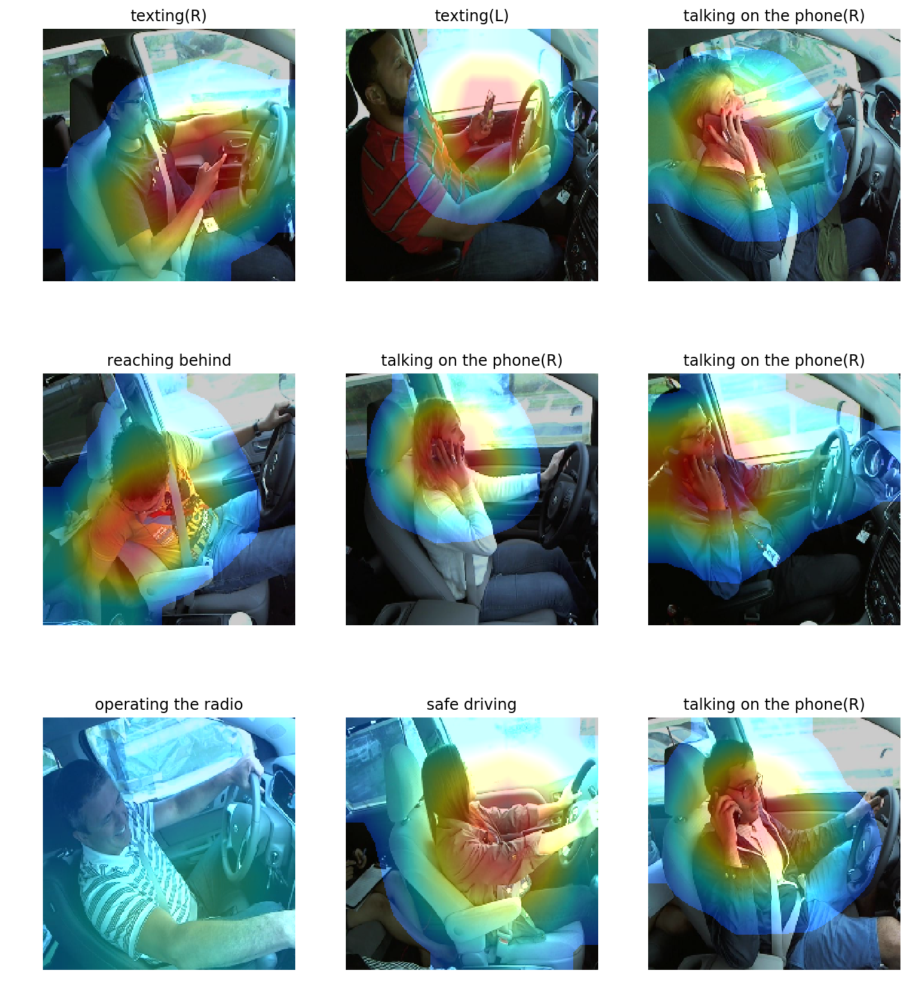

In [12]:
plot_some_samples(model2, weights, size224)

### CAM visualize

In [6]:
model.load_weights('saved_models/weights.train.ResNet50.hdf5')
zip([x.name for x in model.layers], range(len(model.layers)))

In [7]:
print(model.layers[2].layers[171])

In [8]:
weights = model.layers[5].get_weights()[0]
model2 = Model(model.input, [model.layers[2].layers[172].output, model.output])

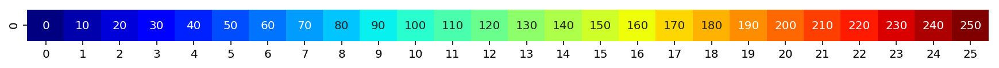

In [10]:
%config InlineBackend.figure_format = 'retina'

test_path = "test"
test_files =os.listdir(test_path)
d_status = {0:'safe driving', 1:'texting(R)', 2:'talking on the phone(R)', 3:'texting(L)', 4:'talking on the phone(L)',
           5:'operating the radio', 6:'drinking', 7:'reaching behind', 8:'hair and makeup',9:'talking to passenger'}
def plot_some_samples(Model, weights, img_size):
    plt.figure(figsize=(12, 14))
    for i in range(9):
        plt.subplot(3, 3, i+1)
        img = cv2.imread('test/%s' %random.choice(test_files))
        img = cv2.resize(img, img_size)
        x = img.copy()
        x.astype(np.float32)
        out, prediction = model2.predict(np.expand_dims(x, axis=0))

        b = np.argmax(prediction)
        #print(out.shape, prediction.shape)
        prediction = prediction[0]
        out = out[0]
        #print(out.shape)

        plt.title(d_status[b])
    
        cam = (prediction - 0.5) * np.matmul(out, weights)
        cam -= cam.min()
        cam /= cam.max()
        cam -= 0.2
        cam /= 0.8
        cam = cam[:,:,b]
        cam = cv2.resize(cam, img_size)
        #print(cam.shape)
        heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
        heatmap[np.where(cam <= 0.2)] = 0

        out = cv2.addWeighted(img, 0.8, heatmap, 0.4, 0)

        plt.axis('off')
        plt.imshow(out[:,:,::-1])
        
import seaborn as sns
plt.figure(figsize=(15, 0.5))
heatband = np.array([range(0,255,10)])
#print(heatband)
sns.heatmap(heatband, annot=True, fmt="d", cmap='jet', cbar=False)
plt.show()

#### Image data for other models

In [6]:
img_size = size299
gen = image.ImageDataGenerator()
train_generator = gen.flow_from_directory("train2", img_size, batch_size=Batch)
valid_generator = gen.flow_from_directory("valid2", img_size, batch_size=Batch)

Found 17436 images belonging to 10 classes.
Found 4988 images belonging to 10 classes.


#### Train InceptionV3

In [7]:
#build and train InceptionV3
input_tensor = Input((299, 299, 3))
base_model = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(inception_v3.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.7)(x)
x = Dense(10, activation='softmax')(x)
model = Model(input_tensor, x)
optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#optv = optimizers.SGD(lr = 5e-4)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 299, 299, 3)       0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 299, 299, 3)       0         
_________________________________________________________________
inception_v3 (Model)         (None, 8, 8, 2048)        21802784  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                20490     
Total params: 21,823,274
Trainable params: 21,788,842
Non-trainable params: 34,432
___________________________________________________________

Epoch 1/20
 204/1090 [====>.........................] - ETA: 2:24:38 - loss: 2.5579 - acc: 0.18 - ETA: 1:14:17 - loss: 2.5293 - acc: 0.15 - ETA: 50:50 - loss: 2.4122 - acc: 0.2500 - ETA: 39:04 - loss: 2.4597 - acc: 0.20 - ETA: 32:01 - loss: 2.4425 - acc: 0.21 - ETA: 27:18 - loss: 2.4468 - acc: 0.20 - ETA: 23:55 - loss: 2.4388 - acc: 0.17 - ETA: 21:22 - loss: 2.4273 - acc: 0.17 - ETA: 19:23 - loss: 2.4271 - acc: 0.17 - ETA: 17:48 - loss: 2.4647 - acc: 0.16 - ETA: 16:30 - loss: 2.4461 - acc: 0.17 - ETA: 15:26 - loss: 2.4189 - acc: 0.19 - ETA: 14:30 - loss: 2.4044 - acc: 0.18 - ETA: 13:43 - loss: 2.3742 - acc: 0.20 - ETA: 13:02 - loss: 2.3533 - acc: 0.20 - ETA: 12:26 - loss: 2.3614 - acc: 0.19 - ETA: 11:55 - loss: 2.3565 - acc: 0.19 - ETA: 11:27 - loss: 2.3400 - acc: 0.20 - ETA: 11:01 - loss: 2.3469 - acc: 0.19 - ETA: 10:39 - loss: 2.3155 - acc: 0.20 - ETA: 10:18 - loss: 2.2976 - acc: 0.21 - ETA: 9:59 - loss: 2.2753 - acc: 0.2244 - ETA: 9:42 - loss: 2.2670 - acc: 0.225 - ETA: 9:26 - loss:

 204/1090 [====>.........................] - ETA: 3:48 - loss: 0.0990 - acc: 1.000 - ETA: 3:50 - loss: 0.0713 - acc: 1.000 - ETA: 3:47 - loss: 0.0490 - acc: 1.000 - ETA: 3:49 - loss: 0.0449 - acc: 1.000 - ETA: 3:47 - loss: 0.0384 - acc: 1.000 - ETA: 3:47 - loss: 0.0365 - acc: 1.000 - ETA: 3:46 - loss: 0.0376 - acc: 1.000 - ETA: 3:46 - loss: 0.0384 - acc: 1.000 - ETA: 3:47 - loss: 0.0354 - acc: 1.000 - ETA: 3:46 - loss: 0.0322 - acc: 1.000 - ETA: 3:45 - loss: 0.0394 - acc: 0.994 - ETA: 3:45 - loss: 0.0375 - acc: 0.994 - ETA: 3:44 - loss: 0.0349 - acc: 0.995 - ETA: 3:45 - loss: 0.0329 - acc: 0.995 - ETA: 3:44 - loss: 0.0347 - acc: 0.995 - ETA: 3:44 - loss: 0.0330 - acc: 0.996 - ETA: 3:43 - loss: 0.0314 - acc: 0.996 - ETA: 3:43 - loss: 0.0313 - acc: 0.996 - ETA: 3:43 - loss: 0.0357 - acc: 0.993 - ETA: 3:43 - loss: 0.0341 - acc: 0.993 - ETA: 3:43 - loss: 0.0329 - acc: 0.994 - ETA: 3:43 - loss: 0.0376 - acc: 0.991 - ETA: 3:42 - loss: 0.0361 - acc: 0.991 - ETA: 3:43 - loss: 0.0352 - acc: 0.9

1090/1090 [==============================] - ETA: 11s - loss: 0.0388 - acc: 0.98 - ETA: 11s - loss: 0.0388 - acc: 0.98 - ETA: 11s - loss: 0.0387 - acc: 0.98 - ETA: 11s - loss: 0.0387 - acc: 0.98 - ETA: 11s - loss: 0.0395 - acc: 0.98 - ETA: 10s - loss: 0.0395 - acc: 0.98 - ETA: 10s - loss: 0.0395 - acc: 0.98 - ETA: 10s - loss: 0.0394 - acc: 0.98 - ETA: 10s - loss: 0.0394 - acc: 0.98 - ETA: 10s - loss: 0.0394 - acc: 0.98 - ETA: 9s - loss: 0.0393 - acc: 0.9889 - ETA: 9s - loss: 0.0393 - acc: 0.988 - ETA: 9s - loss: 0.0393 - acc: 0.988 - ETA: 9s - loss: 0.0392 - acc: 0.988 - ETA: 8s - loss: 0.0392 - acc: 0.988 - ETA: 8s - loss: 0.0392 - acc: 0.988 - ETA: 8s - loss: 0.0392 - acc: 0.988 - ETA: 8s - loss: 0.0391 - acc: 0.988 - ETA: 8s - loss: 0.0392 - acc: 0.988 - ETA: 7s - loss: 0.0393 - acc: 0.988 - ETA: 7s - loss: 0.0393 - acc: 0.988 - ETA: 7s - loss: 0.0393 - acc: 0.988 - ETA: 7s - loss: 0.0392 - acc: 0.988 - ETA: 7s - loss: 0.0392 - acc: 0.988 - ETA: 6s - loss: 0.0392 - acc: 0.988 - ETA:

 204/1090 [====>.........................] - ETA: 4:15 - loss: 0.0073 - acc: 1.000 - ETA: 4:06 - loss: 0.0038 - acc: 1.000 - ETA: 3:56 - loss: 0.0036 - acc: 1.000 - ETA: 3:56 - loss: 0.0030 - acc: 1.000 - ETA: 3:55 - loss: 0.0069 - acc: 1.000 - ETA: 3:55 - loss: 0.0066 - acc: 1.000 - ETA: 3:54 - loss: 0.0057 - acc: 1.000 - ETA: 3:52 - loss: 0.0058 - acc: 1.000 - ETA: 3:50 - loss: 0.0241 - acc: 0.993 - ETA: 3:49 - loss: 0.0239 - acc: 0.993 - ETA: 3:49 - loss: 0.0218 - acc: 0.994 - ETA: 3:47 - loss: 0.0202 - acc: 0.994 - ETA: 3:48 - loss: 0.0189 - acc: 0.995 - ETA: 3:47 - loss: 0.0177 - acc: 0.995 - ETA: 3:47 - loss: 0.0167 - acc: 0.995 - ETA: 3:47 - loss: 0.0158 - acc: 0.996 - ETA: 3:47 - loss: 0.0149 - acc: 0.996 - ETA: 3:47 - loss: 0.0142 - acc: 0.996 - ETA: 3:46 - loss: 0.0135 - acc: 0.996 - ETA: 3:46 - loss: 0.0131 - acc: 0.996 - ETA: 3:45 - loss: 0.0126 - acc: 0.997 - ETA: 3:45 - loss: 0.0122 - acc: 0.997 - ETA: 3:45 - loss: 0.0122 - acc: 0.997 - ETA: 3:44 - loss: 0.0118 - acc: 0.9

1090/1090 [==============================] - ETA: 11s - loss: 0.0212 - acc: 0.99 - ETA: 11s - loss: 0.0211 - acc: 0.99 - ETA: 11s - loss: 0.0211 - acc: 0.99 - ETA: 11s - loss: 0.0211 - acc: 0.99 - ETA: 11s - loss: 0.0211 - acc: 0.99 - ETA: 10s - loss: 0.0211 - acc: 0.99 - ETA: 10s - loss: 0.0211 - acc: 0.99 - ETA: 10s - loss: 0.0210 - acc: 0.99 - ETA: 10s - loss: 0.0211 - acc: 0.99 - ETA: 10s - loss: 0.0210 - acc: 0.99 - ETA: 9s - loss: 0.0210 - acc: 0.9940 - ETA: 9s - loss: 0.0210 - acc: 0.994 - ETA: 9s - loss: 0.0210 - acc: 0.994 - ETA: 9s - loss: 0.0210 - acc: 0.994 - ETA: 8s - loss: 0.0210 - acc: 0.994 - ETA: 8s - loss: 0.0210 - acc: 0.994 - ETA: 8s - loss: 0.0210 - acc: 0.994 - ETA: 8s - loss: 0.0210 - acc: 0.994 - ETA: 8s - loss: 0.0209 - acc: 0.994 - ETA: 7s - loss: 0.0209 - acc: 0.994 - ETA: 7s - loss: 0.0209 - acc: 0.994 - ETA: 7s - loss: 0.0209 - acc: 0.994 - ETA: 7s - loss: 0.0209 - acc: 0.994 - ETA: 7s - loss: 0.0209 - acc: 0.994 - ETA: 6s - loss: 0.0210 - acc: 0.994 - ETA:

 204/1090 [====>.........................] - ETA: 3:45 - loss: 0.0012 - acc: 1.000 - ETA: 3:42 - loss: 0.0072 - acc: 1.000 - ETA: 3:46 - loss: 0.0200 - acc: 1.000 - ETA: 3:45 - loss: 0.0196 - acc: 1.000 - ETA: 3:43 - loss: 0.0760 - acc: 0.987 - ETA: 3:44 - loss: 0.0634 - acc: 0.989 - ETA: 3:45 - loss: 0.0672 - acc: 0.982 - ETA: 3:44 - loss: 0.0589 - acc: 0.984 - ETA: 3:43 - loss: 0.0525 - acc: 0.986 - ETA: 3:44 - loss: 0.0473 - acc: 0.987 - ETA: 3:45 - loss: 0.0431 - acc: 0.988 - ETA: 3:46 - loss: 0.0395 - acc: 0.989 - ETA: 3:46 - loss: 0.0366 - acc: 0.990 - ETA: 3:45 - loss: 0.0346 - acc: 0.991 - ETA: 3:46 - loss: 0.0323 - acc: 0.991 - ETA: 3:46 - loss: 0.0303 - acc: 0.992 - ETA: 3:46 - loss: 0.0293 - acc: 0.992 - ETA: 3:45 - loss: 0.0277 - acc: 0.993 - ETA: 3:44 - loss: 0.0272 - acc: 0.993 - ETA: 3:44 - loss: 0.0262 - acc: 0.993 - ETA: 3:44 - loss: 0.0250 - acc: 0.994 - ETA: 3:43 - loss: 0.0239 - acc: 0.994 - ETA: 3:44 - loss: 0.0230 - acc: 0.994 - ETA: 3:43 - loss: 0.0221 - acc: 0.9

1090/1090 [==============================] - ETA: 11s - loss: 0.0129 - acc: 0.99 - ETA: 11s - loss: 0.0129 - acc: 0.99 - ETA: 11s - loss: 0.0129 - acc: 0.99 - ETA: 11s - loss: 0.0128 - acc: 0.99 - ETA: 11s - loss: 0.0128 - acc: 0.99 - ETA: 10s - loss: 0.0128 - acc: 0.99 - ETA: 10s - loss: 0.0128 - acc: 0.99 - ETA: 10s - loss: 0.0128 - acc: 0.99 - ETA: 10s - loss: 0.0128 - acc: 0.99 - ETA: 10s - loss: 0.0128 - acc: 0.99 - ETA: 9s - loss: 0.0128 - acc: 0.9966 - ETA: 9s - loss: 0.0128 - acc: 0.996 - ETA: 9s - loss: 0.0128 - acc: 0.996 - ETA: 9s - loss: 0.0128 - acc: 0.996 - ETA: 8s - loss: 0.0128 - acc: 0.996 - ETA: 8s - loss: 0.0128 - acc: 0.996 - ETA: 8s - loss: 0.0127 - acc: 0.996 - ETA: 8s - loss: 0.0128 - acc: 0.996 - ETA: 8s - loss: 0.0128 - acc: 0.996 - ETA: 7s - loss: 0.0128 - acc: 0.996 - ETA: 7s - loss: 0.0128 - acc: 0.996 - ETA: 7s - loss: 0.0128 - acc: 0.996 - ETA: 7s - loss: 0.0128 - acc: 0.996 - ETA: 7s - loss: 0.0127 - acc: 0.996 - ETA: 6s - loss: 0.0127 - acc: 0.996 - ETA:

 204/1090 [====>.........................] - ETA: 3:41 - loss: 0.0010 - acc: 1.000 - ETA: 3:41 - loss: 5.6174e-04 - acc: 1.000 - ETA: 3:44 - loss: 8.5835e-04 - acc: 1.000 - ETA: 3:46 - loss: 0.0066 - acc: 1.0000    - ETA: 3:46 - loss: 0.0053 - acc: 1.000 - ETA: 3:46 - loss: 0.0045 - acc: 1.000 - ETA: 3:47 - loss: 0.0040 - acc: 1.000 - ETA: 3:49 - loss: 0.0066 - acc: 1.000 - ETA: 3:49 - loss: 0.0063 - acc: 1.000 - ETA: 3:48 - loss: 0.0058 - acc: 1.000 - ETA: 3:48 - loss: 0.0054 - acc: 1.000 - ETA: 3:47 - loss: 0.0051 - acc: 1.000 - ETA: 3:46 - loss: 0.0102 - acc: 1.000 - ETA: 3:47 - loss: 0.0340 - acc: 0.995 - ETA: 3:46 - loss: 0.0318 - acc: 0.995 - ETA: 3:46 - loss: 0.0299 - acc: 0.996 - ETA: 3:45 - loss: 0.0282 - acc: 0.996 - ETA: 3:45 - loss: 0.0267 - acc: 0.996 - ETA: 3:45 - loss: 0.0260 - acc: 0.996 - ETA: 3:45 - loss: 0.0256 - acc: 0.996 - ETA: 3:45 - loss: 0.0244 - acc: 0.997 - ETA: 3:45 - loss: 0.0234 - acc: 0.997 - ETA: 3:45 - loss: 0.0228 - acc: 0.997 - ETA: 3:45 - loss: 0.021

1090/1090 [==============================] - ETA: 12s - loss: 0.0171 - acc: 0.99 - ETA: 11s - loss: 0.0172 - acc: 0.99 - ETA: 11s - loss: 0.0172 - acc: 0.99 - ETA: 11s - loss: 0.0172 - acc: 0.99 - ETA: 11s - loss: 0.0172 - acc: 0.99 - ETA: 11s - loss: 0.0172 - acc: 0.99 - ETA: 10s - loss: 0.0172 - acc: 0.99 - ETA: 10s - loss: 0.0172 - acc: 0.99 - ETA: 10s - loss: 0.0171 - acc: 0.99 - ETA: 10s - loss: 0.0171 - acc: 0.99 - ETA: 9s - loss: 0.0171 - acc: 0.9958 - ETA: 9s - loss: 0.0172 - acc: 0.995 - ETA: 9s - loss: 0.0172 - acc: 0.995 - ETA: 9s - loss: 0.0172 - acc: 0.995 - ETA: 9s - loss: 0.0172 - acc: 0.995 - ETA: 8s - loss: 0.0172 - acc: 0.995 - ETA: 8s - loss: 0.0172 - acc: 0.995 - ETA: 8s - loss: 0.0173 - acc: 0.995 - ETA: 8s - loss: 0.0176 - acc: 0.995 - ETA: 8s - loss: 0.0176 - acc: 0.995 - ETA: 7s - loss: 0.0176 - acc: 0.995 - ETA: 7s - loss: 0.0176 - acc: 0.995 - ETA: 7s - loss: 0.0176 - acc: 0.995 - ETA: 7s - loss: 0.0175 - acc: 0.995 - ETA: 6s - loss: 0.0175 - acc: 0.995 - ETA:

 204/1090 [====>.........................] - ETA: 3:40 - loss: 1.0898e-04 - acc: 1.000 - ETA: 3:56 - loss: 0.0058 - acc: 1.0000    - ETA: 3:54 - loss: 0.0039 - acc: 1.000 - ETA: 3:55 - loss: 0.0031 - acc: 1.000 - ETA: 3:51 - loss: 0.0027 - acc: 1.000 - ETA: 3:52 - loss: 0.0023 - acc: 1.000 - ETA: 3:50 - loss: 0.0575 - acc: 0.991 - ETA: 3:50 - loss: 0.0517 - acc: 0.992 - ETA: 3:48 - loss: 0.0463 - acc: 0.993 - ETA: 3:47 - loss: 0.0418 - acc: 0.993 - ETA: 3:47 - loss: 0.0380 - acc: 0.994 - ETA: 3:47 - loss: 0.0349 - acc: 0.994 - ETA: 3:46 - loss: 0.0331 - acc: 0.995 - ETA: 3:47 - loss: 0.0309 - acc: 0.995 - ETA: 3:46 - loss: 0.0294 - acc: 0.995 - ETA: 3:46 - loss: 0.0275 - acc: 0.996 - ETA: 3:45 - loss: 0.0261 - acc: 0.996 - ETA: 3:45 - loss: 0.0247 - acc: 0.996 - ETA: 3:45 - loss: 0.0234 - acc: 0.996 - ETA: 3:44 - loss: 0.0222 - acc: 0.996 - ETA: 3:45 - loss: 0.0215 - acc: 0.997 - ETA: 3:45 - loss: 0.0229 - acc: 0.994 - ETA: 3:44 - loss: 0.0227 - acc: 0.994 - ETA: 3:44 - loss: 0.0219 - 

1090/1090 [==============================] - ETA: 12s - loss: 0.0114 - acc: 0.99 - ETA: 11s - loss: 0.0114 - acc: 0.99 - ETA: 11s - loss: 0.0114 - acc: 0.99 - ETA: 11s - loss: 0.0114 - acc: 0.99 - ETA: 11s - loss: 0.0114 - acc: 0.99 - ETA: 10s - loss: 0.0114 - acc: 0.99 - ETA: 10s - loss: 0.0114 - acc: 0.99 - ETA: 10s - loss: 0.0114 - acc: 0.99 - ETA: 10s - loss: 0.0113 - acc: 0.99 - ETA: 10s - loss: 0.0114 - acc: 0.99 - ETA: 9s - loss: 0.0114 - acc: 0.9967 - ETA: 9s - loss: 0.0113 - acc: 0.996 - ETA: 9s - loss: 0.0113 - acc: 0.996 - ETA: 9s - loss: 0.0113 - acc: 0.996 - ETA: 9s - loss: 0.0113 - acc: 0.996 - ETA: 8s - loss: 0.0114 - acc: 0.996 - ETA: 8s - loss: 0.0114 - acc: 0.996 - ETA: 8s - loss: 0.0114 - acc: 0.996 - ETA: 8s - loss: 0.0114 - acc: 0.996 - ETA: 8s - loss: 0.0114 - acc: 0.996 - ETA: 7s - loss: 0.0114 - acc: 0.996 - ETA: 7s - loss: 0.0113 - acc: 0.996 - ETA: 7s - loss: 0.0113 - acc: 0.996 - ETA: 7s - loss: 0.0113 - acc: 0.996 - ETA: 6s - loss: 0.0113 - acc: 0.996 - ETA:

 203/1090 [====>.........................] - ETA: 4:05 - loss: 2.2242e-04 - acc: 1.000 - ETA: 3:58 - loss: 3.9608e-04 - acc: 1.000 - ETA: 3:53 - loss: 3.6005e-04 - acc: 1.000 - ETA: 3:57 - loss: 3.3835e-04 - acc: 1.000 - ETA: 3:53 - loss: 4.8878e-04 - acc: 1.000 - ETA: 3:56 - loss: 0.0011 - acc: 1.0000    - ETA: 3:53 - loss: 9.6473e-04 - acc: 1.000 - ETA: 3:55 - loss: 8.5988e-04 - acc: 1.000 - ETA: 3:54 - loss: 7.9799e-04 - acc: 1.000 - ETA: 3:51 - loss: 0.0013 - acc: 1.0000    - ETA: 3:50 - loss: 0.0014 - acc: 1.000 - ETA: 3:51 - loss: 0.0017 - acc: 1.000 - ETA: 3:50 - loss: 0.0015 - acc: 1.000 - ETA: 3:49 - loss: 0.0015 - acc: 1.000 - ETA: 3:49 - loss: 0.0014 - acc: 1.000 - ETA: 3:49 - loss: 0.0013 - acc: 1.000 - ETA: 3:48 - loss: 0.0013 - acc: 1.000 - ETA: 3:48 - loss: 0.0021 - acc: 1.000 - ETA: 3:48 - loss: 0.0021 - acc: 1.000 - ETA: 3:47 - loss: 0.0020 - acc: 1.000 - ETA: 3:47 - loss: 0.0019 - acc: 1.000 - ETA: 3:47 - loss: 0.0018 - acc: 1.000 - ETA: 3:46 - loss: 0.0017 - acc: 1.0

1090/1090 [==============================] - ETA: 12s - loss: 0.0076 - acc: 0.99 - ETA: 12s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 9s - loss: 0.0076 - acc: 0.9983 - ETA: 9s - loss: 0.0076 - acc: 0.998 - ETA: 9s - loss: 0.0075 - acc: 0.998 - ETA: 9s - loss: 0.0075 - acc: 0.998 - ETA: 9s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 7s - loss: 0.0075 - acc: 0.998 - ETA: 7s - loss: 0.0075 - acc: 0.998 - ETA: 7s - loss: 0.0075 - acc: 0.998 - ETA: 7s - loss: 0.0075 - acc: 0.998 - ETA:

 204/1090 [====>.........................] - ETA: 3:49 - loss: 6.4313e-05 - acc: 1.000 - ETA: 3:47 - loss: 1.7353e-04 - acc: 1.000 - ETA: 3:47 - loss: 1.7537e-04 - acc: 1.000 - ETA: 3:46 - loss: 1.6852e-04 - acc: 1.000 - ETA: 3:47 - loss: 0.0065 - acc: 1.0000    - ETA: 3:46 - loss: 0.0345 - acc: 0.979 - ETA: 3:49 - loss: 0.0296 - acc: 0.982 - ETA: 3:47 - loss: 0.0260 - acc: 0.984 - ETA: 3:50 - loss: 0.0231 - acc: 0.986 - ETA: 3:50 - loss: 0.0208 - acc: 0.987 - ETA: 3:48 - loss: 0.0190 - acc: 0.988 - ETA: 3:51 - loss: 0.0176 - acc: 0.989 - ETA: 3:50 - loss: 0.0162 - acc: 0.990 - ETA: 3:49 - loss: 0.0152 - acc: 0.991 - ETA: 3:48 - loss: 0.0158 - acc: 0.991 - ETA: 3:48 - loss: 0.0148 - acc: 0.992 - ETA: 3:47 - loss: 0.0140 - acc: 0.992 - ETA: 3:47 - loss: 0.0133 - acc: 0.993 - ETA: 3:47 - loss: 0.0130 - acc: 0.993 - ETA: 3:46 - loss: 0.0124 - acc: 0.993 - ETA: 3:46 - loss: 0.0126 - acc: 0.994 - ETA: 3:46 - loss: 0.0120 - acc: 0.994 - ETA: 3:45 - loss: 0.0115 - acc: 0.994 - ETA: 3:45 - los

1090/1090 [==============================] - ETA: 12s - loss: 0.0064 - acc: 0.99 - ETA: 11s - loss: 0.0064 - acc: 0.99 - ETA: 11s - loss: 0.0064 - acc: 0.99 - ETA: 11s - loss: 0.0064 - acc: 0.99 - ETA: 11s - loss: 0.0064 - acc: 0.99 - ETA: 10s - loss: 0.0064 - acc: 0.99 - ETA: 10s - loss: 0.0064 - acc: 0.99 - ETA: 10s - loss: 0.0064 - acc: 0.99 - ETA: 10s - loss: 0.0064 - acc: 0.99 - ETA: 10s - loss: 0.0065 - acc: 0.99 - ETA: 9s - loss: 0.0065 - acc: 0.9981 - ETA: 9s - loss: 0.0065 - acc: 0.998 - ETA: 9s - loss: 0.0065 - acc: 0.998 - ETA: 9s - loss: 0.0068 - acc: 0.998 - ETA: 9s - loss: 0.0068 - acc: 0.998 - ETA: 8s - loss: 0.0068 - acc: 0.998 - ETA: 8s - loss: 0.0068 - acc: 0.998 - ETA: 8s - loss: 0.0068 - acc: 0.998 - ETA: 8s - loss: 0.0068 - acc: 0.998 - ETA: 8s - loss: 0.0068 - acc: 0.998 - ETA: 7s - loss: 0.0068 - acc: 0.998 - ETA: 7s - loss: 0.0068 - acc: 0.998 - ETA: 7s - loss: 0.0068 - acc: 0.998 - ETA: 7s - loss: 0.0068 - acc: 0.998 - ETA: 6s - loss: 0.0068 - acc: 0.998 - ETA:

 202/1090 [====>.........................] - ETA: 3:50 - loss: 5.5080e-04 - acc: 1.000 - ETA: 3:44 - loss: 4.8599e-04 - acc: 1.000 - ETA: 3:53 - loss: 0.0019 - acc: 1.0000    - ETA: 3:54 - loss: 0.0014 - acc: 1.000 - ETA: 3:55 - loss: 0.0012 - acc: 1.000 - ETA: 3:53 - loss: 0.0011 - acc: 1.000 - ETA: 3:51 - loss: 9.6253e-04 - acc: 1.000 - ETA: 3:53 - loss: 0.0011 - acc: 1.0000    - ETA: 3:51 - loss: 9.8140e-04 - acc: 1.000 - ETA: 3:51 - loss: 8.8519e-04 - acc: 1.000 - ETA: 3:51 - loss: 8.0759e-04 - acc: 1.000 - ETA: 3:51 - loss: 7.6458e-04 - acc: 1.000 - ETA: 3:50 - loss: 8.2231e-04 - acc: 1.000 - ETA: 3:49 - loss: 0.0017 - acc: 1.0000    - ETA: 3:48 - loss: 0.0016 - acc: 1.000 - ETA: 3:49 - loss: 0.0015 - acc: 1.000 - ETA: 3:50 - loss: 0.0014 - acc: 1.000 - ETA: 3:50 - loss: 0.0014 - acc: 1.000 - ETA: 3:49 - loss: 0.0013 - acc: 1.000 - ETA: 3:50 - loss: 0.0012 - acc: 1.000 - ETA: 3:49 - loss: 0.0012 - acc: 1.000 - ETA: 3:48 - loss: 0.0012 - acc: 1.000 - ETA: 3:48 - loss: 0.0011 - acc:

1090/1090 [==============================] - ETA: 12s - loss: 0.0034 - acc: 0.99 - ETA: 12s - loss: 0.0034 - acc: 0.99 - ETA: 12s - loss: 0.0034 - acc: 0.99 - ETA: 11s - loss: 0.0034 - acc: 0.99 - ETA: 11s - loss: 0.0034 - acc: 0.99 - ETA: 11s - loss: 0.0034 - acc: 0.99 - ETA: 11s - loss: 0.0034 - acc: 0.99 - ETA: 10s - loss: 0.0034 - acc: 0.99 - ETA: 10s - loss: 0.0034 - acc: 0.99 - ETA: 10s - loss: 0.0034 - acc: 0.99 - ETA: 10s - loss: 0.0034 - acc: 0.99 - ETA: 10s - loss: 0.0034 - acc: 0.99 - ETA: 9s - loss: 0.0034 - acc: 0.9990 - ETA: 9s - loss: 0.0034 - acc: 0.999 - ETA: 9s - loss: 0.0034 - acc: 0.999 - ETA: 9s - loss: 0.0034 - acc: 0.999 - ETA: 9s - loss: 0.0034 - acc: 0.999 - ETA: 8s - loss: 0.0033 - acc: 0.999 - ETA: 8s - loss: 0.0033 - acc: 0.999 - ETA: 8s - loss: 0.0033 - acc: 0.999 - ETA: 8s - loss: 0.0033 - acc: 0.999 - ETA: 8s - loss: 0.0033 - acc: 0.999 - ETA: 7s - loss: 0.0033 - acc: 0.999 - ETA: 7s - loss: 0.0033 - acc: 0.999 - ETA: 7s - loss: 0.0033 - acc: 0.999 - ETA:

 202/1090 [====>.........................] - ETA: 3:47 - loss: 2.9747e-04 - acc: 1.000 - ETA: 3:46 - loss: 1.7397e-04 - acc: 1.000 - ETA: 3:43 - loss: 2.7128e-04 - acc: 1.000 - ETA: 3:46 - loss: 2.1235e-04 - acc: 1.000 - ETA: 3:51 - loss: 2.2669e-04 - acc: 1.000 - ETA: 3:50 - loss: 2.0203e-04 - acc: 1.000 - ETA: 3:49 - loss: 2.0680e-04 - acc: 1.000 - ETA: 3:50 - loss: 2.0969e-04 - acc: 1.000 - ETA: 3:50 - loss: 2.6072e-04 - acc: 1.000 - ETA: 3:50 - loss: 2.5417e-04 - acc: 1.000 - ETA: 3:50 - loss: 2.8148e-04 - acc: 1.000 - ETA: 3:49 - loss: 2.6201e-04 - acc: 1.000 - ETA: 3:47 - loss: 2.4390e-04 - acc: 1.000 - ETA: 3:47 - loss: 3.1830e-04 - acc: 1.000 - ETA: 3:46 - loss: 3.0104e-04 - acc: 1.000 - ETA: 3:46 - loss: 3.0257e-04 - acc: 1.000 - ETA: 3:46 - loss: 2.9427e-04 - acc: 1.000 - ETA: 3:47 - loss: 0.0019 - acc: 1.0000    - ETA: 3:46 - loss: 0.0018 - acc: 1.000 - ETA: 3:45 - loss: 0.0017 - acc: 1.000 - ETA: 3:45 - loss: 0.0017 - acc: 1.000 - ETA: 3:46 - loss: 0.0016 - acc: 1.000 - ETA

1090/1090 [==============================] - ETA: 12s - loss: 0.0077 - acc: 0.99 - ETA: 12s - loss: 0.0077 - acc: 0.99 - ETA: 12s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 11s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 10s - loss: 0.0076 - acc: 0.99 - ETA: 9s - loss: 0.0076 - acc: 0.9980 - ETA: 9s - loss: 0.0076 - acc: 0.998 - ETA: 9s - loss: 0.0076 - acc: 0.998 - ETA: 9s - loss: 0.0076 - acc: 0.998 - ETA: 9s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 8s - loss: 0.0075 - acc: 0.998 - ETA: 7s - loss: 0.0075 - acc: 0.998 - ETA: 7s - loss: 0.0075 - acc: 0.998 - ETA: 7s - loss: 0.0075 - acc: 0.998 - ETA:

 203/1090 [====>.........................] - ETA: 3:46 - loss: 8.4962e-05 - acc: 1.000 - ETA: 3:44 - loss: 9.4416e-05 - acc: 1.000 - ETA: 3:46 - loss: 2.6556e-04 - acc: 1.000 - ETA: 3:48 - loss: 2.0309e-04 - acc: 1.000 - ETA: 3:46 - loss: 2.0025e-04 - acc: 1.000 - ETA: 3:49 - loss: 5.7621e-04 - acc: 1.000 - ETA: 3:48 - loss: 5.2085e-04 - acc: 1.000 - ETA: 3:50 - loss: 4.8353e-04 - acc: 1.000 - ETA: 3:49 - loss: 4.4802e-04 - acc: 1.000 - ETA: 3:51 - loss: 4.0624e-04 - acc: 1.000 - ETA: 3:49 - loss: 4.2128e-04 - acc: 1.000 - ETA: 3:48 - loss: 5.1030e-04 - acc: 1.000 - ETA: 3:48 - loss: 0.0010 - acc: 1.0000    - ETA: 3:48 - loss: 9.8037e-04 - acc: 1.000 - ETA: 3:47 - loss: 0.0301 - acc: 0.9958    - ETA: 3:47 - loss: 0.0282 - acc: 0.996 - ETA: 3:46 - loss: 0.0265 - acc: 0.996 - ETA: 3:46 - loss: 0.0251 - acc: 0.996 - ETA: 3:45 - loss: 0.0237 - acc: 0.996 - ETA: 3:46 - loss: 0.0226 - acc: 0.996 - ETA: 3:45 - loss: 0.0215 - acc: 0.997 - ETA: 3:45 - loss: 0.0205 - acc: 0.997 - ETA: 3:44 - los

1090/1090 [==============================] - ETA: 12s - loss: 0.0044 - acc: 0.99 - ETA: 12s - loss: 0.0044 - acc: 0.99 - ETA: 11s - loss: 0.0044 - acc: 0.99 - ETA: 11s - loss: 0.0044 - acc: 0.99 - ETA: 11s - loss: 0.0044 - acc: 0.99 - ETA: 11s - loss: 0.0044 - acc: 0.99 - ETA: 10s - loss: 0.0044 - acc: 0.99 - ETA: 10s - loss: 0.0044 - acc: 0.99 - ETA: 10s - loss: 0.0044 - acc: 0.99 - ETA: 10s - loss: 0.0044 - acc: 0.99 - ETA: 10s - loss: 0.0044 - acc: 0.99 - ETA: 9s - loss: 0.0044 - acc: 0.9989 - ETA: 9s - loss: 0.0044 - acc: 0.998 - ETA: 9s - loss: 0.0049 - acc: 0.998 - ETA: 9s - loss: 0.0049 - acc: 0.998 - ETA: 9s - loss: 0.0049 - acc: 0.998 - ETA: 8s - loss: 0.0049 - acc: 0.998 - ETA: 8s - loss: 0.0049 - acc: 0.998 - ETA: 8s - loss: 0.0049 - acc: 0.998 - ETA: 8s - loss: 0.0049 - acc: 0.998 - ETA: 8s - loss: 0.0049 - acc: 0.998 - ETA: 7s - loss: 0.0049 - acc: 0.998 - ETA: 7s - loss: 0.0049 - acc: 0.998 - ETA: 7s - loss: 0.0049 - acc: 0.998 - ETA: 7s - loss: 0.0049 - acc: 0.998 - ETA:

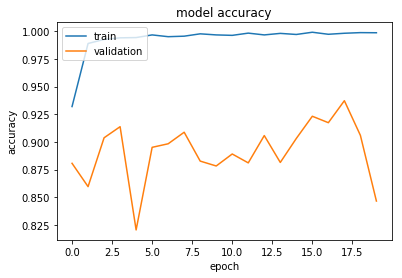

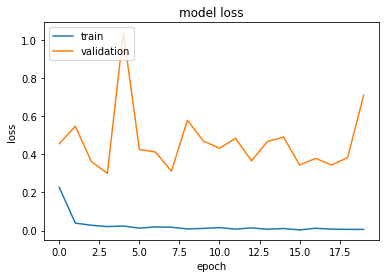

In [8]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.InceptionV3_3.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=20, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

In [124]:
model.load_weights('saved_models/weights.train.InceptionV3.hdf5')

In [22]:
print(len(model.layers[2].layers))
print(model.layers[2].layers[310])

311


In [35]:
weights = model.layers[5].get_weights()[0]
model2 = Model(model.input, [model.layers[3].input, model.output])

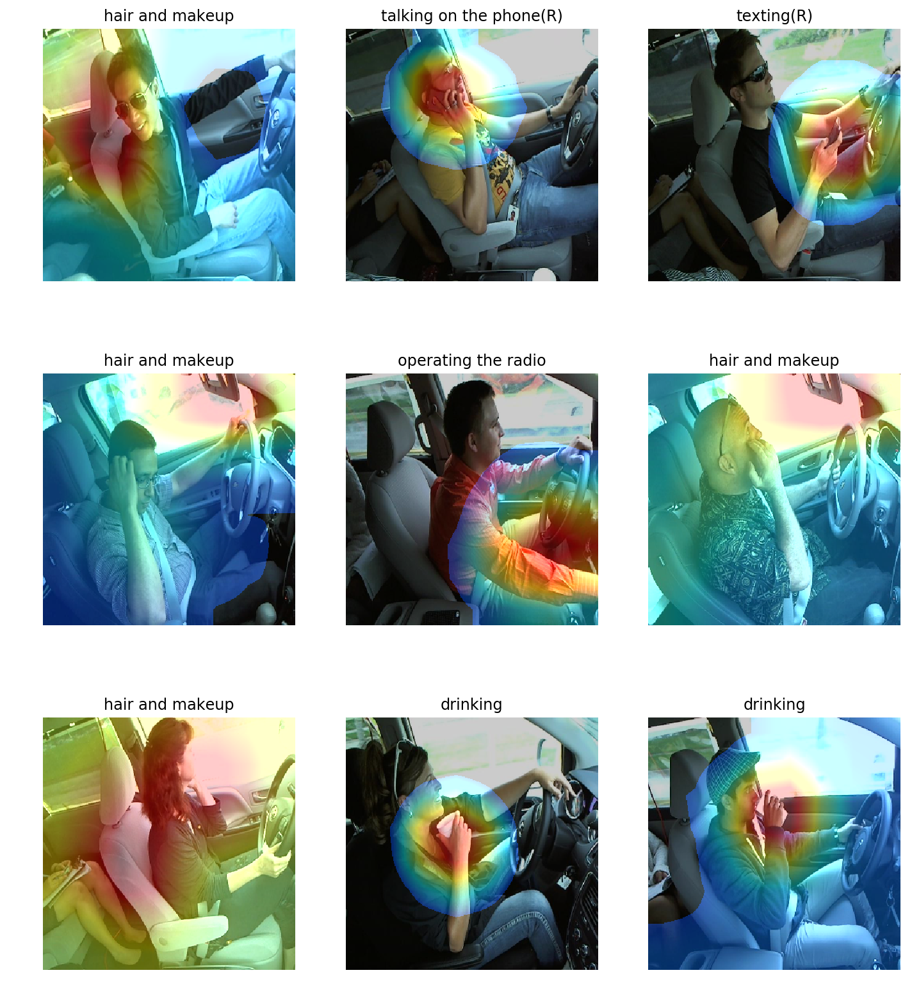

In [36]:
plot_some_samples(model2, weights, img_size)

#### Train Xception

In [6]:
#build and train Xception
input_tensor = Input((299, 299, 3))
base_model = Xception(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(xception.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.6)(x)
#x = Dense(10, activation='softmax')(x)
x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=2018))(x)
model = Model(input_tensor, x)
optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#optv = optimizers.SGD(lr = 5e-4)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 299, 299, 3)       0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 299, 299, 3)       0         
_________________________________________________________________
xception (Model)             (None, 10, 10, 2048)      20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                20490     
Total params: 20,881,970
Trainable params: 20,827,442
Non-trainable params: 54,528
___________________________________________________________

Epoch 1/20
 204/1090 [====>.........................] - ETA: 1:37:54 - loss: 2.2960 - acc: 0.12 - ETA: 52:30 - loss: 2.3144 - acc: 0.0938 - ETA: 37:24 - loss: 2.2982 - acc: 0.10 - ETA: 29:50 - loss: 2.3089 - acc: 0.09 - ETA: 25:20 - loss: 2.3067 - acc: 0.07 - ETA: 22:19 - loss: 2.3034 - acc: 0.09 - ETA: 20:09 - loss: 2.2890 - acc: 0.12 - ETA: 18:32 - loss: 2.2887 - acc: 0.13 - ETA: 17:15 - loss: 2.2867 - acc: 0.13 - ETA: 16:15 - loss: 2.2831 - acc: 0.14 - ETA: 15:26 - loss: 2.2839 - acc: 0.14 - ETA: 14:44 - loss: 2.2811 - acc: 0.15 - ETA: 14:08 - loss: 2.2808 - acc: 0.14 - ETA: 13:38 - loss: 2.2734 - acc: 0.15 - ETA: 13:12 - loss: 2.2701 - acc: 0.15 - ETA: 12:48 - loss: 2.2664 - acc: 0.16 - ETA: 12:28 - loss: 2.2624 - acc: 0.16 - ETA: 12:10 - loss: 2.2569 - acc: 0.18 - ETA: 11:53 - loss: 2.2563 - acc: 0.18 - ETA: 11:40 - loss: 2.2550 - acc: 0.18 - ETA: 11:26 - loss: 2.2498 - acc: 0.19 - ETA: 11:14 - loss: 2.2483 - acc: 0.19 - ETA: 11:03 - loss: 2.2476 - acc: 0.19 - ETA: 10:52 - loss: 2

 204/1090 [====>.........................] - ETA: 7:08 - loss: 0.0746 - acc: 0.937 - ETA: 6:49 - loss: 0.0438 - acc: 0.968 - ETA: 6:45 - loss: 0.0326 - acc: 0.979 - ETA: 6:44 - loss: 0.0280 - acc: 0.984 - ETA: 6:44 - loss: 0.0248 - acc: 0.987 - ETA: 6:41 - loss: 0.0236 - acc: 0.989 - ETA: 6:38 - loss: 0.0228 - acc: 0.991 - ETA: 6:39 - loss: 0.0207 - acc: 0.992 - ETA: 6:38 - loss: 0.0212 - acc: 0.993 - ETA: 6:38 - loss: 0.0200 - acc: 0.993 - ETA: 6:37 - loss: 0.0198 - acc: 0.994 - ETA: 6:35 - loss: 0.0191 - acc: 0.994 - ETA: 6:35 - loss: 0.0189 - acc: 0.995 - ETA: 6:35 - loss: 0.0187 - acc: 0.995 - ETA: 6:34 - loss: 0.0188 - acc: 0.995 - ETA: 6:34 - loss: 0.0185 - acc: 0.996 - ETA: 6:33 - loss: 0.0198 - acc: 0.996 - ETA: 6:33 - loss: 0.0198 - acc: 0.996 - ETA: 6:32 - loss: 0.0197 - acc: 0.996 - ETA: 6:32 - loss: 0.0193 - acc: 0.996 - ETA: 6:32 - loss: 0.0187 - acc: 0.997 - ETA: 6:32 - loss: 0.0182 - acc: 0.997 - ETA: 6:32 - loss: 0.0176 - acc: 0.997 - ETA: 6:31 - loss: 0.0175 - acc: 0.9

1090/1090 [==============================] - ETA: 23s - loss: 0.0232 - acc: 0.99 - ETA: 23s - loss: 0.0232 - acc: 0.99 - ETA: 22s - loss: 0.0232 - acc: 0.99 - ETA: 22s - loss: 0.0232 - acc: 0.99 - ETA: 21s - loss: 0.0232 - acc: 0.99 - ETA: 21s - loss: 0.0231 - acc: 0.99 - ETA: 21s - loss: 0.0231 - acc: 0.99 - ETA: 20s - loss: 0.0231 - acc: 0.99 - ETA: 20s - loss: 0.0231 - acc: 0.99 - ETA: 20s - loss: 0.0231 - acc: 0.99 - ETA: 19s - loss: 0.0230 - acc: 0.99 - ETA: 19s - loss: 0.0230 - acc: 0.99 - ETA: 19s - loss: 0.0230 - acc: 0.99 - ETA: 18s - loss: 0.0230 - acc: 0.99 - ETA: 18s - loss: 0.0230 - acc: 0.99 - ETA: 17s - loss: 0.0229 - acc: 0.99 - ETA: 17s - loss: 0.0229 - acc: 0.99 - ETA: 17s - loss: 0.0229 - acc: 0.99 - ETA: 16s - loss: 0.0229 - acc: 0.99 - ETA: 16s - loss: 0.0229 - acc: 0.99 - ETA: 16s - loss: 0.0229 - acc: 0.99 - ETA: 15s - loss: 0.0228 - acc: 0.99 - ETA: 15s - loss: 0.0228 - acc: 0.99 - ETA: 14s - loss: 0.0228 - acc: 0.99 - ETA: 14s - loss: 0.0228 - acc: 0.99 - ETA: 

 203/1090 [====>.........................] - ETA: 7:24 - loss: 9.6581e-04 - acc: 1.000 - ETA: 6:58 - loss: 0.0012 - acc: 1.0000    - ETA: 6:59 - loss: 0.0010 - acc: 1.000 - ETA: 6:51 - loss: 8.9485e-04 - acc: 1.000 - ETA: 6:49 - loss: 9.0151e-04 - acc: 1.000 - ETA: 6:46 - loss: 8.1824e-04 - acc: 1.000 - ETA: 6:46 - loss: 7.8179e-04 - acc: 1.000 - ETA: 6:43 - loss: 8.6375e-04 - acc: 1.000 - ETA: 6:41 - loss: 8.6893e-04 - acc: 1.000 - ETA: 6:40 - loss: 0.0010 - acc: 1.0000    - ETA: 6:39 - loss: 0.0019 - acc: 1.000 - ETA: 6:39 - loss: 0.0020 - acc: 1.000 - ETA: 6:37 - loss: 0.0019 - acc: 1.000 - ETA: 6:36 - loss: 0.0019 - acc: 1.000 - ETA: 6:36 - loss: 0.0020 - acc: 1.000 - ETA: 6:35 - loss: 0.0019 - acc: 1.000 - ETA: 6:35 - loss: 0.0018 - acc: 1.000 - ETA: 6:34 - loss: 0.0018 - acc: 1.000 - ETA: 6:33 - loss: 0.0018 - acc: 1.000 - ETA: 6:33 - loss: 0.0017 - acc: 1.000 - ETA: 6:34 - loss: 0.0017 - acc: 1.000 - ETA: 6:33 - loss: 0.0017 - acc: 1.000 - ETA: 6:32 - loss: 0.0017 - acc: 1.000 -

1090/1090 [==============================] - ETA: 24s - loss: 0.0182 - acc: 0.99 - ETA: 23s - loss: 0.0184 - acc: 0.99 - ETA: 23s - loss: 0.0184 - acc: 0.99 - ETA: 22s - loss: 0.0184 - acc: 0.99 - ETA: 22s - loss: 0.0184 - acc: 0.99 - ETA: 22s - loss: 0.0184 - acc: 0.99 - ETA: 21s - loss: 0.0183 - acc: 0.99 - ETA: 21s - loss: 0.0183 - acc: 0.99 - ETA: 21s - loss: 0.0183 - acc: 0.99 - ETA: 20s - loss: 0.0183 - acc: 0.99 - ETA: 20s - loss: 0.0183 - acc: 0.99 - ETA: 19s - loss: 0.0183 - acc: 0.99 - ETA: 19s - loss: 0.0183 - acc: 0.99 - ETA: 19s - loss: 0.0182 - acc: 0.99 - ETA: 18s - loss: 0.0182 - acc: 0.99 - ETA: 18s - loss: 0.0182 - acc: 0.99 - ETA: 18s - loss: 0.0182 - acc: 0.99 - ETA: 17s - loss: 0.0182 - acc: 0.99 - ETA: 17s - loss: 0.0182 - acc: 0.99 - ETA: 16s - loss: 0.0182 - acc: 0.99 - ETA: 16s - loss: 0.0184 - acc: 0.99 - ETA: 16s - loss: 0.0184 - acc: 0.99 - ETA: 15s - loss: 0.0184 - acc: 0.99 - ETA: 15s - loss: 0.0183 - acc: 0.99 - ETA: 15s - loss: 0.0183 - acc: 0.99 - ETA: 

 201/1090 [====>.........................] - ETA: 6:40 - loss: 5.1881e-04 - acc: 1.000 - ETA: 6:47 - loss: 5.9139e-04 - acc: 1.000 - ETA: 6:48 - loss: 0.0020 - acc: 1.0000    - ETA: 6:46 - loss: 0.0020 - acc: 1.000 - ETA: 6:48 - loss: 0.0024 - acc: 1.000 - ETA: 6:45 - loss: 0.0021 - acc: 1.000 - ETA: 6:42 - loss: 0.0018 - acc: 1.000 - ETA: 6:43 - loss: 0.0016 - acc: 1.000 - ETA: 6:42 - loss: 0.0016 - acc: 1.000 - ETA: 6:43 - loss: 0.0014 - acc: 1.000 - ETA: 6:41 - loss: 0.0013 - acc: 1.000 - ETA: 6:40 - loss: 0.0013 - acc: 1.000 - ETA: 6:39 - loss: 0.0013 - acc: 1.000 - ETA: 6:39 - loss: 0.0012 - acc: 1.000 - ETA: 6:41 - loss: 0.0012 - acc: 1.000 - ETA: 6:40 - loss: 0.0011 - acc: 1.000 - ETA: 6:39 - loss: 0.0011 - acc: 1.000 - ETA: 6:39 - loss: 0.0010 - acc: 1.000 - ETA: 6:38 - loss: 9.9606e-04 - acc: 1.000 - ETA: 6:38 - loss: 0.0010 - acc: 1.0000    - ETA: 6:37 - loss: 9.9667e-04 - acc: 1.000 - ETA: 6:37 - loss: 9.5885e-04 - acc: 1.000 - ETA: 6:36 - loss: 9.3101e-04 - acc: 1.000 - ETA

1090/1090 [==============================] - ETA: 24s - loss: 0.0068 - acc: 0.99 - ETA: 24s - loss: 0.0068 - acc: 0.99 - ETA: 24s - loss: 0.0068 - acc: 0.99 - ETA: 23s - loss: 0.0068 - acc: 0.99 - ETA: 23s - loss: 0.0068 - acc: 0.99 - ETA: 22s - loss: 0.0068 - acc: 0.99 - ETA: 22s - loss: 0.0068 - acc: 0.99 - ETA: 22s - loss: 0.0068 - acc: 0.99 - ETA: 21s - loss: 0.0069 - acc: 0.99 - ETA: 21s - loss: 0.0069 - acc: 0.99 - ETA: 21s - loss: 0.0069 - acc: 0.99 - ETA: 20s - loss: 0.0069 - acc: 0.99 - ETA: 20s - loss: 0.0069 - acc: 0.99 - ETA: 19s - loss: 0.0069 - acc: 0.99 - ETA: 19s - loss: 0.0068 - acc: 0.99 - ETA: 19s - loss: 0.0068 - acc: 0.99 - ETA: 18s - loss: 0.0068 - acc: 0.99 - ETA: 18s - loss: 0.0068 - acc: 0.99 - ETA: 18s - loss: 0.0068 - acc: 0.99 - ETA: 17s - loss: 0.0068 - acc: 0.99 - ETA: 17s - loss: 0.0068 - acc: 0.99 - ETA: 17s - loss: 0.0068 - acc: 0.99 - ETA: 16s - loss: 0.0068 - acc: 0.99 - ETA: 16s - loss: 0.0068 - acc: 0.99 - ETA: 15s - loss: 0.0068 - acc: 0.99 - ETA: 

 190/1090 [====>.........................] - ETA: 6:32 - loss: 0.0010 - acc: 1.000 - ETA: 6:43 - loss: 6.1271e-04 - acc: 1.000 - ETA: 6:46 - loss: 5.5327e-04 - acc: 1.000 - ETA: 6:42 - loss: 7.6702e-04 - acc: 1.000 - ETA: 6:42 - loss: 7.2496e-04 - acc: 1.000 - ETA: 6:41 - loss: 7.1838e-04 - acc: 1.000 - ETA: 6:38 - loss: 6.3840e-04 - acc: 1.000 - ETA: 6:39 - loss: 5.9065e-04 - acc: 1.000 - ETA: 6:38 - loss: 5.5622e-04 - acc: 1.000 - ETA: 6:38 - loss: 5.1747e-04 - acc: 1.000 - ETA: 6:37 - loss: 5.0087e-04 - acc: 1.000 - ETA: 6:36 - loss: 5.1552e-04 - acc: 1.000 - ETA: 6:35 - loss: 5.7963e-04 - acc: 1.000 - ETA: 6:35 - loss: 5.5762e-04 - acc: 1.000 - ETA: 6:35 - loss: 5.6442e-04 - acc: 1.000 - ETA: 6:35 - loss: 0.0012 - acc: 1.0000    - ETA: 6:34 - loss: 0.0012 - acc: 1.000 - ETA: 6:34 - loss: 0.0011 - acc: 1.000 - ETA: 6:33 - loss: 0.0011 - acc: 1.000 - ETA: 6:33 - loss: 0.0010 - acc: 1.000 - ETA: 6:33 - loss: 0.0011 - acc: 1.000 - ETA: 6:32 - loss: 0.0011 - acc: 1.000 - ETA: 6:32 - los

1090/1090 [==============================] - ETA: 29s - loss: 0.0060 - acc: 0.99 - ETA: 28s - loss: 0.0060 - acc: 0.99 - ETA: 28s - loss: 0.0060 - acc: 0.99 - ETA: 28s - loss: 0.0060 - acc: 0.99 - ETA: 27s - loss: 0.0060 - acc: 0.99 - ETA: 27s - loss: 0.0060 - acc: 0.99 - ETA: 27s - loss: 0.0060 - acc: 0.99 - ETA: 26s - loss: 0.0060 - acc: 0.99 - ETA: 26s - loss: 0.0060 - acc: 0.99 - ETA: 25s - loss: 0.0060 - acc: 0.99 - ETA: 25s - loss: 0.0060 - acc: 0.99 - ETA: 25s - loss: 0.0060 - acc: 0.99 - ETA: 24s - loss: 0.0060 - acc: 0.99 - ETA: 24s - loss: 0.0060 - acc: 0.99 - ETA: 24s - loss: 0.0060 - acc: 0.99 - ETA: 23s - loss: 0.0060 - acc: 0.99 - ETA: 23s - loss: 0.0059 - acc: 0.99 - ETA: 22s - loss: 0.0059 - acc: 0.99 - ETA: 22s - loss: 0.0059 - acc: 0.99 - ETA: 22s - loss: 0.0059 - acc: 0.99 - ETA: 21s - loss: 0.0059 - acc: 0.99 - ETA: 21s - loss: 0.0059 - acc: 0.99 - ETA: 21s - loss: 0.0059 - acc: 0.99 - ETA: 20s - loss: 0.0059 - acc: 0.99 - ETA: 20s - loss: 0.0059 - acc: 0.99 - ETA: 

 193/1090 [====>.........................] - ETA: 6:47 - loss: 3.0192e-05 - acc: 1.000 - ETA: 6:41 - loss: 3.8879e-05 - acc: 1.000 - ETA: 6:40 - loss: 1.3531e-04 - acc: 1.000 - ETA: 6:37 - loss: 2.6799e-04 - acc: 1.000 - ETA: 6:37 - loss: 2.4758e-04 - acc: 1.000 - ETA: 6:39 - loss: 2.4201e-04 - acc: 1.000 - ETA: 6:36 - loss: 2.1569e-04 - acc: 1.000 - ETA: 6:37 - loss: 2.5324e-04 - acc: 1.000 - ETA: 6:39 - loss: 2.6043e-04 - acc: 1.000 - ETA: 6:38 - loss: 2.4337e-04 - acc: 1.000 - ETA: 6:38 - loss: 2.3076e-04 - acc: 1.000 - ETA: 6:38 - loss: 2.2862e-04 - acc: 1.000 - ETA: 6:36 - loss: 2.2055e-04 - acc: 1.000 - ETA: 6:36 - loss: 2.2994e-04 - acc: 1.000 - ETA: 6:35 - loss: 2.2289e-04 - acc: 1.000 - ETA: 6:34 - loss: 2.2268e-04 - acc: 1.000 - ETA: 6:33 - loss: 2.1861e-04 - acc: 1.000 - ETA: 6:32 - loss: 2.1656e-04 - acc: 1.000 - ETA: 6:32 - loss: 2.2028e-04 - acc: 1.000 - ETA: 6:32 - loss: 3.5334e-04 - acc: 1.000 - ETA: 6:31 - loss: 3.4284e-04 - acc: 1.000 - ETA: 6:30 - loss: 3.4783e-04 - 

1090/1090 [==============================] - ETA: 27s - loss: 0.0066 - acc: 0.99 - ETA: 27s - loss: 0.0066 - acc: 0.99 - ETA: 26s - loss: 0.0066 - acc: 0.99 - ETA: 26s - loss: 0.0066 - acc: 0.99 - ETA: 25s - loss: 0.0066 - acc: 0.99 - ETA: 25s - loss: 0.0066 - acc: 0.99 - ETA: 25s - loss: 0.0066 - acc: 0.99 - ETA: 24s - loss: 0.0070 - acc: 0.99 - ETA: 24s - loss: 0.0070 - acc: 0.99 - ETA: 24s - loss: 0.0070 - acc: 0.99 - ETA: 23s - loss: 0.0069 - acc: 0.99 - ETA: 23s - loss: 0.0069 - acc: 0.99 - ETA: 23s - loss: 0.0069 - acc: 0.99 - ETA: 22s - loss: 0.0069 - acc: 0.99 - ETA: 22s - loss: 0.0069 - acc: 0.99 - ETA: 21s - loss: 0.0069 - acc: 0.99 - ETA: 21s - loss: 0.0069 - acc: 0.99 - ETA: 21s - loss: 0.0069 - acc: 0.99 - ETA: 20s - loss: 0.0069 - acc: 0.99 - ETA: 20s - loss: 0.0069 - acc: 0.99 - ETA: 20s - loss: 0.0069 - acc: 0.99 - ETA: 19s - loss: 0.0069 - acc: 0.99 - ETA: 19s - loss: 0.0069 - acc: 0.99 - ETA: 19s - loss: 0.0069 - acc: 0.99 - ETA: 18s - loss: 0.0069 - acc: 0.99 - ETA: 

 201/1090 [====>.........................] - ETA: 6:40 - loss: 8.7172e-04 - acc: 1.000 - ETA: 6:36 - loss: 0.0014 - acc: 1.0000    - ETA: 6:48 - loss: 9.2798e-04 - acc: 1.000 - ETA: 6:55 - loss: 8.1133e-04 - acc: 1.000 - ETA: 6:50 - loss: 9.8907e-04 - acc: 1.000 - ETA: 6:46 - loss: 8.5722e-04 - acc: 1.000 - ETA: 6:46 - loss: 8.0054e-04 - acc: 1.000 - ETA: 6:44 - loss: 7.5354e-04 - acc: 1.000 - ETA: 6:44 - loss: 6.7218e-04 - acc: 1.000 - ETA: 6:43 - loss: 6.5146e-04 - acc: 1.000 - ETA: 6:45 - loss: 6.0451e-04 - acc: 1.000 - ETA: 6:42 - loss: 6.0294e-04 - acc: 1.000 - ETA: 6:43 - loss: 6.2471e-04 - acc: 1.000 - ETA: 6:41 - loss: 6.2358e-04 - acc: 1.000 - ETA: 6:41 - loss: 5.9130e-04 - acc: 1.000 - ETA: 6:41 - loss: 5.6099e-04 - acc: 1.000 - ETA: 6:40 - loss: 5.3544e-04 - acc: 1.000 - ETA: 6:40 - loss: 6.9859e-04 - acc: 1.000 - ETA: 6:39 - loss: 0.0018 - acc: 1.0000    - ETA: 6:38 - loss: 0.0017 - acc: 1.000 - ETA: 6:39 - loss: 0.0016 - acc: 1.000 - ETA: 6:39 - loss: 0.0016 - acc: 1.000 -

1090/1090 [==============================] - ETA: 24s - loss: 0.0146 - acc: 0.99 - ETA: 24s - loss: 0.0145 - acc: 0.99 - ETA: 24s - loss: 0.0145 - acc: 0.99 - ETA: 23s - loss: 0.0146 - acc: 0.99 - ETA: 23s - loss: 0.0146 - acc: 0.99 - ETA: 22s - loss: 0.0146 - acc: 0.99 - ETA: 22s - loss: 0.0146 - acc: 0.99 - ETA: 22s - loss: 0.0145 - acc: 0.99 - ETA: 21s - loss: 0.0145 - acc: 0.99 - ETA: 21s - loss: 0.0145 - acc: 0.99 - ETA: 21s - loss: 0.0145 - acc: 0.99 - ETA: 20s - loss: 0.0145 - acc: 0.99 - ETA: 20s - loss: 0.0145 - acc: 0.99 - ETA: 19s - loss: 0.0145 - acc: 0.99 - ETA: 19s - loss: 0.0145 - acc: 0.99 - ETA: 19s - loss: 0.0144 - acc: 0.99 - ETA: 18s - loss: 0.0144 - acc: 0.99 - ETA: 18s - loss: 0.0144 - acc: 0.99 - ETA: 18s - loss: 0.0144 - acc: 0.99 - ETA: 17s - loss: 0.0145 - acc: 0.99 - ETA: 17s - loss: 0.0145 - acc: 0.99 - ETA: 17s - loss: 0.0145 - acc: 0.99 - ETA: 16s - loss: 0.0145 - acc: 0.99 - ETA: 16s - loss: 0.0145 - acc: 0.99 - ETA: 15s - loss: 0.0144 - acc: 0.99 - ETA: 

 204/1090 [====>.........................] - ETA: 6:30 - loss: 8.1699e-05 - acc: 1.000 - ETA: 6:41 - loss: 3.9346e-04 - acc: 1.000 - ETA: 6:41 - loss: 3.5985e-04 - acc: 1.000 - ETA: 6:40 - loss: 2.9829e-04 - acc: 1.000 - ETA: 6:41 - loss: 3.1126e-04 - acc: 1.000 - ETA: 6:40 - loss: 3.3606e-04 - acc: 1.000 - ETA: 6:41 - loss: 0.0050 - acc: 1.0000    - ETA: 6:41 - loss: 0.0045 - acc: 1.000 - ETA: 6:39 - loss: 0.0040 - acc: 1.000 - ETA: 6:38 - loss: 0.0037 - acc: 1.000 - ETA: 6:39 - loss: 0.0034 - acc: 1.000 - ETA: 6:38 - loss: 0.0031 - acc: 1.000 - ETA: 6:38 - loss: 0.0029 - acc: 1.000 - ETA: 6:39 - loss: 0.0028 - acc: 1.000 - ETA: 6:37 - loss: 0.0026 - acc: 1.000 - ETA: 6:38 - loss: 0.0025 - acc: 1.000 - ETA: 6:37 - loss: 0.0023 - acc: 1.000 - ETA: 6:37 - loss: 0.0022 - acc: 1.000 - ETA: 6:36 - loss: 0.0021 - acc: 1.000 - ETA: 6:36 - loss: 0.0020 - acc: 1.000 - ETA: 6:35 - loss: 0.0020 - acc: 1.000 - ETA: 6:34 - loss: 0.0019 - acc: 1.000 - ETA: 6:34 - loss: 0.0018 - acc: 1.000 - ETA: 6:

1090/1090 [==============================] - ETA: 23s - loss: 0.0038 - acc: 0.99 - ETA: 23s - loss: 0.0038 - acc: 0.99 - ETA: 22s - loss: 0.0038 - acc: 0.99 - ETA: 22s - loss: 0.0038 - acc: 0.99 - ETA: 22s - loss: 0.0038 - acc: 0.99 - ETA: 21s - loss: 0.0038 - acc: 0.99 - ETA: 21s - loss: 0.0038 - acc: 0.99 - ETA: 21s - loss: 0.0038 - acc: 0.99 - ETA: 20s - loss: 0.0038 - acc: 0.99 - ETA: 20s - loss: 0.0038 - acc: 0.99 - ETA: 19s - loss: 0.0038 - acc: 0.99 - ETA: 19s - loss: 0.0038 - acc: 0.99 - ETA: 19s - loss: 0.0038 - acc: 0.99 - ETA: 18s - loss: 0.0038 - acc: 0.99 - ETA: 18s - loss: 0.0038 - acc: 0.99 - ETA: 18s - loss: 0.0038 - acc: 0.99 - ETA: 17s - loss: 0.0038 - acc: 0.99 - ETA: 17s - loss: 0.0038 - acc: 0.99 - ETA: 17s - loss: 0.0038 - acc: 0.99 - ETA: 16s - loss: 0.0038 - acc: 0.99 - ETA: 16s - loss: 0.0038 - acc: 0.99 - ETA: 15s - loss: 0.0038 - acc: 0.99 - ETA: 15s - loss: 0.0038 - acc: 0.99 - ETA: 15s - loss: 0.0038 - acc: 0.99 - ETA: 14s - loss: 0.0037 - acc: 0.99 - ETA: 

 204/1090 [====>.........................] - ETA: 6:44 - loss: 0.0014 - acc: 1.000 - ETA: 6:37 - loss: 0.0012 - acc: 1.000 - ETA: 6:46 - loss: 9.5050e-04 - acc: 1.000 - ETA: 6:42 - loss: 8.3393e-04 - acc: 1.000 - ETA: 6:42 - loss: 0.0091 - acc: 1.0000    - ETA: 6:40 - loss: 0.0076 - acc: 1.000 - ETA: 6:44 - loss: 0.0069 - acc: 1.000 - ETA: 6:42 - loss: 0.0086 - acc: 1.000 - ETA: 6:42 - loss: 0.0076 - acc: 1.000 - ETA: 6:42 - loss: 0.0069 - acc: 1.000 - ETA: 6:41 - loss: 0.0065 - acc: 1.000 - ETA: 6:41 - loss: 0.0060 - acc: 1.000 - ETA: 6:40 - loss: 0.0056 - acc: 1.000 - ETA: 6:39 - loss: 0.0052 - acc: 1.000 - ETA: 6:38 - loss: 0.0049 - acc: 1.000 - ETA: 6:39 - loss: 0.0046 - acc: 1.000 - ETA: 6:38 - loss: 0.0044 - acc: 1.000 - ETA: 6:38 - loss: 0.0042 - acc: 1.000 - ETA: 6:37 - loss: 0.0040 - acc: 1.000 - ETA: 6:37 - loss: 0.0038 - acc: 1.000 - ETA: 6:36 - loss: 0.0036 - acc: 1.000 - ETA: 6:37 - loss: 0.0035 - acc: 1.000 - ETA: 6:36 - loss: 0.0033 - acc: 1.000 - ETA: 6:37 - loss: 0.003

1090/1090 [==============================] - ETA: 23s - loss: 0.0096 - acc: 0.99 - ETA: 23s - loss: 0.0096 - acc: 0.99 - ETA: 22s - loss: 0.0096 - acc: 0.99 - ETA: 22s - loss: 0.0096 - acc: 0.99 - ETA: 22s - loss: 0.0096 - acc: 0.99 - ETA: 21s - loss: 0.0096 - acc: 0.99 - ETA: 21s - loss: 0.0097 - acc: 0.99 - ETA: 21s - loss: 0.0098 - acc: 0.99 - ETA: 20s - loss: 0.0098 - acc: 0.99 - ETA: 20s - loss: 0.0097 - acc: 0.99 - ETA: 20s - loss: 0.0097 - acc: 0.99 - ETA: 19s - loss: 0.0097 - acc: 0.99 - ETA: 19s - loss: 0.0097 - acc: 0.99 - ETA: 18s - loss: 0.0097 - acc: 0.99 - ETA: 18s - loss: 0.0097 - acc: 0.99 - ETA: 18s - loss: 0.0097 - acc: 0.99 - ETA: 17s - loss: 0.0097 - acc: 0.99 - ETA: 17s - loss: 0.0097 - acc: 0.99 - ETA: 17s - loss: 0.0097 - acc: 0.99 - ETA: 16s - loss: 0.0097 - acc: 0.99 - ETA: 16s - loss: 0.0096 - acc: 0.99 - ETA: 15s - loss: 0.0096 - acc: 0.99 - ETA: 15s - loss: 0.0096 - acc: 0.99 - ETA: 15s - loss: 0.0096 - acc: 0.99 - ETA: 14s - loss: 0.0096 - acc: 0.99 - ETA: 

 203/1090 [====>.........................] - ETA: 6:56 - loss: 4.9241e-05 - acc: 1.000 - ETA: 6:52 - loss: 3.7064e-05 - acc: 1.000 - ETA: 6:59 - loss: 5.9141e-05 - acc: 1.000 - ETA: 6:51 - loss: 6.4364e-05 - acc: 1.000 - ETA: 6:53 - loss: 5.7693e-04 - acc: 1.000 - ETA: 6:50 - loss: 4.8967e-04 - acc: 1.000 - ETA: 6:48 - loss: 4.2811e-04 - acc: 1.000 - ETA: 6:46 - loss: 4.3130e-04 - acc: 1.000 - ETA: 6:45 - loss: 3.8774e-04 - acc: 1.000 - ETA: 6:44 - loss: 3.9249e-04 - acc: 1.000 - ETA: 6:41 - loss: 3.6381e-04 - acc: 1.000 - ETA: 6:41 - loss: 3.3402e-04 - acc: 1.000 - ETA: 6:40 - loss: 3.5527e-04 - acc: 1.000 - ETA: 6:39 - loss: 3.3373e-04 - acc: 1.000 - ETA: 6:40 - loss: 3.5186e-04 - acc: 1.000 - ETA: 6:39 - loss: 3.4121e-04 - acc: 1.000 - ETA: 6:38 - loss: 0.0082 - acc: 0.9963    - ETA: 6:37 - loss: 0.0077 - acc: 0.996 - ETA: 6:38 - loss: 0.0073 - acc: 0.996 - ETA: 6:37 - loss: 0.0070 - acc: 0.996 - ETA: 6:37 - loss: 0.0067 - acc: 0.997 - ETA: 6:36 - loss: 0.0065 - acc: 0.997 - ETA: 6:

1090/1090 [==============================] - ETA: 24s - loss: 0.0047 - acc: 0.99 - ETA: 23s - loss: 0.0047 - acc: 0.99 - ETA: 23s - loss: 0.0047 - acc: 0.99 - ETA: 22s - loss: 0.0047 - acc: 0.99 - ETA: 22s - loss: 0.0047 - acc: 0.99 - ETA: 22s - loss: 0.0047 - acc: 0.99 - ETA: 21s - loss: 0.0047 - acc: 0.99 - ETA: 21s - loss: 0.0047 - acc: 0.99 - ETA: 21s - loss: 0.0047 - acc: 0.99 - ETA: 20s - loss: 0.0047 - acc: 0.99 - ETA: 20s - loss: 0.0047 - acc: 0.99 - ETA: 20s - loss: 0.0047 - acc: 0.99 - ETA: 19s - loss: 0.0047 - acc: 0.99 - ETA: 19s - loss: 0.0047 - acc: 0.99 - ETA: 18s - loss: 0.0047 - acc: 0.99 - ETA: 18s - loss: 0.0047 - acc: 0.99 - ETA: 18s - loss: 0.0047 - acc: 0.99 - ETA: 17s - loss: 0.0047 - acc: 0.99 - ETA: 17s - loss: 0.0047 - acc: 0.99 - ETA: 17s - loss: 0.0047 - acc: 0.99 - ETA: 16s - loss: 0.0047 - acc: 0.99 - ETA: 16s - loss: 0.0047 - acc: 0.99 - ETA: 15s - loss: 0.0047 - acc: 0.99 - ETA: 15s - loss: 0.0046 - acc: 0.99 - ETA: 15s - loss: 0.0046 - acc: 0.99 - ETA: 

 186/1090 [====>.........................] - ETA: 6:44 - loss: 1.8701e-06 - acc: 1.000 - ETA: 6:51 - loss: 9.2800e-06 - acc: 1.000 - ETA: 6:49 - loss: 1.4566e-05 - acc: 1.000 - ETA: 6:44 - loss: 1.1758e-05 - acc: 1.000 - ETA: 6:42 - loss: 1.0494e-05 - acc: 1.000 - ETA: 6:40 - loss: 1.0072e-05 - acc: 1.000 - ETA: 6:41 - loss: 1.2011e-05 - acc: 1.000 - ETA: 6:42 - loss: 1.2355e-05 - acc: 1.000 - ETA: 6:43 - loss: 1.2005e-05 - acc: 1.000 - ETA: 6:42 - loss: 1.2729e-05 - acc: 1.000 - ETA: 6:42 - loss: 1.1852e-05 - acc: 1.000 - ETA: 6:42 - loss: 1.3362e-05 - acc: 1.000 - ETA: 6:40 - loss: 1.2730e-05 - acc: 1.000 - ETA: 6:39 - loss: 1.1992e-05 - acc: 1.000 - ETA: 6:40 - loss: 1.1888e-05 - acc: 1.000 - ETA: 6:38 - loss: 1.3671e-05 - acc: 1.000 - ETA: 6:38 - loss: 1.3049e-05 - acc: 1.000 - ETA: 6:38 - loss: 1.3991e-05 - acc: 1.000 - ETA: 6:38 - loss: 1.4233e-05 - acc: 1.000 - ETA: 6:36 - loss: 1.3650e-05 - acc: 1.000 - ETA: 6:36 - loss: 1.4191e-05 - acc: 1.000 - ETA: 6:35 - loss: 1.4092e-05 - 

1090/1090 [==============================] - ETA: 37s - loss: 0.0083 - acc: 0.99 - ETA: 37s - loss: 0.0083 - acc: 0.99 - ETA: 37s - loss: 0.0083 - acc: 0.99 - ETA: 36s - loss: 0.0083 - acc: 0.99 - ETA: 36s - loss: 0.0083 - acc: 0.99 - ETA: 35s - loss: 0.0083 - acc: 0.99 - ETA: 35s - loss: 0.0083 - acc: 0.99 - ETA: 35s - loss: 0.0083 - acc: 0.99 - ETA: 34s - loss: 0.0082 - acc: 0.99 - ETA: 34s - loss: 0.0082 - acc: 0.99 - ETA: 34s - loss: 0.0082 - acc: 0.99 - ETA: 33s - loss: 0.0082 - acc: 0.99 - ETA: 33s - loss: 0.0082 - acc: 0.99 - ETA: 32s - loss: 0.0082 - acc: 0.99 - ETA: 32s - loss: 0.0082 - acc: 0.99 - ETA: 32s - loss: 0.0082 - acc: 0.99 - ETA: 31s - loss: 0.0082 - acc: 0.99 - ETA: 31s - loss: 0.0082 - acc: 0.99 - ETA: 31s - loss: 0.0082 - acc: 0.99 - ETA: 30s - loss: 0.0082 - acc: 0.99 - ETA: 30s - loss: 0.0082 - acc: 0.99 - ETA: 29s - loss: 0.0081 - acc: 0.99 - ETA: 29s - loss: 0.0081 - acc: 0.99 - ETA: 29s - loss: 0.0081 - acc: 0.99 - ETA: 28s - loss: 0.0081 - acc: 0.99 - ETA: 

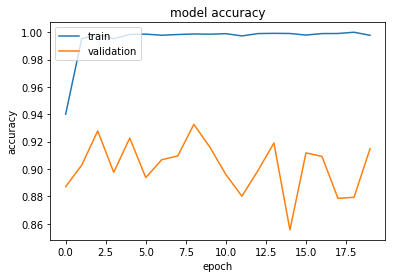

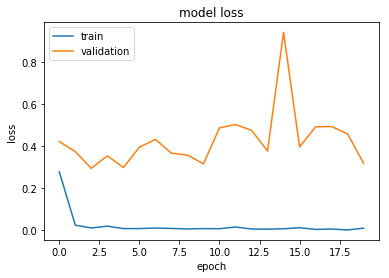

In [13]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.Xception_3.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=20, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

In [7]:
model.load_weights('saved_models/weights.train.Xception_3.hdf5')

In [18]:
weights = model.layers[5].get_weights()[0]
model2 = Model(model.input, [model.layers[3].input, model.output])

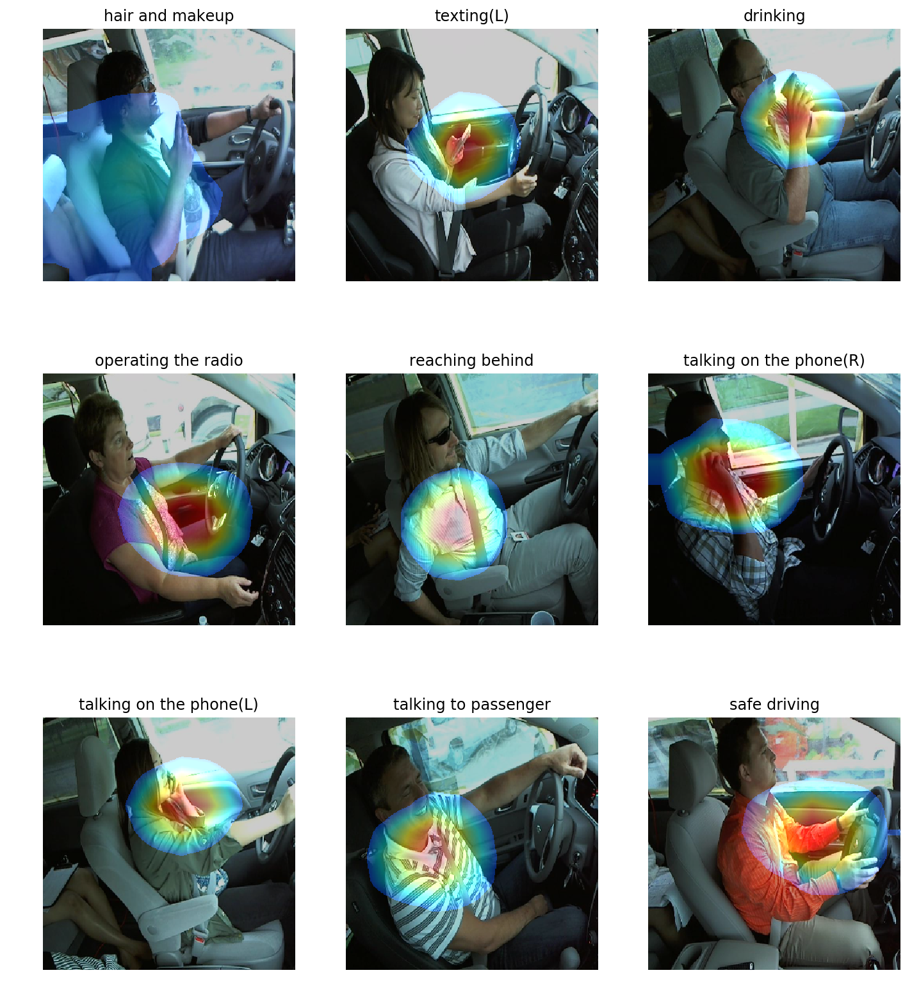

In [19]:
plot_some_samples(model2, weights, img_size)

Xception 2

In [8]:
#build and train Xception
input_tensor = Input((299, 299, 3))
base_model = Xception(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(xception.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.7)(x)
#x = Dense(10, activation='softmax')(x)
x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=None))(x)
model = Model(input_tensor, x)
optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#optv = optimizers.SGD(lr = 5e-4)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 299, 299, 3)       0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 299, 299, 3)       0         
_________________________________________________________________
xception (Model)             (None, 10, 10, 2048)      20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                20490     
Total params: 20,881,970
Trainable params: 20,827,442
Non-trainable params: 54,528
___________________________________________________________

Epoch 1/20
 204/1090 [====>.........................] - ETA: 1:39:48 - loss: 2.3107 - acc: 0.06 - ETA: 53:20 - loss: 2.3104 - acc: 0.1250 - ETA: 37:44 - loss: 2.3001 - acc: 0.10 - ETA: 29:56 - loss: 2.3067 - acc: 0.09 - ETA: 25:17 - loss: 2.3048 - acc: 0.10 - ETA: 22:08 - loss: 2.3034 - acc: 0.09 - ETA: 19:52 - loss: 2.3040 - acc: 0.09 - ETA: 18:12 - loss: 2.3074 - acc: 0.09 - ETA: 16:54 - loss: 2.3098 - acc: 0.08 - ETA: 15:52 - loss: 2.3029 - acc: 0.09 - ETA: 15:00 - loss: 2.2995 - acc: 0.09 - ETA: 14:18 - loss: 2.2939 - acc: 0.10 - ETA: 13:41 - loss: 2.2871 - acc: 0.11 - ETA: 13:11 - loss: 2.2833 - acc: 0.12 - ETA: 12:45 - loss: 2.2894 - acc: 0.12 - ETA: 12:21 - loss: 2.2957 - acc: 0.11 - ETA: 12:00 - loss: 2.2978 - acc: 0.11 - ETA: 11:41 - loss: 2.2967 - acc: 0.11 - ETA: 11:24 - loss: 2.2927 - acc: 0.12 - ETA: 11:10 - loss: 2.2882 - acc: 0.12 - ETA: 10:56 - loss: 2.2850 - acc: 0.13 - ETA: 10:43 - loss: 2.2870 - acc: 0.13 - ETA: 10:32 - loss: 2.2863 - acc: 0.14 - ETA: 10:21 - loss: 2

 204/1090 [====>.........................] - ETA: 6:47 - loss: 0.0156 - acc: 1.000 - ETA: 6:44 - loss: 0.0399 - acc: 1.000 - ETA: 6:43 - loss: 0.1110 - acc: 0.979 - ETA: 6:41 - loss: 0.0918 - acc: 0.984 - ETA: 6:40 - loss: 0.0755 - acc: 0.987 - ETA: 6:39 - loss: 0.0649 - acc: 0.989 - ETA: 6:38 - loss: 0.0570 - acc: 0.991 - ETA: 6:37 - loss: 0.0510 - acc: 0.992 - ETA: 6:36 - loss: 0.0468 - acc: 0.993 - ETA: 6:36 - loss: 0.0463 - acc: 0.993 - ETA: 6:35 - loss: 0.0446 - acc: 0.994 - ETA: 6:34 - loss: 0.0416 - acc: 0.994 - ETA: 6:34 - loss: 0.0424 - acc: 0.995 - ETA: 6:34 - loss: 0.0400 - acc: 0.995 - ETA: 6:33 - loss: 0.0478 - acc: 0.991 - ETA: 6:32 - loss: 0.0453 - acc: 0.992 - ETA: 6:33 - loss: 0.0434 - acc: 0.992 - ETA: 6:32 - loss: 0.0428 - acc: 0.993 - ETA: 6:32 - loss: 0.0411 - acc: 0.993 - ETA: 6:32 - loss: 0.0396 - acc: 0.993 - ETA: 6:31 - loss: 0.0387 - acc: 0.994 - ETA: 6:30 - loss: 0.0375 - acc: 0.994 - ETA: 6:30 - loss: 0.0364 - acc: 0.994 - ETA: 6:30 - loss: 0.0352 - acc: 0.9

1090/1090 [==============================] - ETA: 23s - loss: 0.0269 - acc: 0.99 - ETA: 23s - loss: 0.0269 - acc: 0.99 - ETA: 22s - loss: 0.0269 - acc: 0.99 - ETA: 22s - loss: 0.0269 - acc: 0.99 - ETA: 22s - loss: 0.0269 - acc: 0.99 - ETA: 21s - loss: 0.0268 - acc: 0.99 - ETA: 21s - loss: 0.0268 - acc: 0.99 - ETA: 20s - loss: 0.0268 - acc: 0.99 - ETA: 20s - loss: 0.0268 - acc: 0.99 - ETA: 20s - loss: 0.0267 - acc: 0.99 - ETA: 19s - loss: 0.0268 - acc: 0.99 - ETA: 19s - loss: 0.0267 - acc: 0.99 - ETA: 19s - loss: 0.0267 - acc: 0.99 - ETA: 18s - loss: 0.0267 - acc: 0.99 - ETA: 18s - loss: 0.0267 - acc: 0.99 - ETA: 17s - loss: 0.0270 - acc: 0.99 - ETA: 17s - loss: 0.0270 - acc: 0.99 - ETA: 17s - loss: 0.0269 - acc: 0.99 - ETA: 16s - loss: 0.0274 - acc: 0.99 - ETA: 16s - loss: 0.0274 - acc: 0.99 - ETA: 16s - loss: 0.0274 - acc: 0.99 - ETA: 15s - loss: 0.0273 - acc: 0.99 - ETA: 15s - loss: 0.0273 - acc: 0.99 - ETA: 15s - loss: 0.0273 - acc: 0.99 - ETA: 14s - loss: 0.0273 - acc: 0.99 - ETA: 

 204/1090 [====>.........................] - ETA: 6:29 - loss: 0.0182 - acc: 1.000 - ETA: 6:34 - loss: 0.0110 - acc: 1.000 - ETA: 6:35 - loss: 0.0078 - acc: 1.000 - ETA: 6:34 - loss: 0.0067 - acc: 1.000 - ETA: 6:35 - loss: 0.0055 - acc: 1.000 - ETA: 6:38 - loss: 0.0051 - acc: 1.000 - ETA: 6:37 - loss: 0.0075 - acc: 1.000 - ETA: 6:36 - loss: 0.0074 - acc: 1.000 - ETA: 6:36 - loss: 0.0067 - acc: 1.000 - ETA: 6:35 - loss: 0.0063 - acc: 1.000 - ETA: 6:34 - loss: 0.0062 - acc: 1.000 - ETA: 6:34 - loss: 0.0060 - acc: 1.000 - ETA: 6:34 - loss: 0.0057 - acc: 1.000 - ETA: 6:32 - loss: 0.0054 - acc: 1.000 - ETA: 6:32 - loss: 0.0052 - acc: 1.000 - ETA: 6:32 - loss: 0.0050 - acc: 1.000 - ETA: 6:31 - loss: 0.0053 - acc: 1.000 - ETA: 6:31 - loss: 0.0051 - acc: 1.000 - ETA: 6:30 - loss: 0.0055 - acc: 1.000 - ETA: 6:30 - loss: 0.0054 - acc: 1.000 - ETA: 6:30 - loss: 0.0053 - acc: 1.000 - ETA: 6:29 - loss: 0.0052 - acc: 1.000 - ETA: 6:29 - loss: 0.0052 - acc: 1.000 - ETA: 6:28 - loss: 0.0052 - acc: 1.0

1090/1090 [==============================] - ETA: 23s - loss: 0.0136 - acc: 0.99 - ETA: 23s - loss: 0.0136 - acc: 0.99 - ETA: 22s - loss: 0.0136 - acc: 0.99 - ETA: 22s - loss: 0.0136 - acc: 0.99 - ETA: 21s - loss: 0.0136 - acc: 0.99 - ETA: 21s - loss: 0.0136 - acc: 0.99 - ETA: 21s - loss: 0.0136 - acc: 0.99 - ETA: 20s - loss: 0.0138 - acc: 0.99 - ETA: 20s - loss: 0.0138 - acc: 0.99 - ETA: 20s - loss: 0.0138 - acc: 0.99 - ETA: 19s - loss: 0.0138 - acc: 0.99 - ETA: 19s - loss: 0.0138 - acc: 0.99 - ETA: 19s - loss: 0.0138 - acc: 0.99 - ETA: 18s - loss: 0.0138 - acc: 0.99 - ETA: 18s - loss: 0.0138 - acc: 0.99 - ETA: 17s - loss: 0.0138 - acc: 0.99 - ETA: 17s - loss: 0.0138 - acc: 0.99 - ETA: 17s - loss: 0.0138 - acc: 0.99 - ETA: 16s - loss: 0.0137 - acc: 0.99 - ETA: 16s - loss: 0.0137 - acc: 0.99 - ETA: 16s - loss: 0.0138 - acc: 0.99 - ETA: 15s - loss: 0.0138 - acc: 0.99 - ETA: 15s - loss: 0.0138 - acc: 0.99 - ETA: 15s - loss: 0.0138 - acc: 0.99 - ETA: 14s - loss: 0.0138 - acc: 0.99 - ETA: 

 188/1090 [====>.........................] - ETA: 7:05 - loss: 4.3002e-04 - acc: 1.000 - ETA: 6:51 - loss: 4.0784e-04 - acc: 1.000 - ETA: 6:41 - loss: 3.9703e-04 - acc: 1.000 - ETA: 6:43 - loss: 3.6907e-04 - acc: 1.000 - ETA: 6:39 - loss: 3.8223e-04 - acc: 1.000 - ETA: 6:40 - loss: 3.9968e-04 - acc: 1.000 - ETA: 6:40 - loss: 4.4717e-04 - acc: 1.000 - ETA: 6:39 - loss: 4.5033e-04 - acc: 1.000 - ETA: 6:38 - loss: 5.6356e-04 - acc: 1.000 - ETA: 6:37 - loss: 8.9065e-04 - acc: 1.000 - ETA: 6:35 - loss: 8.7269e-04 - acc: 1.000 - ETA: 6:35 - loss: 9.3602e-04 - acc: 1.000 - ETA: 6:35 - loss: 9.5069e-04 - acc: 1.000 - ETA: 6:34 - loss: 9.0221e-04 - acc: 1.000 - ETA: 6:34 - loss: 8.6004e-04 - acc: 1.000 - ETA: 6:33 - loss: 8.2703e-04 - acc: 1.000 - ETA: 6:32 - loss: 8.1480e-04 - acc: 1.000 - ETA: 6:32 - loss: 7.8985e-04 - acc: 1.000 - ETA: 6:32 - loss: 7.6751e-04 - acc: 1.000 - ETA: 6:31 - loss: 7.4879e-04 - acc: 1.000 - ETA: 6:32 - loss: 7.4684e-04 - acc: 1.000 - ETA: 6:31 - loss: 8.2450e-04 - 

1090/1090 [==============================] - ETA: 31s - loss: 0.0056 - acc: 0.99 - ETA: 31s - loss: 0.0056 - acc: 0.99 - ETA: 30s - loss: 0.0056 - acc: 0.99 - ETA: 30s - loss: 0.0056 - acc: 0.99 - ETA: 30s - loss: 0.0056 - acc: 0.99 - ETA: 29s - loss: 0.0056 - acc: 0.99 - ETA: 29s - loss: 0.0056 - acc: 0.99 - ETA: 29s - loss: 0.0056 - acc: 0.99 - ETA: 28s - loss: 0.0056 - acc: 0.99 - ETA: 28s - loss: 0.0056 - acc: 0.99 - ETA: 27s - loss: 0.0057 - acc: 0.99 - ETA: 27s - loss: 0.0057 - acc: 0.99 - ETA: 27s - loss: 0.0057 - acc: 0.99 - ETA: 26s - loss: 0.0057 - acc: 0.99 - ETA: 26s - loss: 0.0057 - acc: 0.99 - ETA: 26s - loss: 0.0057 - acc: 0.99 - ETA: 25s - loss: 0.0057 - acc: 0.99 - ETA: 25s - loss: 0.0057 - acc: 0.99 - ETA: 25s - loss: 0.0057 - acc: 0.99 - ETA: 24s - loss: 0.0057 - acc: 0.99 - ETA: 24s - loss: 0.0056 - acc: 0.99 - ETA: 23s - loss: 0.0056 - acc: 0.99 - ETA: 23s - loss: 0.0056 - acc: 0.99 - ETA: 23s - loss: 0.0056 - acc: 0.99 - ETA: 22s - loss: 0.0056 - acc: 0.99 - ETA: 

 201/1090 [====>.........................] - ETA: 6:42 - loss: 1.0624e-04 - acc: 1.000 - ETA: 6:44 - loss: 3.0297e-04 - acc: 1.000 - ETA: 6:42 - loss: 2.8778e-04 - acc: 1.000 - ETA: 6:43 - loss: 8.5745e-04 - acc: 1.000 - ETA: 6:42 - loss: 7.2634e-04 - acc: 1.000 - ETA: 6:41 - loss: 9.3115e-04 - acc: 1.000 - ETA: 6:41 - loss: 8.1947e-04 - acc: 1.000 - ETA: 6:40 - loss: 7.4547e-04 - acc: 1.000 - ETA: 6:39 - loss: 7.2886e-04 - acc: 1.000 - ETA: 6:39 - loss: 7.2824e-04 - acc: 1.000 - ETA: 6:38 - loss: 7.4510e-04 - acc: 1.000 - ETA: 6:38 - loss: 0.0012 - acc: 1.0000    - ETA: 6:38 - loss: 0.0012 - acc: 1.000 - ETA: 6:38 - loss: 0.0011 - acc: 1.000 - ETA: 6:38 - loss: 0.0016 - acc: 1.000 - ETA: 6:37 - loss: 0.0016 - acc: 1.000 - ETA: 6:37 - loss: 0.0015 - acc: 1.000 - ETA: 6:36 - loss: 0.0016 - acc: 1.000 - ETA: 6:36 - loss: 0.0015 - acc: 1.000 - ETA: 6:36 - loss: 0.0014 - acc: 1.000 - ETA: 6:36 - loss: 0.0014 - acc: 1.000 - ETA: 6:35 - loss: 0.0013 - acc: 1.000 - ETA: 6:35 - loss: 0.0013 - 

1090/1090 [==============================] - ETA: 24s - loss: 0.0091 - acc: 0.99 - ETA: 24s - loss: 0.0091 - acc: 0.99 - ETA: 23s - loss: 0.0091 - acc: 0.99 - ETA: 23s - loss: 0.0091 - acc: 0.99 - ETA: 23s - loss: 0.0091 - acc: 0.99 - ETA: 22s - loss: 0.0091 - acc: 0.99 - ETA: 22s - loss: 0.0091 - acc: 0.99 - ETA: 22s - loss: 0.0091 - acc: 0.99 - ETA: 21s - loss: 0.0090 - acc: 0.99 - ETA: 21s - loss: 0.0090 - acc: 0.99 - ETA: 21s - loss: 0.0090 - acc: 0.99 - ETA: 20s - loss: 0.0090 - acc: 0.99 - ETA: 20s - loss: 0.0090 - acc: 0.99 - ETA: 19s - loss: 0.0090 - acc: 0.99 - ETA: 19s - loss: 0.0090 - acc: 0.99 - ETA: 19s - loss: 0.0090 - acc: 0.99 - ETA: 18s - loss: 0.0090 - acc: 0.99 - ETA: 18s - loss: 0.0090 - acc: 0.99 - ETA: 18s - loss: 0.0090 - acc: 0.99 - ETA: 17s - loss: 0.0090 - acc: 0.99 - ETA: 17s - loss: 0.0090 - acc: 0.99 - ETA: 16s - loss: 0.0089 - acc: 0.99 - ETA: 16s - loss: 0.0092 - acc: 0.99 - ETA: 16s - loss: 0.0092 - acc: 0.99 - ETA: 15s - loss: 0.0092 - acc: 0.99 - ETA: 

 189/1090 [====>.........................] - ETA: 6:33 - loss: 7.8514e-05 - acc: 1.000 - ETA: 6:34 - loss: 1.4736e-04 - acc: 1.000 - ETA: 6:34 - loss: 1.4105e-04 - acc: 1.000 - ETA: 6:34 - loss: 1.2582e-04 - acc: 1.000 - ETA: 6:33 - loss: 1.2541e-04 - acc: 1.000 - ETA: 6:32 - loss: 1.3105e-04 - acc: 1.000 - ETA: 6:31 - loss: 1.6562e-04 - acc: 1.000 - ETA: 6:31 - loss: 0.0016 - acc: 1.0000    - ETA: 6:31 - loss: 0.0021 - acc: 1.000 - ETA: 6:31 - loss: 0.0019 - acc: 1.000 - ETA: 6:30 - loss: 0.0018 - acc: 1.000 - ETA: 6:30 - loss: 0.0016 - acc: 1.000 - ETA: 6:30 - loss: 0.0015 - acc: 1.000 - ETA: 6:30 - loss: 0.0014 - acc: 1.000 - ETA: 6:29 - loss: 0.0013 - acc: 1.000 - ETA: 6:29 - loss: 0.0013 - acc: 1.000 - ETA: 6:29 - loss: 0.0012 - acc: 1.000 - ETA: 6:28 - loss: 0.0012 - acc: 1.000 - ETA: 6:28 - loss: 0.0011 - acc: 1.000 - ETA: 6:28 - loss: 0.0013 - acc: 1.000 - ETA: 6:27 - loss: 0.0012 - acc: 1.000 - ETA: 6:27 - loss: 0.0012 - acc: 1.000 - ETA: 6:26 - loss: 0.0011 - acc: 1.000 - ETA

1090/1090 [==============================] - ETA: 29s - loss: 0.0072 - acc: 0.99 - ETA: 28s - loss: 0.0072 - acc: 0.99 - ETA: 28s - loss: 0.0072 - acc: 0.99 - ETA: 28s - loss: 0.0072 - acc: 0.99 - ETA: 27s - loss: 0.0072 - acc: 0.99 - ETA: 27s - loss: 0.0072 - acc: 0.99 - ETA: 26s - loss: 0.0072 - acc: 0.99 - ETA: 26s - loss: 0.0072 - acc: 0.99 - ETA: 26s - loss: 0.0072 - acc: 0.99 - ETA: 25s - loss: 0.0072 - acc: 0.99 - ETA: 25s - loss: 0.0072 - acc: 0.99 - ETA: 25s - loss: 0.0072 - acc: 0.99 - ETA: 24s - loss: 0.0072 - acc: 0.99 - ETA: 24s - loss: 0.0072 - acc: 0.99 - ETA: 24s - loss: 0.0072 - acc: 0.99 - ETA: 23s - loss: 0.0072 - acc: 0.99 - ETA: 23s - loss: 0.0072 - acc: 0.99 - ETA: 22s - loss: 0.0072 - acc: 0.99 - ETA: 22s - loss: 0.0071 - acc: 0.99 - ETA: 22s - loss: 0.0071 - acc: 0.99 - ETA: 21s - loss: 0.0071 - acc: 0.99 - ETA: 21s - loss: 0.0071 - acc: 0.99 - ETA: 21s - loss: 0.0071 - acc: 0.99 - ETA: 20s - loss: 0.0071 - acc: 0.99 - ETA: 20s - loss: 0.0071 - acc: 0.99 - ETA: 

 204/1090 [====>.........................] - ETA: 6:48 - loss: 5.0523e-04 - acc: 1.000 - ETA: 6:47 - loss: 0.0027 - acc: 1.0000    - ETA: 6:48 - loss: 0.0022 - acc: 1.000 - ETA: 6:46 - loss: 0.0017 - acc: 1.000 - ETA: 6:46 - loss: 0.0017 - acc: 1.000 - ETA: 6:45 - loss: 0.0015 - acc: 1.000 - ETA: 6:45 - loss: 0.0013 - acc: 1.000 - ETA: 6:45 - loss: 0.0013 - acc: 1.000 - ETA: 6:44 - loss: 0.0012 - acc: 1.000 - ETA: 6:44 - loss: 0.0011 - acc: 1.000 - ETA: 6:44 - loss: 0.0010 - acc: 1.000 - ETA: 6:42 - loss: 0.0011 - acc: 1.000 - ETA: 6:42 - loss: 9.9641e-04 - acc: 1.000 - ETA: 6:40 - loss: 9.3488e-04 - acc: 1.000 - ETA: 6:40 - loss: 8.7819e-04 - acc: 1.000 - ETA: 6:38 - loss: 8.3179e-04 - acc: 1.000 - ETA: 6:38 - loss: 0.0021 - acc: 1.0000    - ETA: 6:38 - loss: 0.0021 - acc: 1.000 - ETA: 6:37 - loss: 0.0071 - acc: 0.996 - ETA: 6:37 - loss: 0.0067 - acc: 0.996 - ETA: 6:37 - loss: 0.0064 - acc: 0.997 - ETA: 6:37 - loss: 0.0062 - acc: 0.997 - ETA: 6:37 - loss: 0.0059 - acc: 0.997 - ETA: 6:

1090/1090 [==============================] - ETA: 23s - loss: 0.0056 - acc: 0.99 - ETA: 23s - loss: 0.0056 - acc: 0.99 - ETA: 22s - loss: 0.0056 - acc: 0.99 - ETA: 22s - loss: 0.0056 - acc: 0.99 - ETA: 21s - loss: 0.0056 - acc: 0.99 - ETA: 21s - loss: 0.0056 - acc: 0.99 - ETA: 21s - loss: 0.0056 - acc: 0.99 - ETA: 20s - loss: 0.0056 - acc: 0.99 - ETA: 20s - loss: 0.0056 - acc: 0.99 - ETA: 20s - loss: 0.0056 - acc: 0.99 - ETA: 19s - loss: 0.0055 - acc: 0.99 - ETA: 19s - loss: 0.0055 - acc: 0.99 - ETA: 19s - loss: 0.0055 - acc: 0.99 - ETA: 18s - loss: 0.0055 - acc: 0.99 - ETA: 18s - loss: 0.0057 - acc: 0.99 - ETA: 17s - loss: 0.0057 - acc: 0.99 - ETA: 17s - loss: 0.0057 - acc: 0.99 - ETA: 17s - loss: 0.0057 - acc: 0.99 - ETA: 16s - loss: 0.0057 - acc: 0.99 - ETA: 16s - loss: 0.0057 - acc: 0.99 - ETA: 16s - loss: 0.0057 - acc: 0.99 - ETA: 15s - loss: 0.0057 - acc: 0.99 - ETA: 15s - loss: 0.0057 - acc: 0.99 - ETA: 14s - loss: 0.0057 - acc: 0.99 - ETA: 14s - loss: 0.0057 - acc: 0.99 - ETA: 

 201/1090 [====>.........................] - ETA: 6:37 - loss: 3.2471e-04 - acc: 1.000 - ETA: 6:32 - loss: 3.7953e-04 - acc: 1.000 - ETA: 6:33 - loss: 3.1516e-04 - acc: 1.000 - ETA: 6:35 - loss: 2.5766e-04 - acc: 1.000 - ETA: 6:36 - loss: 2.5009e-04 - acc: 1.000 - ETA: 6:36 - loss: 2.4347e-04 - acc: 1.000 - ETA: 6:37 - loss: 2.1771e-04 - acc: 1.000 - ETA: 6:35 - loss: 2.0187e-04 - acc: 1.000 - ETA: 6:34 - loss: 1.9944e-04 - acc: 1.000 - ETA: 6:34 - loss: 1.8722e-04 - acc: 1.000 - ETA: 6:33 - loss: 2.0756e-04 - acc: 1.000 - ETA: 6:33 - loss: 2.0653e-04 - acc: 1.000 - ETA: 6:34 - loss: 2.1906e-04 - acc: 1.000 - ETA: 6:34 - loss: 2.1630e-04 - acc: 1.000 - ETA: 6:33 - loss: 2.7082e-04 - acc: 1.000 - ETA: 6:32 - loss: 3.1911e-04 - acc: 1.000 - ETA: 6:32 - loss: 3.0197e-04 - acc: 1.000 - ETA: 6:32 - loss: 3.1022e-04 - acc: 1.000 - ETA: 6:32 - loss: 3.1098e-04 - acc: 1.000 - ETA: 6:31 - loss: 3.0237e-04 - acc: 1.000 - ETA: 6:31 - loss: 4.4919e-04 - acc: 1.000 - ETA: 6:30 - loss: 4.3107e-04 - 

1090/1090 [==============================] - ETA: 24s - loss: 0.0032 - acc: 0.99 - ETA: 24s - loss: 0.0032 - acc: 0.99 - ETA: 23s - loss: 0.0032 - acc: 0.99 - ETA: 23s - loss: 0.0032 - acc: 0.99 - ETA: 23s - loss: 0.0032 - acc: 0.99 - ETA: 22s - loss: 0.0032 - acc: 0.99 - ETA: 22s - loss: 0.0032 - acc: 0.99 - ETA: 21s - loss: 0.0032 - acc: 0.99 - ETA: 21s - loss: 0.0032 - acc: 0.99 - ETA: 21s - loss: 0.0032 - acc: 0.99 - ETA: 20s - loss: 0.0032 - acc: 0.99 - ETA: 20s - loss: 0.0032 - acc: 0.99 - ETA: 20s - loss: 0.0033 - acc: 0.99 - ETA: 19s - loss: 0.0032 - acc: 0.99 - ETA: 19s - loss: 0.0032 - acc: 0.99 - ETA: 19s - loss: 0.0032 - acc: 0.99 - ETA: 18s - loss: 0.0032 - acc: 0.99 - ETA: 18s - loss: 0.0032 - acc: 0.99 - ETA: 17s - loss: 0.0032 - acc: 0.99 - ETA: 17s - loss: 0.0032 - acc: 0.99 - ETA: 17s - loss: 0.0032 - acc: 0.99 - ETA: 16s - loss: 0.0032 - acc: 0.99 - ETA: 16s - loss: 0.0032 - acc: 0.99 - ETA: 16s - loss: 0.0032 - acc: 0.99 - ETA: 15s - loss: 0.0032 - acc: 0.99 - ETA: 

 186/1090 [====>.........................] - ETA: 6:36 - loss: 2.5140e-05 - acc: 1.000 - ETA: 6:36 - loss: 1.0220e-04 - acc: 1.000 - ETA: 6:40 - loss: 1.5779e-04 - acc: 1.000 - ETA: 6:39 - loss: 1.3496e-04 - acc: 1.000 - ETA: 6:39 - loss: 1.1025e-04 - acc: 1.000 - ETA: 6:38 - loss: 1.0774e-04 - acc: 1.000 - ETA: 6:42 - loss: 1.2012e-04 - acc: 1.000 - ETA: 6:41 - loss: 1.1746e-04 - acc: 1.000 - ETA: 6:40 - loss: 1.1757e-04 - acc: 1.000 - ETA: 6:40 - loss: 2.2012e-04 - acc: 1.000 - ETA: 6:39 - loss: 2.0528e-04 - acc: 1.000 - ETA: 6:37 - loss: 1.9705e-04 - acc: 1.000 - ETA: 6:37 - loss: 1.8429e-04 - acc: 1.000 - ETA: 6:36 - loss: 1.7354e-04 - acc: 1.000 - ETA: 6:35 - loss: 1.6275e-04 - acc: 1.000 - ETA: 6:35 - loss: 1.9293e-04 - acc: 1.000 - ETA: 6:34 - loss: 1.9663e-04 - acc: 1.000 - ETA: 6:34 - loss: 1.8952e-04 - acc: 1.000 - ETA: 6:34 - loss: 2.0611e-04 - acc: 1.000 - ETA: 6:33 - loss: 2.6266e-04 - acc: 1.000 - ETA: 6:32 - loss: 2.5126e-04 - acc: 1.000 - ETA: 6:32 - loss: 2.4133e-04 - 

1090/1090 [==============================] - ETA: 51s - loss: 0.0014 - acc: 0.99 - ETA: 51s - loss: 0.0014 - acc: 0.99 - ETA: 51s - loss: 0.0014 - acc: 0.99 - ETA: 50s - loss: 0.0014 - acc: 0.99 - ETA: 50s - loss: 0.0014 - acc: 0.99 - ETA: 49s - loss: 0.0014 - acc: 0.99 - ETA: 49s - loss: 0.0014 - acc: 0.99 - ETA: 49s - loss: 0.0014 - acc: 0.99 - ETA: 48s - loss: 0.0014 - acc: 0.99 - ETA: 48s - loss: 0.0014 - acc: 0.99 - ETA: 48s - loss: 0.0014 - acc: 0.99 - ETA: 47s - loss: 0.0014 - acc: 0.99 - ETA: 47s - loss: 0.0014 - acc: 0.99 - ETA: 46s - loss: 0.0016 - acc: 0.99 - ETA: 46s - loss: 0.0016 - acc: 0.99 - ETA: 46s - loss: 0.0016 - acc: 0.99 - ETA: 45s - loss: 0.0016 - acc: 0.99 - ETA: 45s - loss: 0.0016 - acc: 0.99 - ETA: 45s - loss: 0.0016 - acc: 0.99 - ETA: 44s - loss: 0.0016 - acc: 0.99 - ETA: 44s - loss: 0.0016 - acc: 0.99 - ETA: 43s - loss: 0.0016 - acc: 0.99 - ETA: 43s - loss: 0.0016 - acc: 0.99 - ETA: 43s - loss: 0.0016 - acc: 0.99 - ETA: 42s - loss: 0.0016 - acc: 0.99 - ETA: 

 204/1090 [====>.........................] - ETA: 6:33 - loss: 0.0463 - acc: 1.000 - ETA: 6:32 - loss: 0.0236 - acc: 1.000 - ETA: 6:30 - loss: 0.0159 - acc: 1.000 - ETA: 6:34 - loss: 0.0119 - acc: 1.000 - ETA: 6:34 - loss: 0.0098 - acc: 1.000 - ETA: 6:33 - loss: 0.0091 - acc: 1.000 - ETA: 6:31 - loss: 0.0079 - acc: 1.000 - ETA: 6:32 - loss: 0.0069 - acc: 1.000 - ETA: 6:30 - loss: 0.0063 - acc: 1.000 - ETA: 6:31 - loss: 0.0059 - acc: 1.000 - ETA: 6:31 - loss: 0.0058 - acc: 1.000 - ETA: 6:31 - loss: 0.0053 - acc: 1.000 - ETA: 6:31 - loss: 0.0049 - acc: 1.000 - ETA: 6:31 - loss: 0.0045 - acc: 1.000 - ETA: 6:29 - loss: 0.0043 - acc: 1.000 - ETA: 6:30 - loss: 0.0041 - acc: 1.000 - ETA: 6:30 - loss: 0.0039 - acc: 1.000 - ETA: 6:30 - loss: 0.0036 - acc: 1.000 - ETA: 6:29 - loss: 0.0035 - acc: 1.000 - ETA: 6:29 - loss: 0.0034 - acc: 1.000 - ETA: 6:28 - loss: 0.0032 - acc: 1.000 - ETA: 6:28 - loss: 0.0032 - acc: 1.000 - ETA: 6:28 - loss: 0.0046 - acc: 1.000 - ETA: 6:27 - loss: 0.0045 - acc: 1.0

1090/1090 [==============================] - ETA: 23s - loss: 0.0072 - acc: 0.99 - ETA: 23s - loss: 0.0072 - acc: 0.99 - ETA: 22s - loss: 0.0072 - acc: 0.99 - ETA: 22s - loss: 0.0072 - acc: 0.99 - ETA: 21s - loss: 0.0072 - acc: 0.99 - ETA: 21s - loss: 0.0072 - acc: 0.99 - ETA: 21s - loss: 0.0072 - acc: 0.99 - ETA: 20s - loss: 0.0071 - acc: 0.99 - ETA: 20s - loss: 0.0071 - acc: 0.99 - ETA: 20s - loss: 0.0071 - acc: 0.99 - ETA: 19s - loss: 0.0071 - acc: 0.99 - ETA: 19s - loss: 0.0071 - acc: 0.99 - ETA: 19s - loss: 0.0071 - acc: 0.99 - ETA: 18s - loss: 0.0071 - acc: 0.99 - ETA: 18s - loss: 0.0071 - acc: 0.99 - ETA: 17s - loss: 0.0071 - acc: 0.99 - ETA: 17s - loss: 0.0071 - acc: 0.99 - ETA: 17s - loss: 0.0071 - acc: 0.99 - ETA: 16s - loss: 0.0071 - acc: 0.99 - ETA: 16s - loss: 0.0071 - acc: 0.99 - ETA: 16s - loss: 0.0071 - acc: 0.99 - ETA: 15s - loss: 0.0071 - acc: 0.99 - ETA: 15s - loss: 0.0071 - acc: 0.99 - ETA: 14s - loss: 0.0071 - acc: 0.99 - ETA: 14s - loss: 0.0071 - acc: 0.99 - ETA: 

 204/1090 [====>.........................] - ETA: 6:25 - loss: 0.0012 - acc: 1.000 - ETA: 6:44 - loss: 7.3380e-04 - acc: 1.000 - ETA: 6:41 - loss: 0.0023 - acc: 1.0000    - ETA: 6:39 - loss: 0.0020 - acc: 1.000 - ETA: 6:37 - loss: 0.0017 - acc: 1.000 - ETA: 6:37 - loss: 0.0016 - acc: 1.000 - ETA: 6:37 - loss: 0.0014 - acc: 1.000 - ETA: 6:36 - loss: 0.0013 - acc: 1.000 - ETA: 6:35 - loss: 0.0015 - acc: 1.000 - ETA: 6:35 - loss: 0.0016 - acc: 1.000 - ETA: 6:36 - loss: 0.0025 - acc: 1.000 - ETA: 6:35 - loss: 0.0098 - acc: 0.994 - ETA: 6:36 - loss: 0.0094 - acc: 0.995 - ETA: 6:36 - loss: 0.0089 - acc: 0.995 - ETA: 6:36 - loss: 0.0083 - acc: 0.995 - ETA: 6:36 - loss: 0.0078 - acc: 0.996 - ETA: 6:35 - loss: 0.0074 - acc: 0.996 - ETA: 6:34 - loss: 0.0071 - acc: 0.996 - ETA: 6:34 - loss: 0.0068 - acc: 0.996 - ETA: 6:33 - loss: 0.0065 - acc: 0.996 - ETA: 6:33 - loss: 0.0063 - acc: 0.997 - ETA: 6:33 - loss: 0.0061 - acc: 0.997 - ETA: 6:32 - loss: 0.0153 - acc: 0.994 - ETA: 6:32 - loss: 0.0150 - 

1090/1090 [==============================] - ETA: 23s - loss: 0.0046 - acc: 0.99 - ETA: 23s - loss: 0.0046 - acc: 0.99 - ETA: 22s - loss: 0.0046 - acc: 0.99 - ETA: 22s - loss: 0.0046 - acc: 0.99 - ETA: 21s - loss: 0.0046 - acc: 0.99 - ETA: 21s - loss: 0.0046 - acc: 0.99 - ETA: 21s - loss: 0.0046 - acc: 0.99 - ETA: 20s - loss: 0.0046 - acc: 0.99 - ETA: 20s - loss: 0.0046 - acc: 0.99 - ETA: 20s - loss: 0.0046 - acc: 0.99 - ETA: 19s - loss: 0.0046 - acc: 0.99 - ETA: 19s - loss: 0.0046 - acc: 0.99 - ETA: 19s - loss: 0.0046 - acc: 0.99 - ETA: 18s - loss: 0.0046 - acc: 0.99 - ETA: 18s - loss: 0.0045 - acc: 0.99 - ETA: 17s - loss: 0.0045 - acc: 0.99 - ETA: 17s - loss: 0.0045 - acc: 0.99 - ETA: 17s - loss: 0.0045 - acc: 0.99 - ETA: 16s - loss: 0.0045 - acc: 0.99 - ETA: 16s - loss: 0.0045 - acc: 0.99 - ETA: 16s - loss: 0.0045 - acc: 0.99 - ETA: 15s - loss: 0.0045 - acc: 0.99 - ETA: 15s - loss: 0.0045 - acc: 0.99 - ETA: 15s - loss: 0.0045 - acc: 0.99 - ETA: 14s - loss: 0.0045 - acc: 0.99 - ETA: 

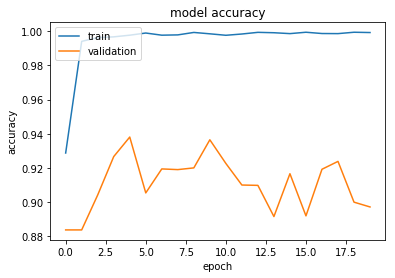

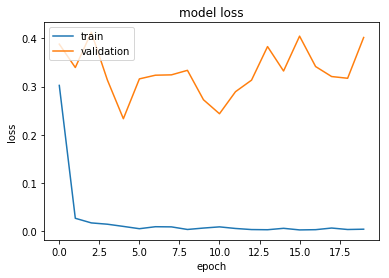

In [9]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.Xception_2.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=20, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

#### Train InceptionResNetV2

In [6]:
#build and train InceptionResNetV2
input_tensor = Input((299, 299, 3))
base_model = InceptionResNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False)
x = Lambda(inception_resnet_v2.preprocess_input)(input_tensor)
x = base_model(x)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.8)(x)
x = Dense(10, activation='softmax')(x)
#x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=None))(x)
model = Model(input_tensor, x)
optv = optimizers.Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
#optv = optimizers.SGD(lr = 5e-4)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 299, 299, 3)       0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 299, 299, 3)       0         
_________________________________________________________________
inception_resnet_v2 (Model)  (None, 8, 8, 1536)        54336736  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1536)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1536)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                15370     
Total params: 54,352,106
Trainable params: 54,291,562
Non-trainable params: 60,544
___________________________________________________________

In [ ]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.InceptionResNet_3.hdf5', 
                               verbose=1, save_best_only=True)
history = model.fit_generator(train_generator, epochs=15, callbacks=[checkpointer]
                              ,validation_data=valid_generator)

plot_loss_acc(history)

Epoch 1/15
 204/1090 [====>.........................] - ETA: 5:46:24 - loss: 2.8378 - acc: 0.06 - ETA: 2:56:43 - loss: 2.8278 - acc: 0.06 - ETA: 2:00:20 - loss: 2.8529 - acc: 0.06 - ETA: 1:32:03 - loss: 2.7086 - acc: 0.09 - ETA: 1:15:03 - loss: 2.6709 - acc: 0.11 - ETA: 1:03:45 - loss: 2.6746 - acc: 0.10 - ETA: 55:40 - loss: 2.6593 - acc: 0.1161 - ETA: 49:36 - loss: 2.6542 - acc: 0.12 - ETA: 44:53 - loss: 2.6145 - acc: 0.13 - ETA: 41:08 - loss: 2.5645 - acc: 0.15 - ETA: 38:04 - loss: 2.5591 - acc: 0.14 - ETA: 35:30 - loss: 2.5610 - acc: 0.15 - ETA: 33:20 - loss: 2.5862 - acc: 0.14 - ETA: 31:28 - loss: 2.5823 - acc: 0.13 - ETA: 29:50 - loss: 2.5796 - acc: 0.13 - ETA: 28:24 - loss: 2.5700 - acc: 0.14 - ETA: 27:08 - loss: 2.5670 - acc: 0.14 - ETA: 26:02 - loss: 2.5544 - acc: 0.14 - ETA: 25:02 - loss: 2.5377 - acc: 0.14 - ETA: 24:08 - loss: 2.5358 - acc: 0.15 - ETA: 23:19 - loss: 2.5161 - acc: 0.15 - ETA: 22:34 - loss: 2.5096 - acc: 0.15 - ETA: 21:54 - loss: 2.5066 - acc: 0.15 - ETA: 21:17

 204/1090 [====>.........................] - ETA: 8:07 - loss: 0.0142 - acc: 1.000 - ETA: 7:54 - loss: 0.0243 - acc: 1.000 - ETA: 7:48 - loss: 0.0226 - acc: 1.000 - ETA: 7:45 - loss: 0.0301 - acc: 1.000 - ETA: 7:44 - loss: 0.0598 - acc: 0.975 - ETA: 7:45 - loss: 0.0511 - acc: 0.979 - ETA: 7:44 - loss: 0.0495 - acc: 0.982 - ETA: 7:43 - loss: 0.0453 - acc: 0.984 - ETA: 7:43 - loss: 0.0416 - acc: 0.986 - ETA: 7:41 - loss: 0.0385 - acc: 0.987 - ETA: 7:40 - loss: 0.0358 - acc: 0.988 - ETA: 7:40 - loss: 0.0348 - acc: 0.989 - ETA: 7:39 - loss: 0.0323 - acc: 0.990 - ETA: 7:38 - loss: 0.0352 - acc: 0.986 - ETA: 7:36 - loss: 0.0394 - acc: 0.983 - ETA: 7:36 - loss: 0.0375 - acc: 0.984 - ETA: 7:35 - loss: 0.0363 - acc: 0.985 - ETA: 7:35 - loss: 0.0347 - acc: 0.986 - ETA: 7:33 - loss: 0.0390 - acc: 0.983 - ETA: 7:33 - loss: 0.0372 - acc: 0.984 - ETA: 7:32 - loss: 0.0429 - acc: 0.982 - ETA: 7:31 - loss: 0.0416 - acc: 0.983 - ETA: 7:31 - loss: 0.0467 - acc: 0.981 - ETA: 7:30 - loss: 0.0448 - acc: 0.9

1090/1090 [==============================] - ETA: 27s - loss: 0.0382 - acc: 0.98 - ETA: 27s - loss: 0.0382 - acc: 0.98 - ETA: 26s - loss: 0.0382 - acc: 0.98 - ETA: 26s - loss: 0.0384 - acc: 0.98 - ETA: 25s - loss: 0.0383 - acc: 0.98 - ETA: 25s - loss: 0.0383 - acc: 0.98 - ETA: 24s - loss: 0.0383 - acc: 0.98 - ETA: 24s - loss: 0.0383 - acc: 0.98 - ETA: 24s - loss: 0.0383 - acc: 0.98 - ETA: 23s - loss: 0.0383 - acc: 0.98 - ETA: 23s - loss: 0.0383 - acc: 0.98 - ETA: 22s - loss: 0.0383 - acc: 0.98 - ETA: 22s - loss: 0.0383 - acc: 0.98 - ETA: 21s - loss: 0.0382 - acc: 0.98 - ETA: 21s - loss: 0.0382 - acc: 0.98 - ETA: 21s - loss: 0.0382 - acc: 0.98 - ETA: 20s - loss: 0.0381 - acc: 0.98 - ETA: 20s - loss: 0.0381 - acc: 0.98 - ETA: 19s - loss: 0.0381 - acc: 0.98 - ETA: 19s - loss: 0.0380 - acc: 0.98 - ETA: 19s - loss: 0.0381 - acc: 0.98 - ETA: 18s - loss: 0.0382 - acc: 0.98 - ETA: 18s - loss: 0.0381 - acc: 0.98 - ETA: 17s - loss: 0.0381 - acc: 0.98 - ETA: 17s - loss: 0.0381 - acc: 0.98 - ETA: 

 204/1090 [====>.........................] - ETA: 8:06 - loss: 0.0043 - acc: 1.000 - ETA: 7:50 - loss: 0.0037 - acc: 1.000 - ETA: 7:44 - loss: 0.0042 - acc: 1.000 - ETA: 7:41 - loss: 0.0039 - acc: 1.000 - ETA: 7:40 - loss: 0.0042 - acc: 1.000 - ETA: 7:38 - loss: 0.0041 - acc: 1.000 - ETA: 7:37 - loss: 0.0038 - acc: 1.000 - ETA: 7:37 - loss: 0.0037 - acc: 1.000 - ETA: 7:36 - loss: 0.0076 - acc: 1.000 - ETA: 7:35 - loss: 0.0069 - acc: 1.000 - ETA: 7:35 - loss: 0.0069 - acc: 1.000 - ETA: 7:35 - loss: 0.0064 - acc: 1.000 - ETA: 7:35 - loss: 0.0336 - acc: 0.995 - ETA: 7:34 - loss: 0.0315 - acc: 0.995 - ETA: 7:33 - loss: 0.0299 - acc: 0.995 - ETA: 7:34 - loss: 0.0282 - acc: 0.996 - ETA: 7:33 - loss: 0.0267 - acc: 0.996 - ETA: 7:32 - loss: 0.0253 - acc: 0.996 - ETA: 7:32 - loss: 0.0247 - acc: 0.996 - ETA: 7:31 - loss: 0.0235 - acc: 0.996 - ETA: 7:30 - loss: 0.0228 - acc: 0.997 - ETA: 7:30 - loss: 0.0219 - acc: 0.997 - ETA: 7:30 - loss: 0.0222 - acc: 0.997 - ETA: 7:28 - loss: 0.0214 - acc: 0.9

1090/1090 [==============================] - ETA: 27s - loss: 0.0199 - acc: 0.99 - ETA: 27s - loss: 0.0199 - acc: 0.99 - ETA: 26s - loss: 0.0199 - acc: 0.99 - ETA: 26s - loss: 0.0199 - acc: 0.99 - ETA: 25s - loss: 0.0199 - acc: 0.99 - ETA: 25s - loss: 0.0198 - acc: 0.99 - ETA: 25s - loss: 0.0198 - acc: 0.99 - ETA: 24s - loss: 0.0198 - acc: 0.99 - ETA: 24s - loss: 0.0198 - acc: 0.99 - ETA: 23s - loss: 0.0198 - acc: 0.99 - ETA: 23s - loss: 0.0198 - acc: 0.99 - ETA: 22s - loss: 0.0197 - acc: 0.99 - ETA: 22s - loss: 0.0197 - acc: 0.99 - ETA: 22s - loss: 0.0197 - acc: 0.99 - ETA: 21s - loss: 0.0197 - acc: 0.99 - ETA: 21s - loss: 0.0197 - acc: 0.99 - ETA: 20s - loss: 0.0197 - acc: 0.99 - ETA: 20s - loss: 0.0197 - acc: 0.99 - ETA: 19s - loss: 0.0197 - acc: 0.99 - ETA: 19s - loss: 0.0196 - acc: 0.99 - ETA: 19s - loss: 0.0196 - acc: 0.99 - ETA: 18s - loss: 0.0196 - acc: 0.99 - ETA: 18s - loss: 0.0196 - acc: 0.99 - ETA: 17s - loss: 0.0196 - acc: 0.99 - ETA: 17s - loss: 0.0196 - acc: 0.99 - ETA: 

 204/1090 [====>.........................] - ETA: 7:30 - loss: 0.0175 - acc: 1.000 - ETA: 7:43 - loss: 0.0093 - acc: 1.000 - ETA: 7:43 - loss: 0.0063 - acc: 1.000 - ETA: 7:48 - loss: 0.0053 - acc: 1.000 - ETA: 7:48 - loss: 0.0044 - acc: 1.000 - ETA: 7:45 - loss: 0.0047 - acc: 1.000 - ETA: 7:44 - loss: 0.0041 - acc: 1.000 - ETA: 7:41 - loss: 0.0037 - acc: 1.000 - ETA: 7:41 - loss: 0.0039 - acc: 1.000 - ETA: 7:39 - loss: 0.0039 - acc: 1.000 - ETA: 7:39 - loss: 0.0036 - acc: 1.000 - ETA: 7:38 - loss: 0.0033 - acc: 1.000 - ETA: 7:38 - loss: 0.0120 - acc: 0.995 - ETA: 7:37 - loss: 0.0112 - acc: 0.995 - ETA: 7:36 - loss: 0.0122 - acc: 0.995 - ETA: 7:35 - loss: 0.0146 - acc: 0.992 - ETA: 7:34 - loss: 0.0138 - acc: 0.992 - ETA: 7:34 - loss: 0.0131 - acc: 0.993 - ETA: 7:34 - loss: 0.0126 - acc: 0.993 - ETA: 7:34 - loss: 0.0120 - acc: 0.993 - ETA: 7:32 - loss: 0.0114 - acc: 0.994 - ETA: 7:32 - loss: 0.0109 - acc: 0.994 - ETA: 7:31 - loss: 0.0108 - acc: 0.994 - ETA: 7:30 - loss: 0.0103 - acc: 0.9

1090/1090 [==============================] - ETA: 27s - loss: 0.0152 - acc: 0.99 - ETA: 27s - loss: 0.0152 - acc: 0.99 - ETA: 26s - loss: 0.0152 - acc: 0.99 - ETA: 26s - loss: 0.0152 - acc: 0.99 - ETA: 25s - loss: 0.0152 - acc: 0.99 - ETA: 25s - loss: 0.0153 - acc: 0.99 - ETA: 25s - loss: 0.0153 - acc: 0.99 - ETA: 24s - loss: 0.0153 - acc: 0.99 - ETA: 24s - loss: 0.0153 - acc: 0.99 - ETA: 23s - loss: 0.0153 - acc: 0.99 - ETA: 23s - loss: 0.0153 - acc: 0.99 - ETA: 22s - loss: 0.0153 - acc: 0.99 - ETA: 22s - loss: 0.0153 - acc: 0.99 - ETA: 22s - loss: 0.0153 - acc: 0.99 - ETA: 21s - loss: 0.0153 - acc: 0.99 - ETA: 21s - loss: 0.0153 - acc: 0.99 - ETA: 20s - loss: 0.0153 - acc: 0.99 - ETA: 20s - loss: 0.0152 - acc: 0.99 - ETA: 19s - loss: 0.0152 - acc: 0.99 - ETA: 19s - loss: 0.0152 - acc: 0.99 - ETA: 19s - loss: 0.0152 - acc: 0.99 - ETA: 18s - loss: 0.0152 - acc: 0.99 - ETA: 18s - loss: 0.0152 - acc: 0.99 - ETA: 17s - loss: 0.0152 - acc: 0.99 - ETA: 17s - loss: 0.0152 - acc: 0.99 - ETA: 

#### 函數模型

In [9]:
input_tensor = Input((299, 299, 3))
xcep = Xception(input_tensor=input_tensor, weights='imagenet', include_top=False, pooling='avg')
incep = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=False, pooling='avg')
irn = InceptionResNetV2(input_tensor=input_tensor, weights='imagenet', include_top=False, pooling='avg')

a = Lambda(xception.preprocess_input)(input_tensor)
a = xcep(a)
b = Lambda(inception_v3.preprocess_input)(input_tensor)
b = incep(b)
c = Lambda(inception_resnet_v2.preprocess_input)(input_tensor)
c = irn(c)

x = Concatenate()([a, b, c])
x = Dropout(0.7)(x)
x = Dense(10, activation='softmax', kernel_initializer=init.RandomNormal(mean=0.0, stddev=0.01, seed=None))(x)
#x = Dense(10, activation='softmax')(x)

model = Model(input_tensor, x)
optv = optimizers.Adam(lr=5e-5, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
model.compile(optimizer=optv, loss='categorical_crossentropy', metrics=['acc'])


In [10]:
#checkpointer = ModelCheckpoint(filepath='saved_models/weights.train.XI.hdf5', 
                               #verbose=1, save_best_only=True)
#history = 
model.fit_generator(train_generator, epochs=10, callbacks=None, verbose=2
                              ,validation_data=valid_generator)

#plot_loss_acc(history)

Epoch 1/10


ResourceExhaustedError: OOM when allocating tensor with shape[16,19,19,728] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[Node: xception_4/block8_sepconv2/separable_conv2d/depthwise = DepthwiseConv2dNative[T=DT_FLOAT, data_format="NHWC", dilations=[1, 1, 1, 1], padding="SAME", strides=[1, 1, 1, 1], _device="/job:localhost/replica:0/task:0/device:GPU:0"](xception_4/block8_sepconv2_act/Relu, block8_sepconv2_4/depthwise_kernel/read)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[Node: metrics/acc/Mean/_28413 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_102462_metrics/acc/Mean", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.


Caused by op 'xception_4/block8_sepconv2/separable_conv2d/depthwise', defined at:
  File "C:\Users\agassi001\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\agassi001\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 486, in start
    self.io_loop.start()
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\zmq\eventloop\ioloop.py", line 177, in start
    super(ZMQIOLoop, self).start()
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tornado\ioloop.py", line 888, in start
    handler_func(fd_obj, events)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tornado\stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\zmq\eventloop\zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tornado\stack_context.py", line 277, in null_wrapper
    return fn(*args, **kwargs)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 233, in dispatch_shell
    handler(stream, idents, msg)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\ipykernel\ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\ipykernel\zmqshell.py", line 537, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2698, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2802, in run_ast_nodes
    if self.run_code(code, result):
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2862, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-9-fafa779f5f77>", line 7, in <module>
    a = xcep(a)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\keras\engine\topology.py", line 617, in __call__
    output = self.call(inputs, **kwargs)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\keras\engine\topology.py", line 2081, in call
    output_tensors, _, _ = self.run_internal_graph(inputs, masks)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\keras\engine\topology.py", line 2232, in run_internal_graph
    output_tensors = _to_list(layer.call(computed_tensor, **kwargs))
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\keras\layers\convolutional.py", line 1231, in call
    dilation_rate=self.dilation_rate)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py", line 3478, in separable_conv2d
    data_format=tf_data_format)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_impl.py", line 556, in separable_conv2d
    op=op)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_ops.py", line 365, in with_space_to_batch
    return new_op(input, None)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_ops.py", line 521, in __call__
    return self.call(inp, filter)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_ops.py", line 355, in <lambda>
    return lambda inp, _: op(inp, num_spatial_dims, padding)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_impl.py", line 548, in op
    name="depthwise")
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\ops\gen_nn_ops.py", line 1526, in depthwise_conv2d_native
    name=name)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\framework\op_def_library.py", line 787, in _apply_op_helper
    op_def=op_def)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\framework\ops.py", line 3271, in create_op
    op_def=op_def)
  File "C:\Users\agassi001\Anaconda3\lib\site-packages\tensorflow\python\framework\ops.py", line 1650, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[16,19,19,728] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[Node: xception_4/block8_sepconv2/separable_conv2d/depthwise = DepthwiseConv2dNative[T=DT_FLOAT, data_format="NHWC", dilations=[1, 1, 1, 1], padding="SAME", strides=[1, 1, 1, 1], _device="/job:localhost/replica:0/task:0/device:GPU:0"](xception_4/block8_sepconv2_act/Relu, block8_sepconv2_4/depthwise_kernel/read)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[Node: metrics/acc/Mean/_28413 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_102462_metrics/acc/Mean", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.



In [11]:
model.load_weights('saved_models/weights.train.XI.hdf5')

### Predict test set

In [6]:
test_pd = pd.read_csv('sample_submission.csv')
#display first record
display(test_pd.head(n=2))
#test_cpd = pd.read_csv('sample_submission 2.csv')
print(test_pd.img.count())

,img,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9
0,img_1.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1
1,img_10.jpg,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1


79726


In [7]:
print(test_pd.iloc[1][10])

0.1


In [7]:
def generate_pred_csv(size):
    for index in tqdm(range(test_pd.img.count())):
        img = cv2.imread('test/%s' %test_pd.img[index])
        img = cv2.resize(img, size)
        x = img.copy()
        x.astype(np.float32)
        prediction = model.predict(np.expand_dims(x, axis=0))
        for i in range(10):
            test_pd.set_value(index, classes[i], prediction[0][i])
            
def generate_pred_clip_csv(size, pmax=0.995, pmin=0.005):
    for index in tqdm(range(test_pd.img.count())):
        img = cv2.imread('test/%s' %test_pd.img[index])
        img = cv2.resize(img, size)
        x = img.copy()
        x.astype(np.float32)
        prediction = model.predict(np.expand_dims(x, axis=0))
        #c_prediction = prediction.clip(min = 0.005, max = 0.995)
        prediction = prediction.clip(min = pmin, max = pmax)
        for i in range(10):
            test_pd.set_value(index, classes[i], prediction[0][i])
            #test_cpd.set_value(index, classes[i], c_prediction[0][i])

In [10]:
model.load_weights('saved_models/weights.train.InceptionV3_3.hdf5')

In [22]:
generate_pred_csv(size224)
test_pd.to_csv('test_VGG16_2.csv', index=None)

100%|████████████████████████████████████████████████████████████████████████████| 79726/79726 [16:23<00:00, 81.06it/s]


In [10]:
generate_pred_clip_csv(size299 )#, pmax=0.999, pmin=0.001)
test_pd.to_csv('test_c2_Xception_3.csv', index=None)
#test_cpd.to_csv('test_IInceptionV3_3.csv', index=None)

100%|████████████████████████████████████████████████████████████████████████████| 79726/79726 [25:46<00:00, 51.55it/s]


### Merge predictions
DenseNet, Xception, InterceptionV3, InterceptResNet make better test result, try merge these model's result.

In [8]:
#Dense_pd = pd.read_csv('test_c_DenseNet169.csv')
X_pd = pd.read_csv('test_c_XceptionV3.csv')
X2_pd = pd.read_csv('test_c_Xception_2.csv')
X3_pd = pd.read_csv('test_Xception_3.csv')
X4_pd = pd.read_csv('test_Xception825_3.csv')
Iv3_pd = pd.read_csv('test_c_InterceptionV3.csv')
IRN_pd = pd.read_csv('test_InceptionResNet_3.csv')
IRN2_pd = pd.read_csv('test_InceptionResNetV2_2.csv')
#Iv3_2_pd = pd.read_csv('test_cInceptionV3_2.csv')


for index in tqdm(range(X_pd.img.count())):
    for i in range(1,11):
        j = sum([X_pd.iloc[index][i], X2_pd.iloc[index][i], X3_pd.iloc[index][i], Iv3_pd.iloc[index][i],
                X4_pd.iloc[index][i], IRN_pd.iloc[index][i], IRN2_pd.iloc[index][i]])/7
        #j = j.clip(min = 0.005, max = 0.995)
        X_pd.set_value(index, classes[i-1], j)
X_pd.to_csv('test_X4IIRIR.csv', index=None)

100%|███████████████████████████████████████████████████████████████████████████| 79726/79726 [09:48<00:00, 135.47it/s]
